We are a group of 5 penultimate Design & AI undergraduate students from Singapore University of Technology & Design (SUTD) ☺️

- 1006879, Andrew Yu Ming Xin
- 1006891, Bryan Tan Wei An
- 1006324, Ethan Choo E-ren
- 1006936, Tham Hao Wei
- 1007067, Jeslyn Wang Jingxi

# Problem Statement
With the rise of generative AI, distinguishing between human-created and AI-generated images has become an urgent challenge. AI-generated content is increasingly realistic, leading to potential threats such as misinformation, deepfakes, and trust erosion in digital media. This project aims to develop a machine learning model capable of accurately classifying images as either AI-generated or human-created. Our goal is to improve the reliability of digital content authentication, enhancing security and media integrity.

# Objective 
This competition challenges us to tackle this issue head-on, creating robust detectors capable of distinguishing these subtle differences to then accurately classify images as either AI-generated or human-created.

However, based on our own experimentations and community discussions on Kaggle, the v2 updated dataset poses such a challenge that the training data is generated by only DeepMedia but test data is generated by unknown models.

This means the detector must additionally generalize beyond the specific artifacts of DeepMedia generators by identifying universal features that distinguish AI-generated images regardless of the specific generator

💭In general, AI image generators have their own specific type of signature that can be picked up by modern architectures involving CNNs. Therefore, if there exists finite AI image generators in the world and no more gets created, a model trained on all the data they generate can be used to discriminate not only AI vs Real but also classify into which data is generated by which generator. 

# Scope
- Binary classification: AI-generated vs. Human-created images
- Metric: F1-score
- Training on DeepMedia-generated images and authentic Shutterstock images
- Testing on images from unknown AI generators

# Constraints
- No external datasets allowed (would make the challenge trivial)
- Limited training data generated by only one AI system (DeepMedia)
- Test data generated by unknown AI models not seen during training

# Technical Considerations
[Towards the Detection of Diffusion Model Deepfakes](https://arxiv.org/html/2210.14571v4):
- Diffusion Models (DMs) produce fewer detectable artifacts than GANs. ∴ Detectors trained on DM-generated images tend to generalize to GANs, but not vice versa
- Unlike GANs, DMs don't show characteristic artifacts in the frequency domain
- Current SOTA methods can distinguish real from DM-generated images, but generalization remains challenging

# Potential Approaches
Naive / Foundation models (captures high-level visual features across diverse content)
- Naive RegNet 
- Naive ViT

Spatial models capture localized artifacts offering insights into semantic spatial relationships
- CLIP ViT

Frequency Domain (Content-agnostic): 
- DCT
- FFT
- DWT

Ensemble soft voting
- [An Analysis of Recent Advances in Deepfake Image Detection in an Evolving Threat Landscape](https://arxiv.org/html/2404.16212v1) making use of DCT + UviClip

# Importing libraries and Helper functions

In [ ]:
%pip install autogluon
import random
import os
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
from sklearn.metrics import f1_score
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms, models
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from sklearn.decomposition import PCA
from scipy.stats import ks_2samp

def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

SEED = 5
seed_everything(SEED)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device used :", device)

root_dir = "AIdentify_data"
train_path = f"{root_dir}/train.csv"
submit_path = f"{root_dir}/test.csv"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 13.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of openxlab to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of openxlab to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.2/266.2 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━

In [ ]:
class AIdentifyDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform = transform
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx,0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))  # file_name column
            label = int(self.data.iloc[idx, 2])  # label column

        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        if self.submit:
            return image, str(self.data.iloc[idx, 0])
        else:
            return image, label, img_path

def compute_dataset_mean_std(dataloader, device="cuda", ensemble_version=False):
    sum_rgb = torch.zeros(3, device=device)
    sum_sq_rgb = torch.zeros(3, device=device)
    num_pixels = 0
        
    for batch in tqdm(dataloader):
        if ensemble_version:
            images, _, _, _, _ = batch
        else:
            images, _, _ = batch
        images = images.to(device)
        batch_size, channels, height, width = images.shape
        num_pixels += batch_size * height * width

        sum_rgb += images.sum(dim=[0, 2, 3])
        sum_sq_rgb += (images ** 2).sum(dim=[0, 2, 3])

    mean = sum_rgb / num_pixels
    std = torch.sqrt((sum_sq_rgb / num_pixels) - mean ** 2)

    return mean.cpu().tolist(), std.cpu().tolist()

def get_loaders(batch_size):
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    traindataset_mean, traindataset_std = compute_dataset_mean_std(train_loader, device=device)
    transform_final = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=traindataset_mean, std=traindataset_std),
    ])
    
    full_dataset.transform = transform_final
    train_dataset.transform = transform_final
    val_dataset.transform = transform_final
    test_dataset.transform = transform_final
    submit_dataset.transform = transform_final
    
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
    submit_loader = DataLoader(submit_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
    return train_loader, val_loader, test_loader, submit_loader

def train_model(
    model_name,
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler=None, 
    num_epochs=10, 
    patience=3,  # Early stopping patience
    device="cuda",
    ensemble_version=False,
    elastic_net_loss=False
):
    model.to(device)

    train_losses, train_accuracies = [], []
    val_losses, val_accuracies, val_f1s = [], [], []

    best_val_loss = float("inf")
    patience_counter = 0

    for epoch in range(num_epochs):
        model.train()
        epoch_loss, epoch_acc = 0.0, 0.0

        # Training loop
        for batch in tqdm(train_loader, desc=f"Training Epoch {epoch+1}"):
            if ensemble_version:
                regnet_imgs, clip_imgs, freq_imgs, hand_feats, labels = [x.to(device) for x in batch]
            else:
                data, labels = batch
                data, labels = data.to(device), labels.to(device)

            optimizer.zero_grad()
            
            if ensemble_version:
                output = model(regnet_imgs, clip_imgs, freq_imgs, hand_feats)
            else:
                output = model(data)

            if elastic_net_loss:
                loss = compute_elastic_net_loss(model, criterion, output, labels, lambda_l1)
            else:
                loss = criterion(output, labels)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            preds = output.argmax(dim=1)
            epoch_acc += (preds == labels).float().mean().item()

        epoch_loss /= len(train_loader)
        epoch_acc /= len(train_loader)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc)

        # Validation
        model.eval()
        val_loss, val_acc = 0.0, 0.0
        val_preds, val_labels = [], []

        with torch.no_grad():
            for batch in tqdm(val_loader, desc=f"Validation Epoch {epoch+1}"):
                if ensemble_version:
                    regnet_imgs, clip_imgs, freq_imgs, hand_feats, labels = [x.to(device) for x in batch]
                else:
                    data, labels = batch
                    data, labels = data.to(device), labels.to(device)

                if ensemble_version:
                    output = model(regnet_imgs, clip_imgs, freq_imgs, hand_feats)
                else:
                    output = model(data)

                if elastic_net_loss:
                    loss = compute_elastic_net_loss(model, criterion, output, labels, lambda_l1)
                else:
                    loss = criterion(output, labels)
                val_loss += loss.item()

                preds = output.argmax(dim=1)
                val_acc += (preds == labels).float().mean().item()

                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(labels.cpu().numpy())

        val_loss /= len(val_loader)
        val_acc /= len(val_loader)
        val_f1 = f1_score(val_labels, val_preds, average="macro")  # Macro F1-score

        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        print(
            f"Epoch [{epoch+1}/{num_epochs}] "
            f"Train Loss: {epoch_loss:.4f} | Train Acc: {epoch_acc:.4f} | "
            f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f}"
        )

        # Check for early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            model.eval()
            torch.save(model.state_dict(), f"{model_name}.pth")  # Save best model
            model.train()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

        # Adjust learning rate
        if scheduler:
            scheduler.step(val_loss)

    return train_losses, train_accuracies, val_losses, val_accuracies, val_f1s

def plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies):
    plt.figure(figsize=(10,5))
    plt.title("Training and Validation Loss")
    plt.plot(train_losses, label="Training")
    plt.plot(val_losses, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.xticks(range(1, len(train_losses) + 1))
    plt.legend()
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.title("Training and Validation Accuracy")
    plt.plot(train_accuracies, label="Training")
    plt.plot(val_accuracies, label="Validation")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.xticks(range(1, len(train_accuracies) + 1))
    plt.legend()
    plt.show()

def test_model(model_name, model, test_loader, ensemble_version=False):
    model.load_state_dict(torch.load(f"{model_name}.pth"))  
    model.eval()
    test_pred_classes = []
    test_labels_list = []
    
    with torch.no_grad():
        for batch in tqdm(test_loader, desc="Predicting"):
            if ensemble_version:
                regnet_imgs, clip_imgs, freq_imgs, hand_feats, labels = [x.to(device) for x in batch]
            else:
                data, labels = batch
                data, labels = data.to(device), labels.to(device)

            if ensemble_version:
                outputs = model(regnet_imgs, clip_imgs, freq_imgs, hand_feats)
            else:
                outputs = model(data)

            preds = outputs.argmax(dim=1)  # Get predicted class indices

            test_pred_classes.extend(preds.cpu().numpy())  # Store predictions
            test_labels_list.extend(labels.cpu().numpy())  # Store actual labels
    
    test_f1 = f1_score(test_labels_list, test_pred_classes, average="macro")
    print(f"Test F1: {test_f1:.4f}")

def submit_model(model_name, model, submit_loader, ensemble_version=False):
    model.load_state_dict(torch.load(f"{model_name}.pth"))  
    model.eval()
    submit_pred_classes = []
    image_names = []
    
    with torch.no_grad():
        for batch in tqdm(submit_loader, desc="Predicting"):
            if ensemble_version:
                regnet_imgs, clip_imgs, freq_imgs, hand_feats, img_paths = batch
                regnet_imgs, clip_imgs, freq_imgs, hand_feats = (
                    regnet_imgs.to(device), 
                    clip_imgs.to(device), 
                    freq_imgs.to(device), 
                    hand_feats.to(device)
                )
            else:
                data, img_paths = batch
                data = data.to(device)

            if ensemble_version:
                outputs = model(regnet_imgs, clip_imgs, freq_imgs, hand_feats)
            else:
                outputs = model(data)
            
            preds = outputs.argmax(dim=1)  
            
            submit_pred_classes.extend(preds.cpu().numpy())
            image_names.extend(img_paths)
    
    submission_df = pd.DataFrame({
        'id': image_names,
        'label': submit_pred_classes
    })
    
    submission_df.to_csv(f"submit_{model_name}.csv", index=False)
    return submission_df.head()  

In [ ]:
imagenet_transform = transforms.Compose([
    transforms.Resize((224, 224)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def compute_noise_residual(image, kernel_size=5, sigma=1.0):
    """
    Applies Gaussian filtering to smooth the image and computes the noise residual.
    :param image: Torch tensor (CxHxW) or NumPy array
    :param kernel_size: Kernel size for Gaussian filter
    :param sigma: Standard deviation for Gaussian filter
    :return: Residual noise map
    """
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose(1, 2, 0) 
    if image.shape[-1] == 3:  
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    smoothed = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)
    residual = cv2.absdiff(image, smoothed)

    return residual

def compute_fft_spectrum(image):
    """
    Computes the Fourier Transform (FFT) spectrum of an image.
    :param image: Torch tensor (CxHxW) or NumPy array
    :return: Log-magnitude spectrum
    """
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose(1, 2, 0)  
    if image.shape[-1] == 3:  
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f) 
    magnitude_spectrum = np.log(np.abs(fshift) + 1e-5)  

    return magnitude_spectrum

def extract_autogluon_features(model, data_loader, device="cuda", submit=False):
    """
    Extracts features from the trained hybrid model to use with AutoGluon.
    """
    model.eval()
    features_list, labels_list = [], []

    with torch.no_grad():
        for clip_img, hand_features, labels in tqdm(data_loader, desc="Extracting For AutoGluon"):
            clip_img, hand_features = (
                clip_img.to(device),
               hand_features.to(device)
            )

            clip_features = model.fc_clip(model.clip_model(clip_img))
            hand_features = model.fc_handcrafted(hand_features)
            combined_features = torch.cat((clip_features, hand_features), dim=1)

            features_list.append(combined_features.cpu().numpy())
            if not submit: labels_list.append(labels.cpu().numpy())

    feature_matrix = np.vstack(features_list)
    if not submit: labels_array = np.hstack(labels_list)

    df = pd.DataFrame(feature_matrix)
    if not submit: df["label"] = labels_array
    return df

def get_model_probabilities(model, submit_loader):
    """Compute probability outputs for a given model."""
    probabilities = []

    with torch.no_grad():
        for data, img_path in tqdm(submit_loader, desc="Predicting"):
            data = data.to(device)
            outputs = model(data)
            
            # preds = outputs.argmax(dim=1)  # If hard voting
            probs = F.softmax(outputs, dim=1).cpu().numpy()  # Convert logits to probabilities
            probabilities.append(probs)

    out = np.vstack(probabilities) # Stack into a NumPy array
    return out  

class CLIPFeatureExtractor(nn.Module):
    def __init__(self, model):
        super(CLIPFeatureExtractor, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model.get_image_features(pixel_values=x)
    
class RegnetDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")
        regnet_img = self.transform_vit(image)
        
        if self.submit:
            return regnet_img, str(self.data.iloc[idx, 0])
        else:
            return regnet_img, torch.tensor(label, dtype=torch.long)
        
class EfficientnetDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")
        efficientnet_img = self.transform_vit(image)
        
        if self.submit:
            return efficientnet_img, str(self.data.iloc[idx, 0])
        else:
            return efficientnet_img, torch.tensor(label, dtype=torch.long)
        
class EfficientNetFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate, fc_neurons):
        super(EfficientNetFeatureExtractor, self).__init__()
        self.efficientnet = models.efficientnet_v2_m(weights="EfficientNet_V2_M_Weights.DEFAULT")
        for param in self.efficientnet.features.parameters():
            param.requires_grad = False
            
        for param in self.efficientnet.features[-5:].parameters():  
            param.requires_grad = True
        
        self.efficientnet.classifier = nn.Sequential(
                nn.Flatten(),
                nn.Dropout(dropout_rate, inplace=True), 
                nn.Linear(1280, fc_neurons),  
                nn.BatchNorm1d(fc_neurons),  
                nn.ReLU(),
                nn.Linear(fc_neurons, 2) 
            )

    def forward(self, x):
        return self.efficientnet(x)  

# Exploratory Analysis

‼️Dataset Shape: (79950, 3)

‼️Labels Available: [1 0]

‼️Missing values:
Unnamed: 0    0
file_name     0
label         0
dtype: int64

‼️Class distribution:
label
1    39975
0    39975
Name: count, dtype: int64

‼️Class Ratio (0 [Real]: 1 [AIG]): 1.0
Dataset is balanced!



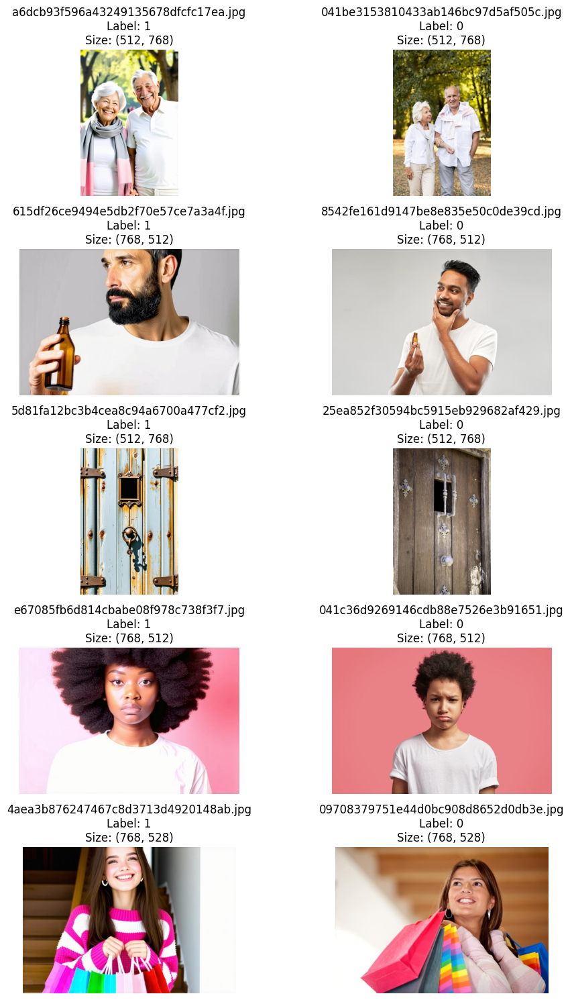

‼️Entire Dataset follows '1 then 0' order pairing.



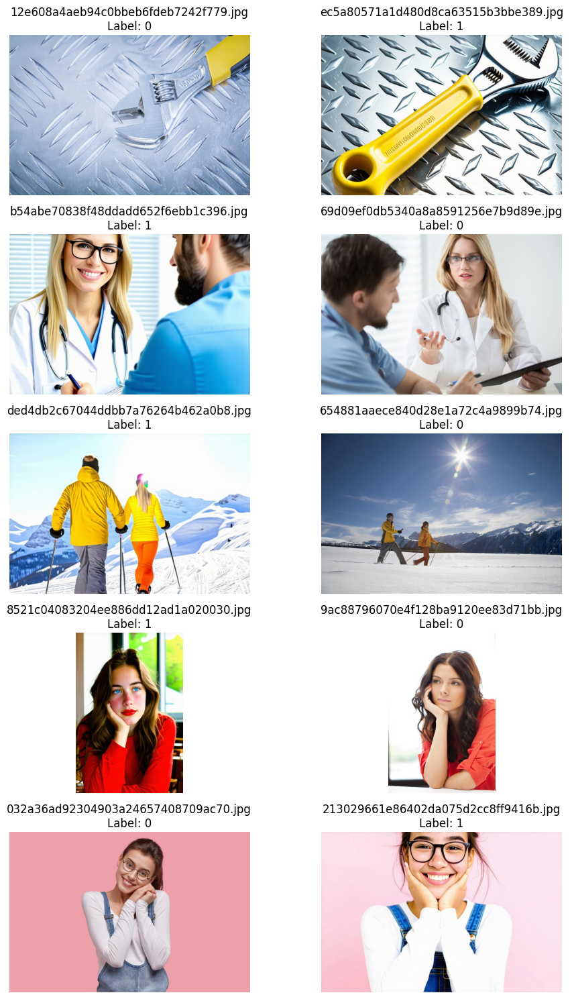

In [ ]:
df = pd.read_csv(train_path, dtype={'file_name': str})
print(f"‼️Dataset Shape: {df.shape}\n")

# Unique labels
print(f"‼️Labels Available: {df['label'].unique()}\n")

# Check for missing values
print(f"‼️Missing values:\n{df.iloc[1:].isnull().sum()}\n")

# Class ratio
class_counts = df['label'].value_counts()
print(f"‼️Class distribution:\n{class_counts}\n")

# Compute ratio (0:1)
ratio = class_counts[0] / class_counts[1] if 1 in class_counts else "Only 0s"
print(f"‼️Class Ratio (0 [Real]: 1 [AIG]): {ratio}")
if ratio == 1.0: print("Dataset is balanced!\n")

transform = transforms.Compose([
    transforms.ToTensor()
])
dataset = AIdentifyDataset(train_path, root_dir, transform=transform)

# Function to Plot First 10 Images
def plot_first_10():
    fig, axes = plt.subplots(5, 2, figsize=(10, 15))  # 5 rows, 2 columns
    for i in range(10):
        image, label, img_path = dataset[i]  # Get data
        img = transforms.ToPILImage()(image)  # Convert tensor to image
        axes[i // 2, i % 2].imshow(img)
        axes[i // 2, i % 2].set_title(f"{img_path.split('/')[-1]}\nLabel: {label}\nSize: {img.shape}")
        axes[i // 2, i % 2].axis("off")
    plt.tight_layout()
    plt.show()

# Function to Check Order (1 then 0) Pairing
def check_order():
    labels = np.array(df["label"])  # Extract labels directly from CSV (faster than dataset iteration)
    
    # Check every pair (1,0) throughout the dataset
    pairs = np.column_stack((labels[:-1:2], labels[1::2]))  # Create label pairs
    incorrect_indices = np.where((pairs[:, 0] != 1) | (pairs[:, 1] != 0))[0] * 2  # Find incorrect pairs
    
    if len(incorrect_indices) == 0:
        print("‼️Entire Dataset follows '1 then 0' order pairing.\n")
    else:
        print("‼️Order mismatch found at indices:", incorrect_indices)
        for idx in incorrect_indices[:5]:  # Show first 5 issues
            print(f"Issue at index {idx}: {labels[idx]}, {labels[idx + 1]}")

# Function to Plot 5 Random Pairs
def plot_random_pairs():
    fig, axes = plt.subplots(5, 2, figsize=(10, 15))  # 5 rows, 2 columns
    indices = random.sample(range(len(dataset) - 1), 5)  # Get 5 random indices

    for i, idx in enumerate(indices):
        image1, label1, img_path1 = dataset[idx]

        # Original ordering is 1 then 0 so if 1, compare with next row. If 0, compare with previous row
        if label1 == 1:
            idx2 = idx + 1 if idx + 1 < len(dataset) else idx - 1  # Compare with next
        else:
            idx2 = idx - 1 if idx - 1 >= 0 else idx + 1  # Compare with previous
        
        image2, label2, img_path2 = dataset[idx2]

        # Convert tensor to image
        img1 = transforms.ToPILImage()(image1)
        img2 = transforms.ToPILImage()(image2)

        axes[i, 0].imshow(img1)
        axes[i, 0].set_title(f"{img_path1.split('/')[-1]}\nLabel: {label1}")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(img2)
        axes[i, 1].set_title(f"{img_path2.split('/')[-1]}\nLabel: {label2}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()

plot_first_10()
check_order()
plot_random_pairs()


The provided dataset is of high quality — there are no missing values or class imbalance issues.

However, several important considerations must be noted:

Paired and Alternating Samples:
- The dataset appears to be ordered such that if an image is labeled 1, the image immediately before or after it is labeled 0, and vice versa. This alternating pattern implies the images are likely related pairs (e.g., similar or variant versions). If not handled properly during dataset splitting, this can result in data leakage, where related images appear in both the training and validation/test sets. This could lead the model to learn shortcut correlations, such as: "If I’ve seen one version labeled 0 in training, a similar image in validation is likely 1." This issue is also raised in the [competition discussion](https://www.kaggle.com/competitions/detect-ai-vs-human-generated-images/discussion/561128).

Bias Toward Human Subjects:
- Upon visual inspection of 10 example pairs, 8 depict human subjects (80%). While the task is binary (AIGI vs Real) and overall class balance is maintained, subject matter (like humans) appears duplicated across pairs. This introduces latent bias, effectively over-representing specific content types in both classes. Careful stratified splitting that accounts for subject diversity is required.

Inconsistent Image Sizes:
- Although the model expects fixed-size inputs and outputs, the raw image dimensions vary across samples. This necessitates a standard preprocessing pipeline to resize images consistently.

Stylistic Patterns in AIGI Images:
- Just visually, AI-generated images tend to be:
    - More vibrant in color
    - More cartoon-like or stylized
    - Sharper or overly photorealistic

We will investigate these characteristics further computationally, to analyze their potential as discriminative features.

# Naive Attempts with normal splitting

Normal splitting refers to the standard 80% training, 10% val, 10% test

In [ ]:
transform_base = transforms.Compose([
    transforms.Resize(224, interpolation=InterpolationMode.BICUBIC),
    transforms.CenterCrop(224), # Focus on center (main content) instead of relying on environment, etc
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), # ImageNet normalization
    
])

full_dataset = AIdentifyDataset(train_path, root_dir, transform=transform_base)

train_size = int(0.8 * len(full_dataset))
val_size = int(0.1 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size 
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])
submit_dataset = AIdentifyDataset(submit_path, root_dir, transform=transform_base, submit=True)

print(f"Total Samples: {len(full_dataset)}")
print(f"Training Samples: {len(train_dataset)}")
print(f"Validation Samples: {len(val_dataset)}")
print(f"Testing Samples: {len(test_dataset)}")

## Naive ViT 

[AN IMAGE IS WORTH 16X16 WORDS: TRANSFORMERS FOR IMAGE RECOGNITION AT SCALE](https://arxiv.org/pdf/2010.11929) 
- Unlike convolutional networks, Vision Transformers (ViT) process images by splitting them into sequences of patches and treating them like tokens in NLP. This eliminates the need for convolutions, enabling ViTs to achieve competitive performance on image classification tasks "while requiring substantially fewer computational resources to train" 
- Transformers "lack some of the inductive biases inherent to CNNs, such as translation equivariance and locality, and therefore do not generalize well when trained on insufficient amounts of data."
    - In CNNs, locality, 2D neighborhood structure, and translation equivariance are baked into each layer throughout the whole model. 
    - In ViT, 
        - Only use locality in their MLP layers, not in self-attention.
        - Treat image patches globally, without inherent spatial understanding.
        - depend on learned position embeddings which initially lack true 2D awareness, requiring large datasets to learn spatial relationships from scratch
- Attention layers in ViT can be viewed as analogous to receptive fields in CNNs. Attention distance can be measured by "computing the average distance in image space across which information is integrated, based on the attention weights". Early attention heads show localized behavior, resembling early CNN filters.

In [ ]:
import timm

epochs = 10
lr = 5e-5
batch_size = 32
train_loader, val_loader, test_loader, submit_loader = get_loaders(batch_size=batch_size)

class ViTClassifier(nn.Module):
    def __init__(self, num_classes=2):
        super(ViTClassifier, self).__init__()
        self.model = timm.create_model("vit_base_patch16_224", pretrained=True)  

        # Modify the classifier head for binary classification
        in_features = self.model.head.in_features
        self.model.head = nn.Linear(in_features, num_classes)  

    def forward(self, x):
        return self.model(x)

model = ViTClassifier().to(device)
criterion = nn.CrossEntropyLoss()  
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
# (Reduce LR if validation loss plateaus)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)
print(model)


ViTClassifier(
  (model): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (patch_drop): Identity()
    (norm_pre): Identity()
    (blocks): Sequential(
      (0): Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (q_norm): Identity()
          (k_norm): Identity()
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (ls1): Identity()
        (drop_path1): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "naive_vit",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler, 
    num_epochs=epochs, 
    patience=3,  
    device=device
)

Validation Epoch 1: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]


Epoch [1/10] Train Loss: 0.0411 | Train Acc: 0.9850 | Val Loss: 0.0285 | Val Acc: 0.9929 | Val F1: 0.9929


Validation Epoch 2: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]


Epoch [2/10] Train Loss: 0.0168 | Train Acc: 0.9944 | Val Loss: 0.0140 | Val Acc: 0.9954 | Val F1: 0.9954


Validation Epoch 3: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]


Epoch [3/10] Train Loss: 0.0147 | Train Acc: 0.9952 | Val Loss: 0.0124 | Val Acc: 0.9966 | Val F1: 0.9966


Validation Epoch 4: 100%|██████████| 250/250 [00:49<00:00,  5.01it/s]


Epoch [4/10] Train Loss: 0.0121 | Train Acc: 0.9956 | Val Loss: 0.0138 | Val Acc: 0.9959 | Val F1: 0.9959


Validation Epoch 5: 100%|██████████| 250/250 [00:49<00:00,  5.00it/s]


Epoch [5/10] Train Loss: 0.0093 | Train Acc: 0.9971 | Val Loss: 0.0177 | Val Acc: 0.9941 | Val F1: 0.9941


Validation Epoch 6: 100%|██████████| 250/250 [00:49<00:00,  5.00it/s]

Epoch [6/10] Train Loss: 0.0094 | Train Acc: 0.9968 | Val Loss: 0.0429 | Val Acc: 0.9880 | Val F1: 0.9880
Early stopping triggered.


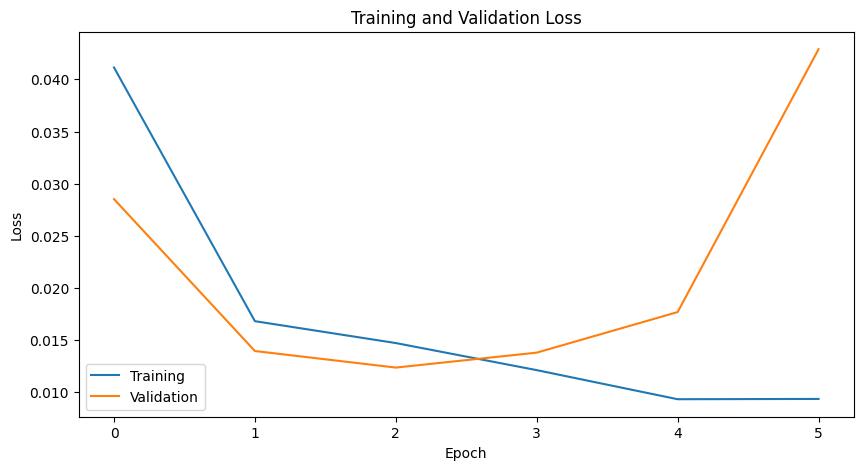

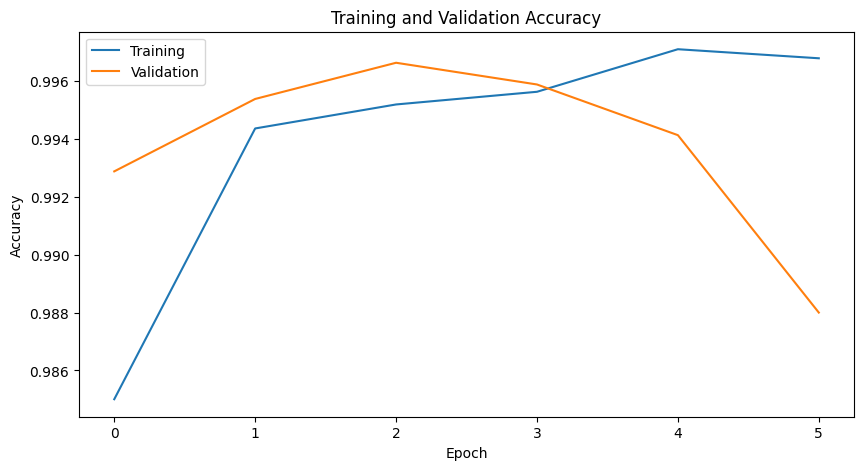

In [ ]:
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

In [ ]:
test_model("naive_vit", model, test_loader)

<ipython-input-6-4c7f6a351349>:192: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 25

Test F1: 0.9965


In [ ]:
submit_model("naive_vit", model, submit_loader)

<ipython-input-6-4c7f6a351349>:213: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 17

This Naive ViT implementation scored 
- Val F1: 0.9880
- Test F1: 0.9965
- Public Submission Score: 0.30232 (Much worse than random guess!)

The drastic drop in performance indicates severe overfitting. The ViT model may have memorized generator-specific features from training images rather than learning generalizable features that distinguish AI-generated from real images.

## Baseline: Naive Regnet

[Implementation Reference](https://www.kaggle.com/code/alexkalita/0-73273-regnet-startpoint-gpu?scriptVersionId=223077723#Loss-and-accuracy)

[RegNet Paper](https://openaccess.thecvf.com/content_CVPR_2020/papers/Radosavovic_Designing_Network_Design_Spaces_CVPR_2020_paper.pdf)

Why RegNet
- Created through a systematic design space exploration (Quantitative Principle) rather than manual architecture engineering, resulting in a more optimized network structure.
- Scales efficiently across different computational constraints, allowing for easy experimentation with various model sizes.
- Delivers better accuracy for a given computational budget compared to many other CNN architectures.
- Has a surprisingly simple design with regular network patterns, making it easy to implement and tune.
- Excels at capturing both low-level texture details and high-level semantic features - potentially important for detecting AI artifacts.

In [1]:
epochs = 5
lr = 5e-5
gamma = 0.7
batch_size = 32

# Load pre-trained Regnet
model = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma)
train_loader, val_loader, test_loader, submit_loader = get_loaders(batch_size=batch_size)
print(model)


RegNet(
  (stem): SimpleStemIN(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (trunk_output): Sequential(
    (block1): AnyStage(
      (block1-0): ResBottleneckBlock(
        (proj): Conv2dNormActivation(
          (0): Conv2d(32, 64, kernel_size=(1, 1), stride=(2, 2), bias=False)
          (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (f): BottleneckTransform(
          (a): Conv2dNormActivation(
            (0): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
          )
          (b): Conv2dNormActivation(
            (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=4, bias=False)
           

In [ ]:
# Freeze all layers initially
for param in model.parameters():
    param.requires_grad = False

block4_section1 = getattr(model.trunk_output.block4, 'block4-1')
block4_section1.requires_grad_(True)

num_ftrs = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),      # First fully connected layer
    nn.SiLU(),                     # Activation function
    nn.Dropout(0.4),               # Dropout for regularization
    nn.Linear(512, 2)              # 2 classes
) 

model.to(device)
print()

Downloading: "https://download.pytorch.org/models/regnet_y_800mf-58fc7688.pth" to /root/.cache/torch/hub/checkpoints/regnet_y_800mf-58fc7688.pth
100%|██████████| 24.8M/24.8M [00:00<00:00, 174MB/s]


In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "naive_regnet",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler,
    num_epochs=epochs, 
    patience=3,  
    device=device
)

Validation Epoch 1: 100%|██████████| 250/250 [00:24<00:00, 10.33it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [1/5] Train Loss: 0.7060 | Train Acc: 0.4745 | Val Loss: 0.7037 | Val Acc: 0.4608 | Val F1: 0.4377


Validation Epoch 2: 100%|██████████| 250/250 [00:24<00:00, 10.24it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [2/5] Train Loss: 0.7056 | Train Acc: 0.4736 | Val Loss: 0.7042 | Val Acc: 0.4586 | Val F1: 0.4310


Validation Epoch 3: 100%|██████████| 250/250 [00:24<00:00, 10.39it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [3/5] Train Loss: 0.7056 | Train Acc: 0.4739 | Val Loss: 0.7040 | Val Acc: 0.4628 | Val F1: 0.4382


Validation Epoch 4: 100%|██████████| 250/250 [00:24<00:00, 10.31it/s]

Epoch [4/5] Train Loss: 0.7056 | Train Acc: 0.4723 | Val Loss: 0.7038 | Val Acc: 0.4701 | Val F1: 0.4459
Early stopping triggered.


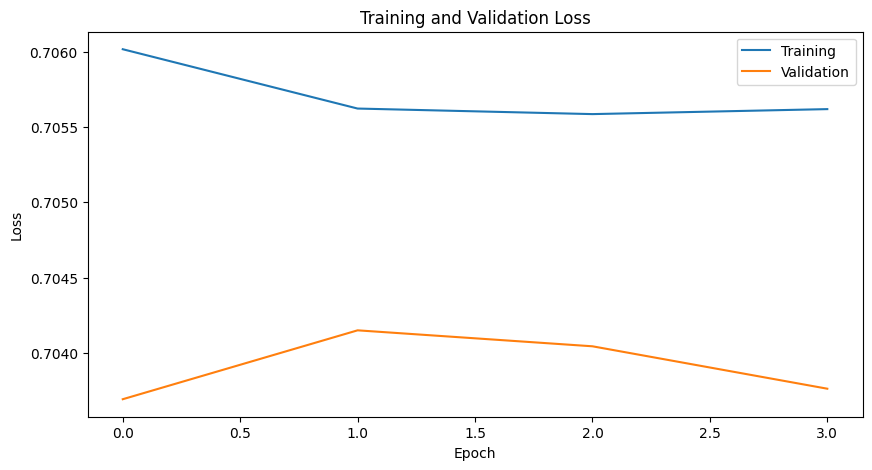

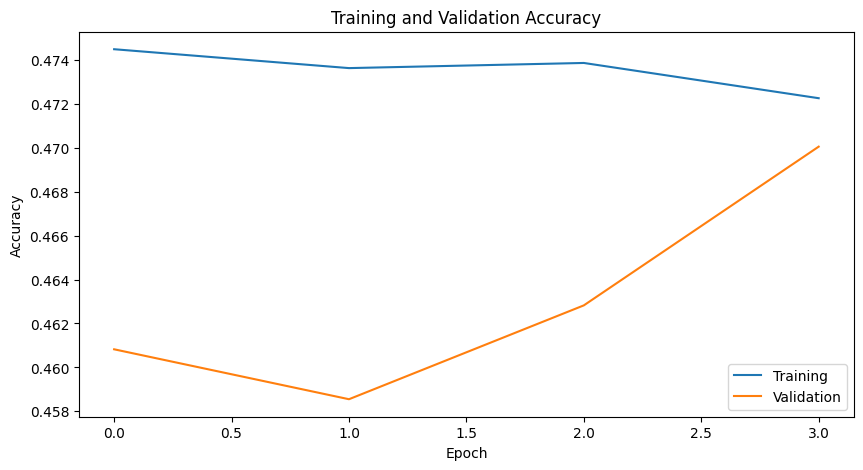

In [ ]:
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

In [ ]:
test_model("naive_regnet", model, test_loader)

<ipython-input-6-4c7f6a351349>:192: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 25

Test F1: 0.5566


In [ ]:
submit_model("naive_regnet", model, submit_loader)

<ipython-input-6-4c7f6a351349>:213: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 17

This Naive Regnet implementation scored 
- Val F1: 0.4459
- Test F1: 0.5566
- Public Submission Score: 0.59381 (a bit better than random guess!)

This indicates that the RegNet architecture may have stronger generalization capabilities than ViT, even though it initially showed lower validation and test scores.

In fact, its ability to outperform expectations on unseen data is quite impressive—suggesting that it has learned to capture robust, semantically meaningful features. As such, RegNet serves as a strong and reliable baseline model.

# Alternative Splitting Strategies

It is essential to control the distribution of content during dataset splitting to prevent data leakage and maintain category balance. Without a careful strategy,
- Random splits of images can cause information leakage (because dataset contains paired real/AI images).
- Additionally, random splits of <b>paired</b> (real/AI) images can cause imbalance in category proportion (Eg. Humans were previously found to be 80% of dataset)

Proposed Strategies (Content-aware splitting)
1. Leverage only Real images for similarity-based grouping

    Since AI-generated (AIG) images often mimic their real counterparts and models are typically trained on real images, it's more reliable to cluster based on real ones.

2. Find similar Real images using one of the following:

    - Pretrained classifiers or object detectors (YOLO)
    - BLIP (Bootstrapped Language Image Pretraining) to generate captions for Real (label=0) images, which can then be:
        - Converted into text embeddings.
        - Clustered based on vector embedding similarity.
    - [Image to Image similarity](https://www.youtube.com/watch?v=aACebENHlrs)

3. Once similar Real images are grouped, assign their corresponding AIG pairs (label=1) to the same group for consistency.

In [ ]:
df = pd.read_csv(train_path)
real_images = df[df["label"] == 0]["file_name"].tolist()

## YOLO Classification Model

Unique labels: 862



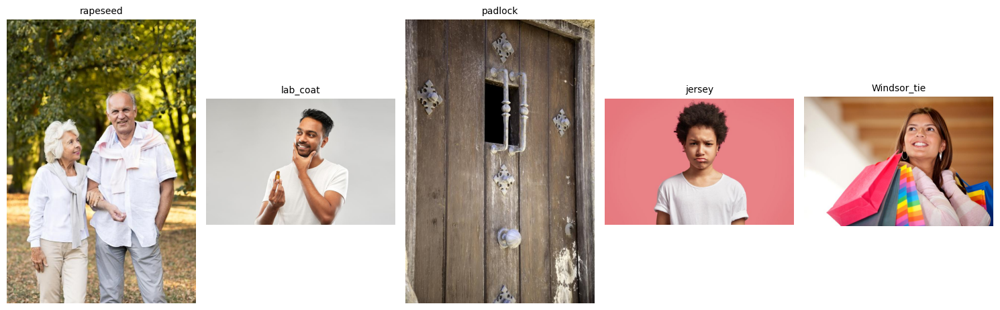

In [ ]:
%pip install ultralytics
from ultralytics import YOLO
from PIL import Image

model = YOLO("yolo11x-cls.pt").to(device)
yolo_labels = []

def round_to_nearest_32(x):
    """Rounds a number to the nearest multiple of 32, as YOLO has a stride of 32"""
    return max(32, int(round(x / 32) * 32))

def resize_keeping_aspect(image, target_size=640):
    """
    Resizes image while maintaining aspect ratio.
    - If width > height, scale width to 640 and adjust height
    - Otherwise, scale height to 640 and adjust width
    - Ensure both dimensions are divisible by 32
    """
    width, height = image.size
    if width > height:
        new_width = target_size
        new_height = int(height * (target_size / width))
    else:
        new_height = target_size
        new_width = int(width * (target_size / height))

    new_width = round_to_nearest_32(new_width)
    new_height = round_to_nearest_32(new_height)

    return image.resize((new_width, new_height), Image.LANCZOS)

for img_path in real_images:
    img = Image.open(os.path.join(root_dir, img_path)).convert("RGB")
    img = resize_keeping_aspect(img)
    img_tensor = transforms.ToTensor()(img).unsqueeze(0)

    results = model(img_tensor, verbose=False)
    top_label = results[0].names[results[0].probs.top1]  # Get highest probability label

    yolo_labels.append((img_path, top_label))

yolo_df = pd.DataFrame(yolo_labels, columns=["file_name", "yolo_label"])
print(f"Unique labels: {yolo_df['yolo_label'].nunique()}\n")


fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for idx, (file_name, label) in enumerate(yolo_labels[:5]):
    image = Image.open(os.path.join(root_dir, file_name)).convert("RGB")
    axes[idx].imshow(image)
    axes[idx].axis("off")
    axes[idx].set_title(label, fontsize=10)
plt.tight_layout()
plt.show()

Conclusion

YOLO was not trained on a sufficiently comprehensive dataset, which limits its ability to produce high-confidence predictions or accurately classify the images. As a result, the detected classes may be incorrect or inconsistent, making it reasonable that the clustering results are unclear or not well-defined.

## BLIP

The embedding model was chosen as it attained [No. 4 on the HuggingFace MTEB leaderboard](https://huggingface.co/spaces/mteb/leaderboard) with 560M (low) number of parameters, while achieving good performance.

In [ ]:
from sentence_transformers import SentenceTransformer

# Cluster based on semantic similarities between classes Eg. dog and wolf vs dog and car
embed_model = SentenceTransformer('intfloat/multilingual-e5-large-instruct')

In [ ]:
%%capture capt
from transformers import BlipProcessor, BlipForConditionalGeneration

# Load BLIP model
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model_blip = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

# Store BLIP captions and embeddings
blip_captions = []
caption_embeddings = []

for img_path in real_images:
    img = Image.open(os.path.join(root_dir, img_path)).convert("RGB")
    
    # Generate BLIP caption
    inputs = processor(img, return_tensors="pt").to("cuda")
    out = model_blip.generate(**inputs)
    caption = processor.batch_decode(out, skip_special_tokens=True)[0]
    
    # Compute text embeddings
    embedding = embed_model.encode(caption, convert_to_tensor=True)

    blip_captions.append((img_path, caption))
    caption_embeddings.append(embedding)

blip_df = pd.DataFrame(blip_captions, columns=["file_name", "blip_caption"])

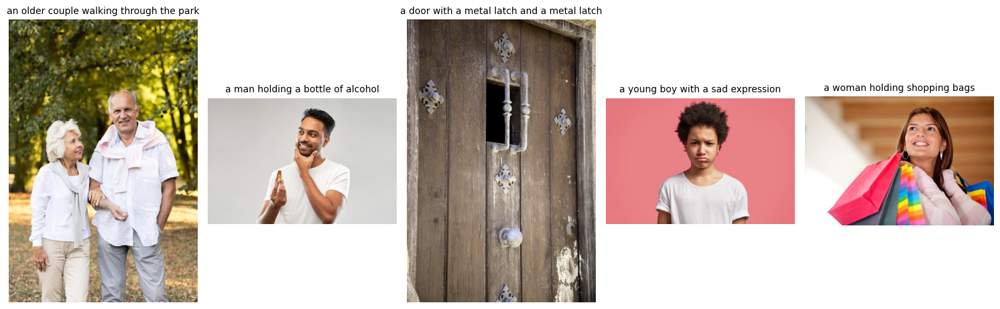

,file_name,blip_caption
0,train_data/041be3153810433ab146bc97d5af505c.jpg,an older couple walking through the park
1,train_data/8542fe161d9147be8e835e50c0de39cd.jpg,a man holding a bottle of alcohol
2,train_data/25ea852f30594bc5915eb929682af429.jpg,a door with a metal latch and a metal latch
3,train_data/041c36d9269146cdb88e7526e3b91651.jpg,a young boy with a sad expression
4,train_data/09708379751e44d0bc908d8652d0db3e.jpg,a woman holding shopping bags


In [ ]:
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for i, (file_name, caption) in enumerate(blip_df[:5].values):
    image = Image.open(os.path.join(root_dir, file_name)).convert("RGB")
    axes[i].imshow(image)
    axes[i].axis("off")
    axes[i].set_title(caption, fontsize=10)
plt.tight_layout()
plt.show()

blip_df.head()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity

def cluster_images_by_similarity(caption_embeddings, threshold):
   """
   Clusters image embeddings based on cosine similarity threshold.
   
   Args:
       caption_embeddings: NumPy array of embedding vectors
       threshold: Similarity threshold for clustering (default: 0.8)
       
   Returns:
       tuple containing:
           - filtered_categories: List of sets containing indices of similar images
           - categories: Original categories before filtering
           - avg_per_cat: Average images per category used for filtering
   """
   # Convert embeddings to numpy if they're not already
   if not isinstance(caption_embeddings, np.ndarray):
       caption_embeddings = np.array([embedding.cpu().numpy() for embedding in caption_embeddings])
   
   # Initialize clustering variables
   categories = []
   remaining_indices = set(range(len(caption_embeddings)))

   # Cluster images by similarity
   while remaining_indices:
       idx = np.random.choice(list(remaining_indices))  # Pick a random image
       reference_embedding = caption_embeddings[idx]

       # Compute cosine similarity with all remaining embeddings
       similarities = cosine_similarity([reference_embedding], caption_embeddings)[0]

       # Find indices above the threshold (including seed itself)
       similar_indices = {idx for idx in remaining_indices if similarities[idx] > threshold}

       # Store the category and remove these indices from remaining
       remaining_indices -= similar_indices
       categories.append(similar_indices)

   print(f"Total Categories: {len(categories)}")
   print(f"Most number of images in a category: {max(len(category) for category in categories)}")

   sorted_categories = sorted(categories, key=len, reverse=True)
   print("Top 5 largest categories:")
   for i, category in enumerate(sorted_categories[:5]):
       print(f"Category {i+1}: {len(category)} images")

   print("\nBottom 5 smallest categories:")
   for i, category in enumerate(sorted_categories[-5:]):
       print(f"Category {len(sorted_categories)-4+i}: {len(category)} images")

   # Calculate average images per category for filtering
   avg_per_cat = len(caption_embeddings)//len(categories)
   small_category_count = sum(1 for category in sorted_categories if len(category) < avg_per_cat)
   print(f"\nNumber of categories with fewer than {avg_per_cat} images: {small_category_count}")

   # Filter large categories using K-means
   filtered_categories = []

   for category in sorted_categories:
       if len(category) <= avg_per_cat:
           filtered_categories.append(category)  # Keep all images
       else:
           # Get embeddings of the images in this category
           category_indices = list(category)
           category_embeddings = np.array([caption_embeddings[i] for i in category_indices])

           num_clusters = min(len(category_embeddings), avg_per_cat)
           kmeans = KMeans(n_clusters=num_clusters, n_init=10)
           kmeans.fit(category_embeddings)

           # Select one image per cluster (closest to centroid)
           cluster_indices = []
           for cluster_id in range(avg_per_cat):
               cluster_mask = kmeans.labels_ == cluster_id
               if np.any(cluster_mask):
                   cluster_embeddings = category_embeddings[cluster_mask]
                   centroid = kmeans.cluster_centers_[cluster_id]
       
                   # Find the closest image to the centroid
                   closest_idx = np.argmin(np.linalg.norm(cluster_embeddings - centroid, axis=1))
                   original_idx = np.where(cluster_mask)[0][closest_idx]
                   cluster_indices.append(category_indices[original_idx])

           filtered_categories.append(set(cluster_indices))

   print(f"Total Categories After Filtering: {len(filtered_categories)}")
   print(f"Most number of images in a category: {max(len(category) for category in filtered_categories)}")
   print(f"Reduced from initial {len(caption_embeddings)} to current total number of images: {sum([len(c) for c in filtered_categories])}")
   
   return filtered_categories, categories, avg_per_cat

In [7]:
filtered_categories, categories, avg_per_cat = cluster_images_by_similarity(caption_embeddings, 0.8)


Total Categories: 182
Most number of images in a category: 8141
Top 5 largest categories:
Category 1: 8141 images
Category 2: 7761 images
Category 3: 5010 images
Category 4: 3322 images
Category 5: 2062 images

Bottom 5 smallest categories:
Category 192: 1 images
Category 193: 1 images
Category 194: 1 images
Category 195: 1 images
Category 196: 1 images

Number of categories with fewer than 219 images: 171
Total Categories After Filtering: 182
Most number of images in a category: 219
Reduced from initial 39975 to current total number of images: 11099



<ipython-input-68-4ef88585f208>:9: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  selected_images = random.sample(category, min(num_images, len(category)))


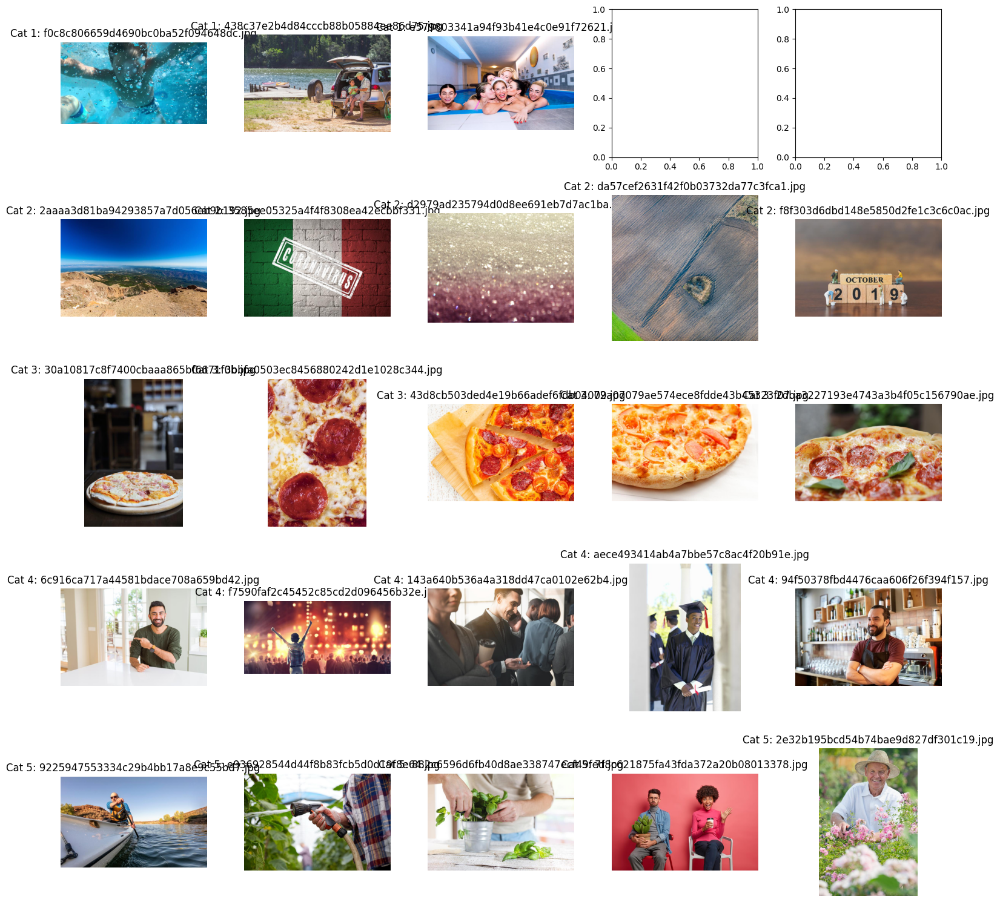

In [ ]:
num_categories = 5
num_images = 5

selected_categories = random.sample(filtered_categories, min(num_categories, len(filtered_categories)))
blip_captions = [(str(row["file_name"]), row["blip_caption"]) for _, row in blip_df[blip_df["label"] == 0].iterrows()]

fig, axes = plt.subplots(num_categories, num_images, figsize=(15, 3 * num_categories))
    
for row, category in enumerate(filtered_categories):
    selected_images = random.sample(category, min(num_images, len(category)))

    for col, img_idx in enumerate(selected_images):
        img = Image.open(os.path.join(root_dir, blip_captions[img_idx][0]))
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
        axes[row, col].set_title(f"Cat {row + 1}: {os.path.basename(blip_captions[img_idx][1])}")

plt.tight_layout()
plt.show()

In [ ]:
filtered_categories, categories, avg_per_cat = cluster_images_by_similarity(caption_embeddings, 0.9)


Total Categories: 7633
Most number of images in a category: 297
Top 5 largest categories:
Category 1: 297 images
Category 2: 276 images
Category 3: 257 images
Category 4: 234 images
Category 5: 233 images

Bottom 5 smallest categories:
Category 7629: 1 images
Category 7630: 1 images
Category 7631: 1 images
Category 7632: 1 images
Category 7633: 1 images

Number of categories with fewer than 5 images: 5936
Total Categories After Filtering: 7633
Most number of images in a category: 5
Reduced from initial 39975 to current total number of images: 18322



<ipython-input-90-4ef88585f208>:9: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  selected_images = random.sample(category, min(num_images, len(category)))


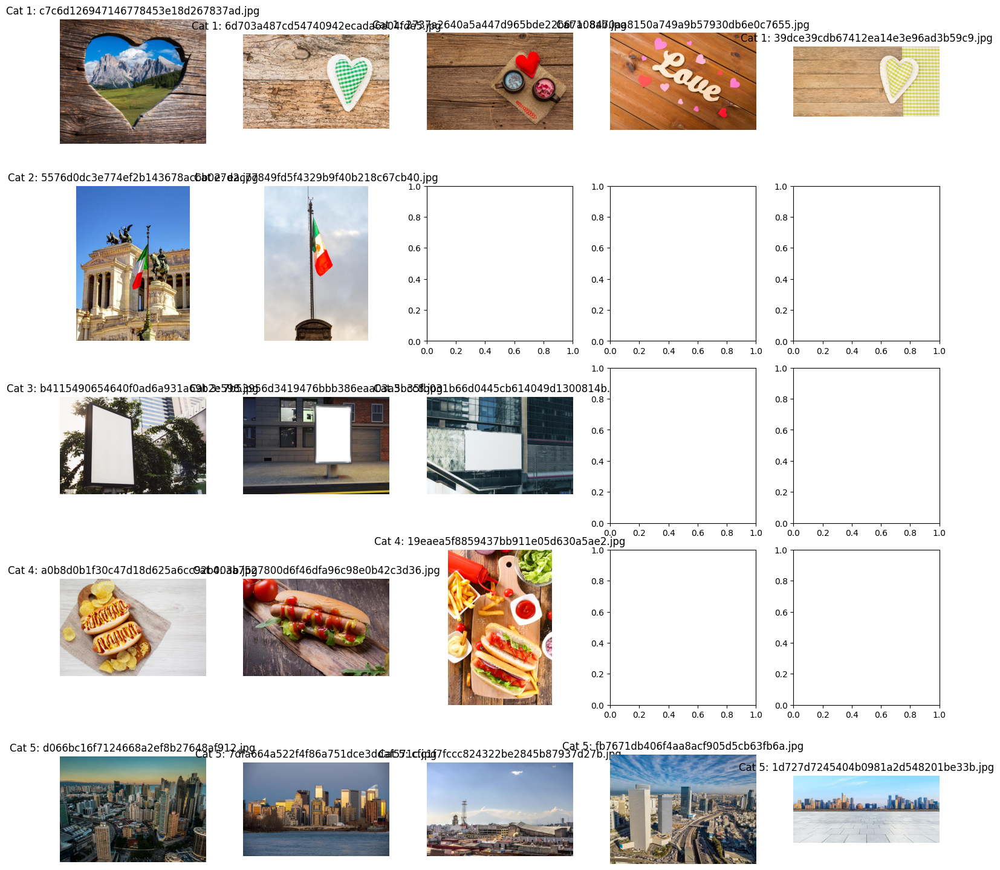

In [ ]:
num_categories = 5
num_images = 5

selected_categories = random.sample(categories, min(num_categories, len(categories)))

fig, axes = plt.subplots(num_categories, num_images, figsize=(15, 3 * num_categories))
    
for row, category in enumerate(selected_categories):
    selected_images = random.sample(category, min(num_images, len(category)))

    for col, img_idx in enumerate(selected_images):
        img = Image.open(os.path.join(root_dir, blip_captions[img_idx][0]))
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
        axes[row, col].set_title(f"Cat {row + 1}: {os.path.basename(blip_captions[img_idx][0])}")

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

SIMILARITY_THRESHOLD = 0.8

def add_aig_pairs(indices, dataset):
    for idx in indices:
        if idx < len(df):  # Ensure index is valid
            real_img = df.iloc[(idx * 2) + 1]["file_name"]
            aig_idx = idx * 2
            if aig_idx < len(df):  # Ensure AIG index is valid
                aig_img = df.iloc[aig_idx]["file_name"]
                dataset.append((aig_img, 1))  # Add AIG image

            dataset.append((real_img, 0))  # Add real image

df = pd.read_csv(train_path)
train_set, val_set, test_set = [], [], []

for category in categories:
    indices = list(category)
    num_images = len(indices)
    if num_images >= 10:  # Enough images for 80-10-10 split
        train, temp = train_test_split(indices, test_size=0.2)
        val, test = train_test_split(temp, test_size=0.5)
    else:  # Too few images → Round down & prioritize Validation
        num_train = max(1, int(num_images * 0.8))  # Round down training images
        num_val_test = num_images - num_train  # Remaining for val & test

        if num_val_test == 0:  # If only 1 image, keep in train
            train, val, test = indices, [], []
        else:
            num_val = num_val_test // 2  # Split equally
            num_test = num_val_test - num_val  # Ensure balance

            random.shuffle(indices)  # Shuffle to randomize
            train = indices[:num_train]
            val = indices[num_train:num_train + num_val]
            test = indices[num_train + num_val:]

    add_aig_pairs(train, train_set)
    add_aig_pairs(val, val_set)
    add_aig_pairs(test, test_set)

train_df = pd.DataFrame(train_set, columns=["file_name", "label"])
val_df = pd.DataFrame(val_set, columns=["file_name", "label"])
test_df = pd.DataFrame(test_set, columns=["file_name", "label"])

os.makedirs(f"blip_similarity/{SIMILARITY_THRESHOLD}_200_diverse", exist_ok=True)
train_df.to_csv(f"blip_similarity/{SIMILARITY_THRESHOLD}_200_diverse/train_split.csv", index=False)
val_df.to_csv(f"blip_similarity/{SIMILARITY_THRESHOLD}_200_diverse/val_split.csv", index=False)
test_df.to_csv(f"blip_similarity/{SIMILARITY_THRESHOLD}_200_diverse/test_split.csv", index=False)

We started with a total of 79,950 images, balanced between AI-generated and real (i.e., 39,975 real images).

Using BLIP to caption images and K-means clustering them based on cosine similarity:
- Threshold = 0.8:
    - Only 182 categories formed.
    - Average: ~219 images per category.
    - However, one category had 8,141 images, indicating major imbalance.

- Threshold = 0.9:
    - Resulted in 7,633 categories.
    - Average: ~5 images per category.
    - Yet, the largest category had 297 images.

This resulted in extreme sparsity: most categories contained only 1 image, making it infeasible to reserve some for validation or testing.

Additionally, the large number of categories and the uneven distribution indicates redundancy in the dataset — many images are semantically very similar.
This justifies using K-means to reduce redundancy and extract more representative category centroids.

By selecting 219 image pairs (AI + Real) across 182 unique categories, we reduced the dataset from 79,950 to a clean and diverse 22,198 images.

Split breakdown (80/10/10):
- Training: 17,620 images
- Validation: 2,289 images
- Test: 2,289 images

This approach offers better semantic diversity while reducing overfitting and improving generalization.

## Image to Image Similarity

Extracted Features Shape: (39975, 784)


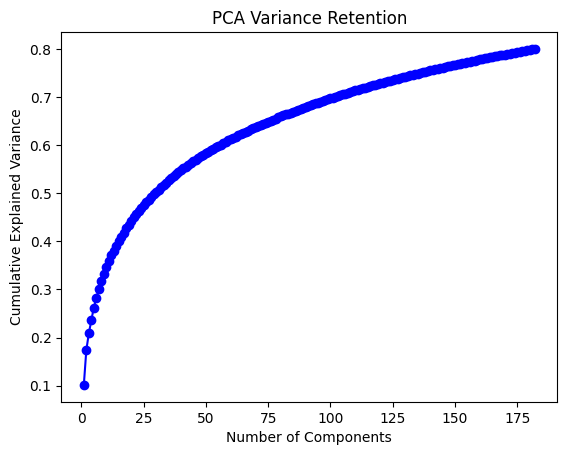

In [ ]:
import torch.nn.functional as F
from sklearn.decomposition import PCA

class RealImagesDataset(Dataset):
    def __init__(self, train_path, root_dir, transform=None):
        self.data = pd.read_csv(train_path)
        self.data = self.data[self.data["label"] == 0] 
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_name = self.data.iloc[idx]["file_name"]
        img_path = os.path.join(self.root_dir, image_name)
        image = Image.open(img_path).convert("RGB")
        
        if self.transform:
            image = self.transform(image)

        return image, img_path, image_name

model = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
model = nn.Sequential(*list(model.children())[:-1])  # Remove final classification layer
model.to(device)
model.eval()  

real_dataset = RealImagesDataset(train_path, root_dir, transform=imagenet_transform)
real_loader = DataLoader(real_dataset, batch_size=32, shuffle=False, num_workers=4)
realdataset_mean, realdataset_std = compute_dataset_mean_std(real_loader, device=device)
real_dataset.transform = imagenet_transform

# --- 5️⃣ Extract Features ---
all_features = []
all_image_paths = []

with torch.no_grad():
    for images, paths, _ in real_loader:
        images = images.to(device)
        features = model(images)  
        features = F.normalize(features, p=2, dim=1)  # Normalize for cosine similarity
        all_features.append(features.cpu().numpy())
        all_image_paths.extend(paths)

# Convert to numpy array
all_features = np.vstack(all_features).reshape(39975, 784)
print(f"Extracted Features Shape: {all_features.shape}")  

pca = PCA(n_components=0.8) 
features_pca = pca.fit_transform(all_features)

# Plot Cumulative Explained Variance
cum_explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1, len(cum_explained_variance) + 1), cum_explained_variance, marker='o', linestyle='-', color='blue')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Variance Retention")
plt.show()

Total Categories: 10495
Most number of images in a category: 976


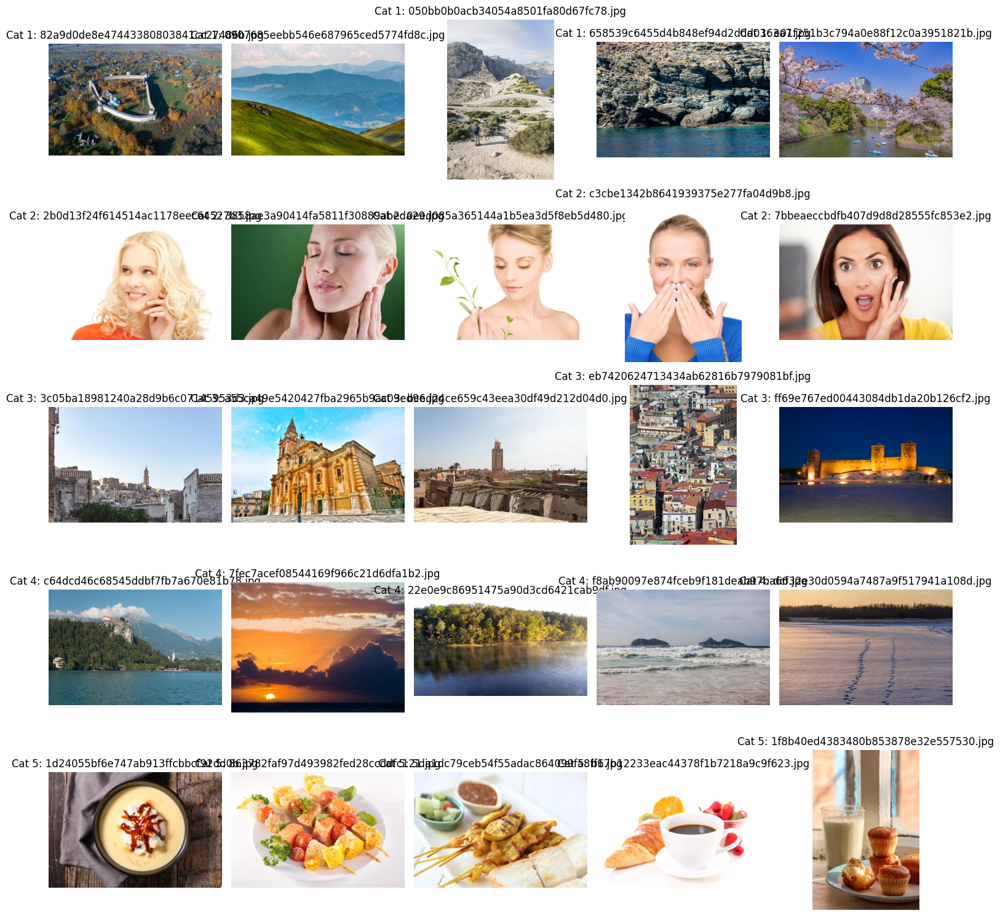

In [ ]:
from scipy.spatial.distance import cosine

SIMILARITY_THRESHOLD = 0.65

# Categorize Images Based on Cosine Similarity of Content
remaining_indices = set(range(len(features_pca)))
categories = []

while remaining_indices:
    idx = np.random.choice(list(remaining_indices))  # Pick a random image
    reference_vector = features_pca[idx]  # Use its feature vector
    category = []

    # Compute cosine distances & categorize
    for i in list(remaining_indices):
        similarity = 1 - cosine(reference_vector, features_pca[i])
        if similarity >= SIMILARITY_THRESHOLD:  # Threshold for similarity
            category.append(i)

    # Remove categorized images from remaining indices
    remaining_indices -= set(category)
    categories.append(category)

print(f"Total Categories: {len(categories)}")
print(f"Most number of images in a category: {max(len(category) for category in categories)}")
################################################################################################
num_categories = 5
num_images = 5
selected_categories = random.sample(categories, min(num_categories, len(categories)))

fig, axes = plt.subplots(num_categories, num_images, figsize=(15, 3 * num_categories))
    
for row, category in enumerate(sorted(categories, key=len, reverse=True)[:num_categories]):
    selected_images = random.sample(category, min(num_images, len(category)))

    for col, img_idx in enumerate(selected_images):
        img = Image.open(all_image_paths[img_idx])
        axes[row, col].imshow(img)
        axes[row, col].axis("off")
        axes[row, col].set_title(f"Cat {row + 1}: {os.path.basename(all_image_paths[img_idx])}")

plt.tight_layout()
plt.show()

This splitting strategy appears reasonable, as the grouped images do exhibit high visual similarity — with clear categories like landscapes, women, buildings, and food emerging. However, even at a lower similarity threshold of 0.65, the clustering is already very sparse (10,495 categories from 39,950 data points), meaning many clusters contain fewer than 5 images, making it difficult to allocate samples into train, validation, and test sets.

Additionally, because the clustering relies solely on low-level visual features (i.e., pixel-based similarity), it lacks the semantic richness that text-based vector embeddings offer. As a result, this method captures only superficial patterns and fails to represent deeper contextual or conceptual relationships between images.

# Naive Attempts with BLIP splitting

In [ ]:
train_dataset = AIdentifyDataset("/AIdentify_data/blip_similarity/0.8/train_split.csv", root_dir, transform=imagenet_transform)
val_dataset = AIdentifyDataset("/AIdentify_data/blip_similarity/0.8/val_split.csv", root_dir, transform=imagenet_transform)
test_dataset = AIdentifyDataset("/AIdentify_data/blip_similarity/0.8/test_split.csv", root_dir, transform=imagenet_transform)
train_loader, val_loader, test_loader, submit_loader = get_loaders(batch_size=batch_size)

## Naive ViT with BLIP splitting strategy 

Validation Epoch 1: 100%|██████████| 186/186 [00:37<00:00,  5.01it/s]


Epoch [1/3] Train Loss: 0.0414 | Train Acc: 0.9850 | Val Loss: 0.0106 | Val Acc: 0.9963 | Val F1: 0.9963


Validation Epoch 2: 100%|██████████| 186/186 [00:37<00:00,  5.01it/s]


Epoch [2/3] Train Loss: 0.0177 | Train Acc: 0.9939 | Val Loss: 0.0163 | Val Acc: 0.9946 | Val F1: 0.9946


Validation Epoch 3: 100%|██████████| 186/186 [00:37<00:00,  5.00it/s]


Epoch [3/3] Train Loss: 0.0165 | Train Acc: 0.9943 | Val Loss: 0.0143 | Val Acc: 0.9945 | Val F1: 0.9944


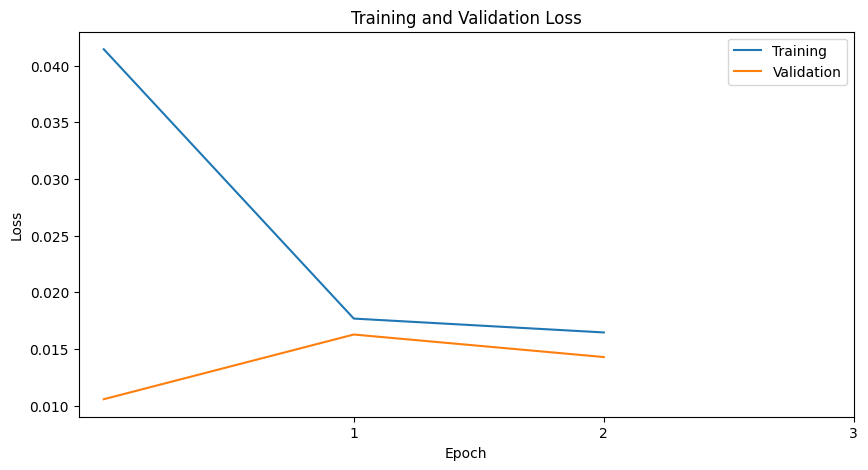

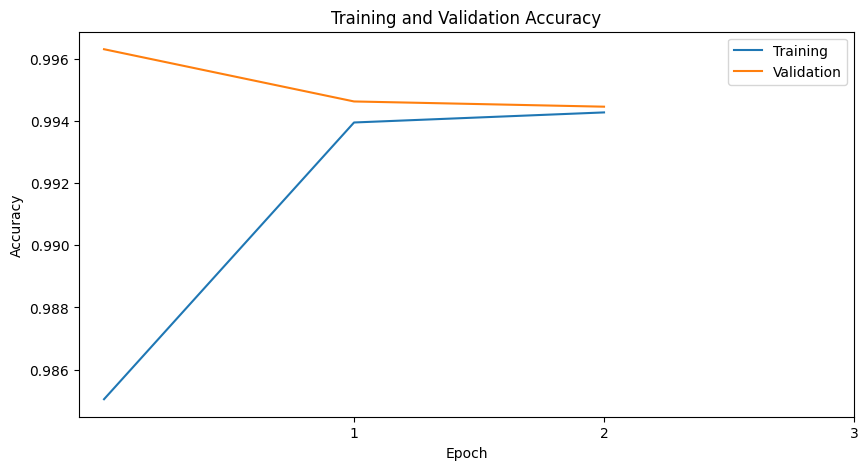

<ipython-input-2-d6845b88f197>:194: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 38

Test F1: 0.9967


Predicting: 100%|██████████| 174/174 [01:00<00:00,  2.90it/s]


In [ ]:
import timm

epochs = 3
lr = 5e-5
batch_size = 32

class ViTClassifier(nn.Module):
    def __init__(self, num_classes=2):
        super(ViTClassifier, self).__init__()
        self.model = timm.create_model("vit_base_patch16_224", pretrained=True)  

        # Modify the classifier head for binary classification
        in_features = self.model.head.in_features
        self.model.head = nn.Linear(in_features, num_classes)  

    def forward(self, x):
        return self.model(x)

model = ViTClassifier().to(device)
criterion = nn.CrossEntropyLoss()  
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
# (Reduce LR if validation loss plateaus)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "split_vit_0.8",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler, 
    num_epochs=epochs, 
    patience=3,  
    device=device
)

plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)
test_model("split_vit_0.8", model, test_loader)
submit_model("split_vit_0.8", model, submit_loader)


This Naive ViT implementation with BLIP splitting scored 
- Val F1: 0.9944
- Test F1: 0.9967
- Public Submission Score: 0.29562

This makes sense, as ViT inherently struggles with less data, as aforementioned.

## Naive Regnet with BLIP splitting strategy 

100%|██████████| 1931/1931 [02:58<00:00, 10.81it/s]


Validation Epoch 1: 100%|██████████| 186/186 [00:18<00:00, 10.08it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [1/5] Train Loss: 0.3075 | Train Acc: 0.8848 | Val Loss: 0.1635 | Val Acc: 0.9598 | Val F1: 0.9597


Validation Epoch 2: 100%|██████████| 186/186 [00:18<00:00,  9.95it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [2/5] Train Loss: 0.1497 | Train Acc: 0.9552 | Val Loss: 0.1102 | Val Acc: 0.9686 | Val F1: 0.9685


Validation Epoch 3: 100%|██████████| 186/186 [00:18<00:00,  9.93it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [3/5] Train Loss: 0.1109 | Train Acc: 0.9672 | Val Loss: 0.0855 | Val Acc: 0.9753 | Val F1: 0.9752


Validation Epoch 4: 100%|██████████| 186/186 [00:19<00:00,  9.74it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [4/5] Train Loss: 0.0935 | Train Acc: 0.9717 | Val Loss: 0.0783 | Val Acc: 0.9753 | Val F1: 0.9752


Validation Epoch 5: 100%|██████████| 186/186 [00:18<00:00,  9.92it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [5/5] Train Loss: 0.0818 | Train Acc: 0.9763 | Val Loss: 0.0683 | Val Acc: 0.9793 | Val F1: 0.9793


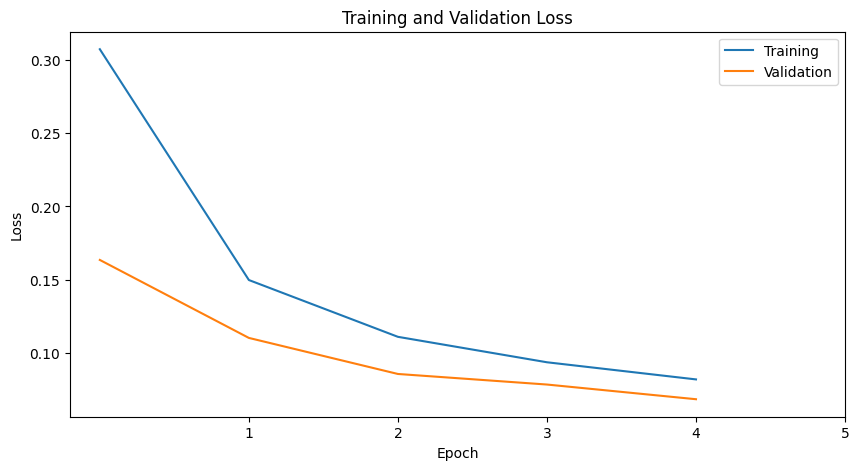

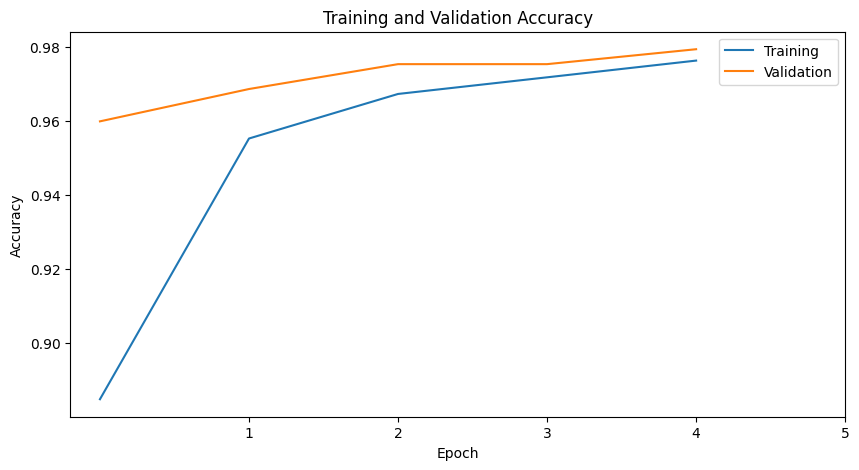

<ipython-input-2-d6845b88f197>:194: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 38

Test F1: 0.9754


Predicting: 100%|██████████| 174/174 [00:52<00:00,  3.28it/s]


In [ ]:
epochs = 5
lr = 5e-5
gamma = 0.7
batch_size = 32

model = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma)

for param in model.parameters():
    param.requires_grad = False

block4_section1 = getattr(model.trunk_output.block4, 'block4-1')
block4_section1.requires_grad_(True)

num_ftrs = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),      
    nn.SiLU(),                   
    nn.Dropout(0.4),               
    nn.Linear(512, 2)              
) 

model.to(device)
print()

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "split_regnet_0.8",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler,
    num_epochs=epochs, 
    patience=3,  
    device=device
)

plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)
test_model("split_regnet_0.8", model, test_loader)
submit_model("split_regnet_0.8", model, submit_loader)


This Naive Regnet implementation with BLIP splitting scored 
- Val F1: 0.9793
- Test F1: 0.9754
- Public Submission Score: 0.43213

Although performance is lower compared to the version using the original split, this outcome is expected—since the dataset size has been reduced from 79,950 to 17,620 samples. However, this reduction opens up more opportunity to apply extensive data augmentation, which is often more beneficial than simply relying on raw data — especially in the context of distinguishing AI-generated images from real ones, where diversity and balanced training data are key.

## CLIP ViT Large Patch14 with BLIP Splitting

While vanilla ViT underperformed due to overfitting and limited generalization, a well-known state-of-the-art variant—CLIP ViT—offered a compelling reason to revisit the architecture under a different training paradigm.

Unlike traditional ViTs, CLIP ViT:
- uses dual-tower encoders (one for images, one for text)
- Is trained using contrastive learning on 400M+ image-text pairs
    - Contrastive learning is a self-supervised learning technique that teaches models to understand the similarity and difference between data points — without needing labeled data. It pulls similar pairs closer in the feature space and pushes dissimilar pairs further apart.
- Learns to align images and text in a shared semantic space
- Demonstrates strong out-of-the-box generalization 

Given these advantages, we incorporated CLIP ViT purely as a feature extractor, leveraging its powerful pretraining without fine-tuning the model itself.

config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Validation Epoch 1: 100%|██████████| 498/498 [03:40<00:00,  2.26it/s]


Epoch [1/5] Train Loss: 0.0523 | Train Acc: 0.9809 | Val Loss: 0.0256 | Val Acc: 0.9912 | Val F1: 0.9912


Validation Epoch 2: 100%|██████████| 498/498 [03:39<00:00,  2.27it/s]


Epoch [2/5] Train Loss: 0.0340 | Train Acc: 0.9880 | Val Loss: 0.0511 | Val Acc: 0.9812 | Val F1: 0.9812


Validation Epoch 3: 100%|██████████| 498/498 [03:39<00:00,  2.27it/s]


Epoch [3/5] Train Loss: 0.0280 | Train Acc: 0.9900 | Val Loss: 0.0673 | Val Acc: 0.9781 | Val F1: 0.9781


Validation Epoch 4: 100%|██████████| 498/498 [03:39<00:00,  2.26it/s]


Epoch [4/5] Train Loss: 0.0232 | Train Acc: 0.9918 | Val Loss: 0.0287 | Val Acc: 0.9902 | Val F1: 0.9902
Early stopping triggered.


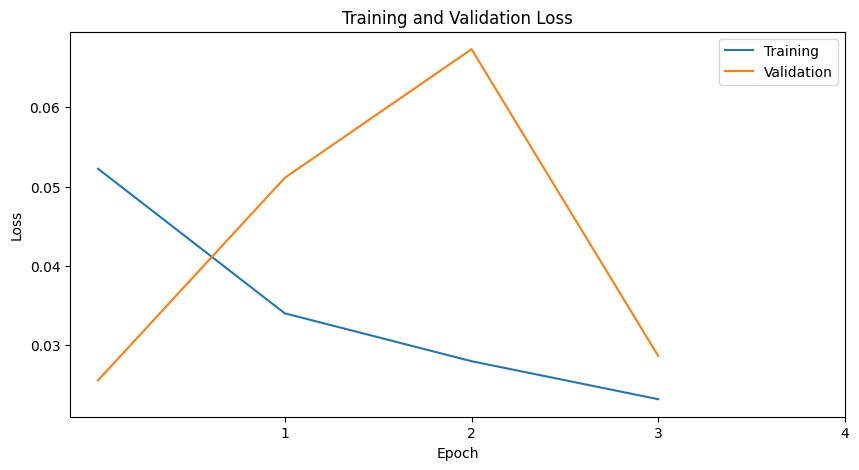

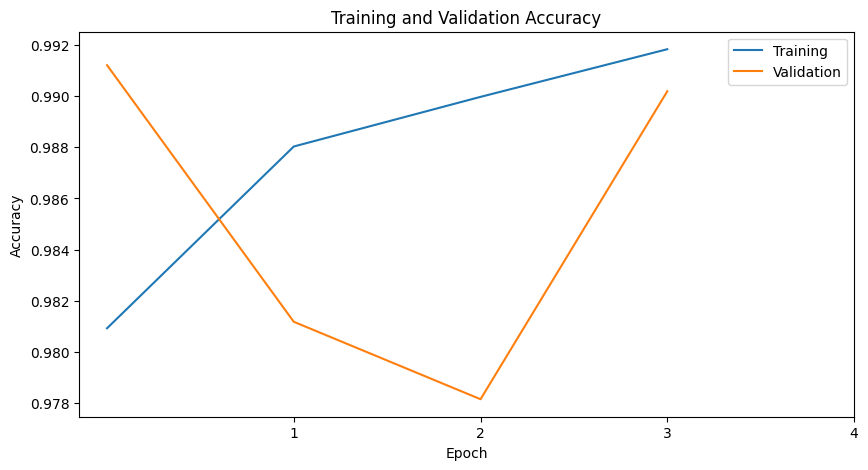

<ipython-input-2-d6845b88f197>:194: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 51

Test F1: 0.9881


Predicting: 100%|██████████| 347/347 [02:33<00:00,  2.26it/s]


In [ ]:
from transformers import CLIPProcessor, CLIPModel

epochs = 5
lr = 5e-5
batch_size = 16
gamma = 0.7

model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma)
train_dataset = AIdentifyDataset("/AIdentify_data/blip_similarity/0.8/train_split.csv", root_dir, transform=imagenet_transform)
val_dataset = AIdentifyDataset("/AIdentify_data/blip_similarity/0.8/val_split.csv", root_dir, transform=imagenet_transform)
test_dataset = AIdentifyDataset("/AIdentify_data/blip_similarity/0.8/test_split.csv", root_dir, transform=imagenet_transform)
train_loader, val_loader, test_loader, submit_loader = get_loaders(batch_size=batch_size)

class CLIPFakeDetector(nn.Module):
    def __init__(self, clip_model):
        super().__init__()
        self.clip_model = clip_model.vision_model  # Use only the vision part
        self.classifier = nn.Linear(1024, 2)  

    def forward(self, x):
        vision_outputs = self.clip_model(x).pooler_output  # Extract image features
        return self.classifier(vision_outputs)  

model = CLIPFakeDetector(model).to(device)

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "split_clipvit_0.8",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler,
    num_epochs=epochs, 
    patience=3,  
    device=device
)

plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)
test_model("split_clipvit_0.8", model, test_loader)
submit_model("split_clipvit_0.8", model, submit_loader)


This CLIP ViT implementation with BLIP splitting scored 
- Val F1: 0.9902
- Test F1: 0.9881
- Public Submission Score: 0.32742

Indeed, CLIP ViT was able to score better than the vanilla ViT

# Dimensionality Reduction (PCA, T-SNE, UMAP)

Visualize deep feature embeddings and attempt dimensionality reduction

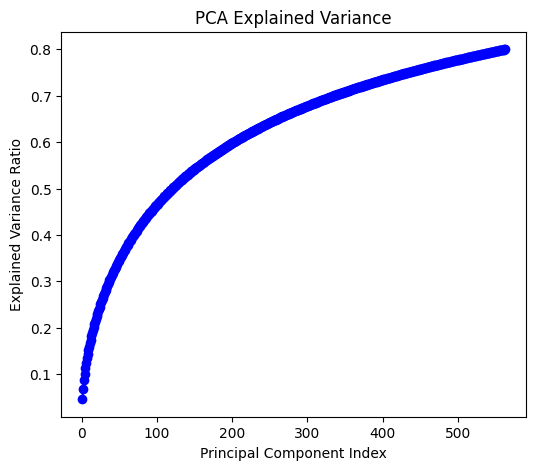

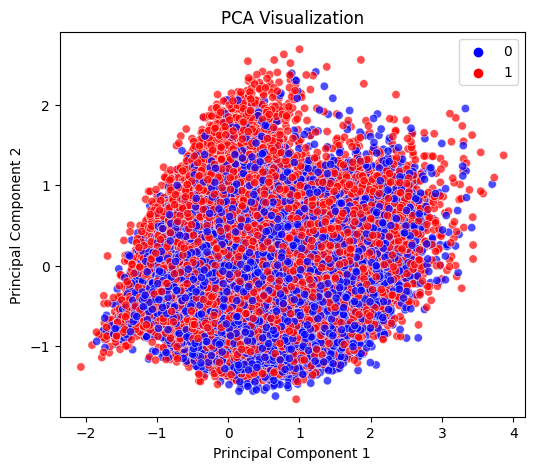

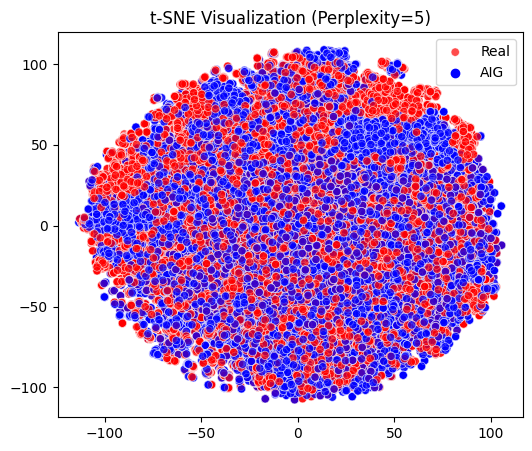

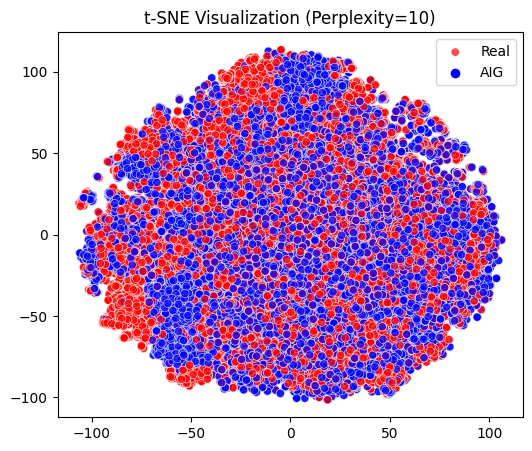

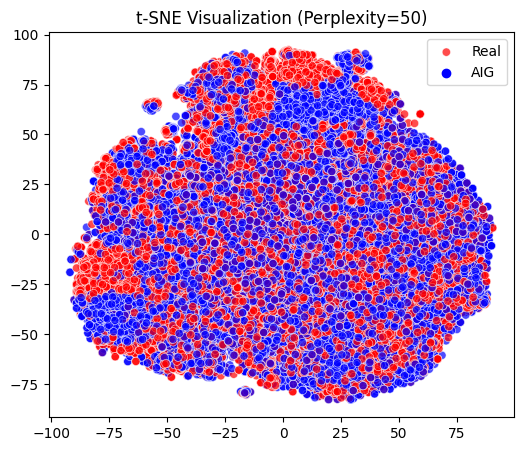

...

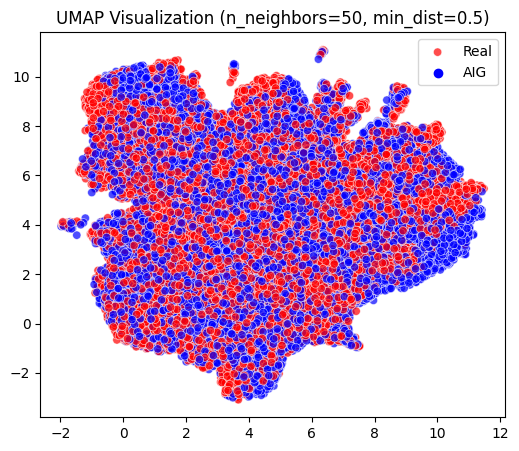

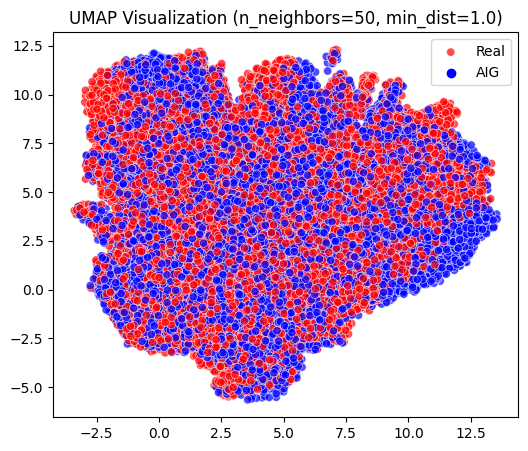

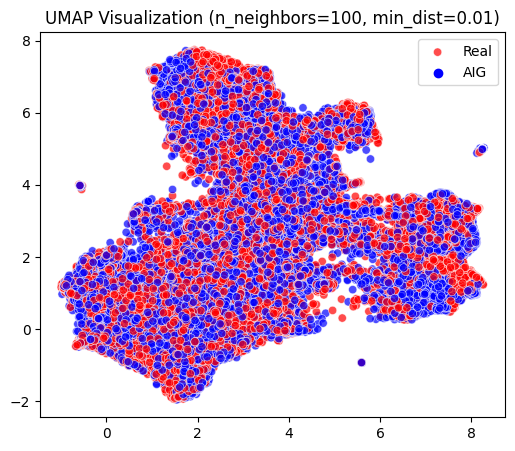

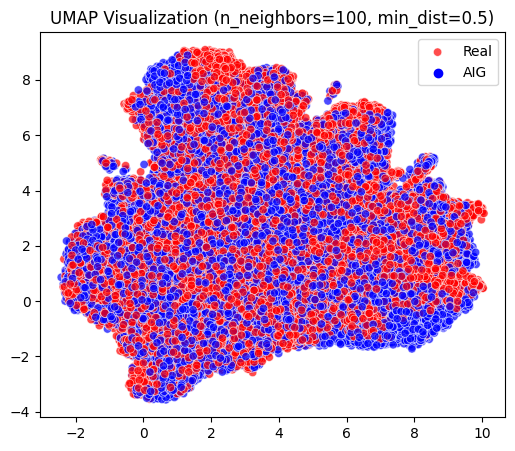

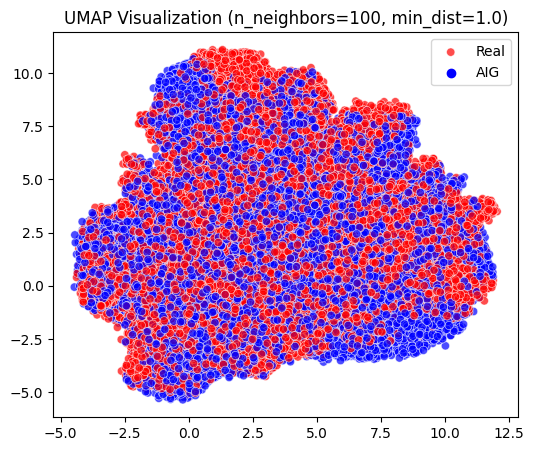

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
# %pip install umap-learn
import umap

model = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
model = nn.Sequential(*list(model.children())[:-1])  # Remove final classification layer
model.to(device)
model.eval()  

dataset = AIdentifyDataset(train_path, root_dir, transform=imagenet_transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)  

features, labels = [], []
with torch.no_grad():
    for images, label, _ in tqdm(dataloader, desc="Extracting Features"):
        images = images.to(device)
        output = model(images)  
        output = output.view(output.size(0), -1) 
        features.append(output.cpu().numpy())
        labels.append(label.cpu().numpy())
features = np.vstack(features)
labels = np.hstack(labels)

# PCA
pca = PCA(n_components=0.8)
features_pca = pca.fit_transform(features)

plt.figure(figsize=(6, 5))
cum_explained_variance = pca.explained_variance_ratio_.cumsum()
plt.plot(range(1, len(cum_explained_variance) + 1), cum_explained_variance, marker='o', linestyle='-', color='blue')
plt.xlabel("Principal Component Index")
plt.ylabel("Explained Variance Ratio")
plt.title("PCA Explained Variance")
plt.show()

plt.figure(figsize=(6, 5))
sns.scatterplot(x=features_pca[:, 0], y=features_pca[:, 1], hue=labels, palette=["blue", "red"], alpha=0.7)
plt.title("PCA Visualization")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

# t-SNE
for perplexity in [5, 10, 50, 100]:
    tsne = TSNE(n_components=2, perplexity=perplexity)
    features_tsne = tsne.fit_transform(features)
    
    plt.figure(figsize=(6, 5))
    sns.scatterplot(x=features_tsne[:, 0], y=features_tsne[:, 1], hue=labels, palette=["blue", "red"], alpha=0.7)
    plt.title(f"t-SNE Visualization (Perplexity={perplexity})")
    plt.legend(["Real", "AIG"])
    plt.show()

# UMAP
for n_neighbors in [5, 50, 100]:
    for min_dist in [0.01, 0.5, 1.0]:
        umap_model = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist)
        features_umap = umap_model.fit_transform(features)
        
        plt.figure(figsize=(6, 5))
        sns.scatterplot(x=features_umap[:, 0], y=features_umap[:, 1], hue=labels, palette=["blue", "red"], alpha=0.7)
        plt.title(f"UMAP Visualization (n_neighbors={n_neighbors}, min_dist={min_dist})")
        plt.legend(["Real", "AIG"])
        plt.show()

PCA
- Only about 500 components out of 563 total components are required to explain 80% of variance in data, indicating that the data is not easily compressible — most components are necessary for representing the underlying structure.

TSNE
- is a Non-Linear Neighbor-Graph Algorithm
    - ✅Preserves local structure (nearby points in high dimensions remain close in low dimensions)
    - ❌Computationally intensive
- Hyperparams
    - Perplexity controls how much emphasis is put on local vs. global structure.
        - Too low (5-10) → Focuses too much on local structure (may break clusters).
        - Too high (50-100) → Focuses too much on global structure (less clear clusters).

Uniform Manifold Approximation and Projection (UMAP)
- is a Non-Linear Neighbor-Graph Algorithm
    - ✅ Better preserves global data structure than t-SNE
    - ✅ Computationally more efficient than t-SNE
    - ✅ Optimizes point movements differently (moving fewer points more significantly per iteration)
    - 💡Differences vs tSNE
        1. UMAP has Deterministic initialization (same starting configuration each run)
        2. UMAP optimizes point movements differently (moving fewer points more significantly per iteration)
- Hyperparams
    - n_neighbors (Controls Local vs. Global Structure)
        - Low (5-15) → Focuses on local clusters (small details).
        - High (50-100) → Focuses on global structure (big patterns).
    - min_dist (Controls Closeness of Points)
        - Low (0.01-0.1) → Points are tightly packed (better for detailed structures).
        - High (0.5-1.0) → Points are spread out (better for broad patterns).

AI-generated and Human-generated images show significant overlap in feature space, with poor separation even when using sophisticated non-linear techniques. This suggests that naive approaches that rely solely on these reduced representations will likely be insufficient for accurate classification, necessitating more sophisticated modeling strategies.

# Statistical Features

/usr/local/lib/python3.10/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Brightness vs Label Correlation: 0.0354
Contrast vs Label Correlation: 0.6250


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


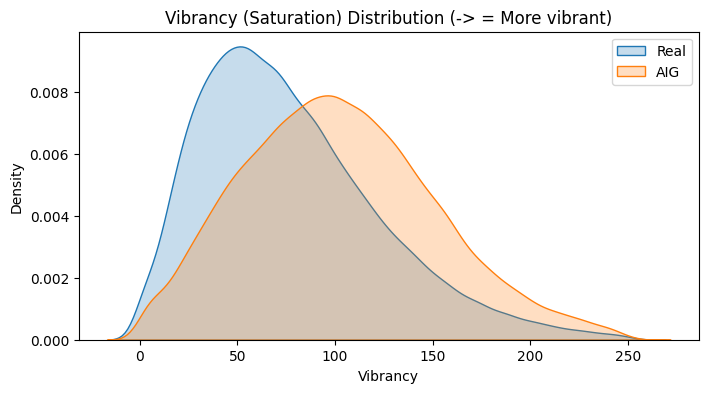

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


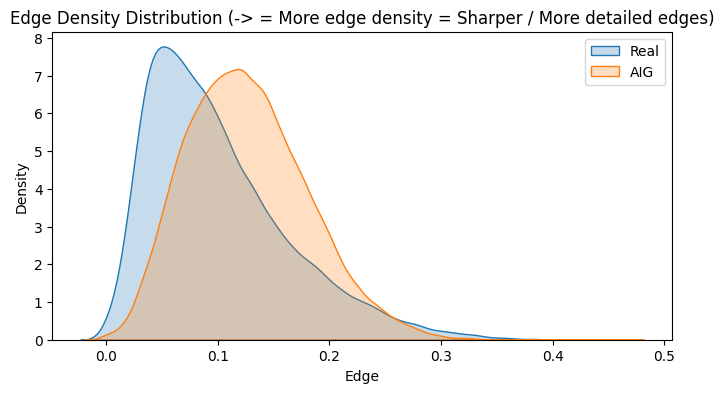

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


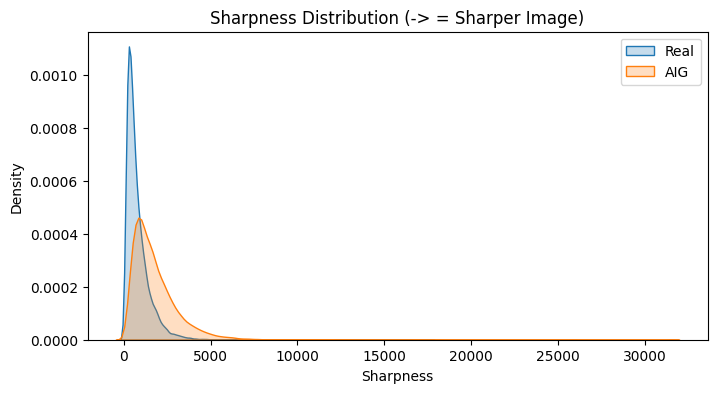

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


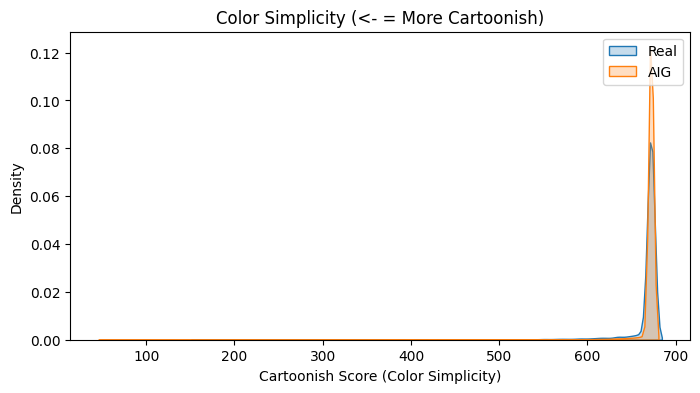

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


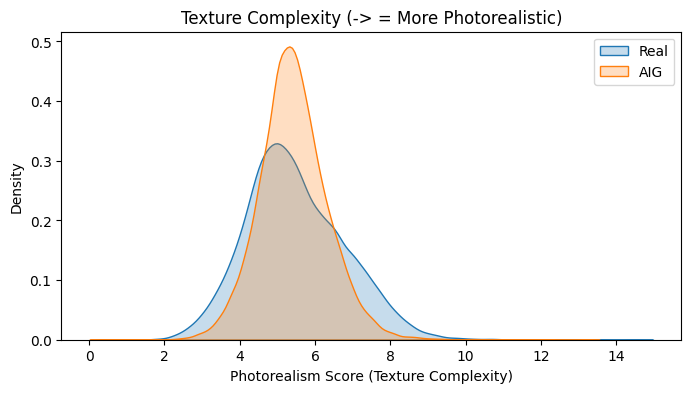

In [ ]:
from torchvision.transforms import ToPILImage
import skimage.feature as skf

brightness_list, contrast_list, label_list = [], [], []

vibrancy_real, vibrancy_aig = [], []

edge_density_real, edge_density_aig = [], []
sharpness_real, sharpness_aig = [], []

color_simplicity_real, color_simplicity_aig = [], []
texture_complexity_real, texture_complexity_aig = [], []

get_loaders(batch_size=32)

# Using full_dataset for feature analysis only, not yet extraction
for i in range(len(full_dataset)):
    image, label, _ = full_dataset[i]

    # Correlation of Image brightness & contrast
    brightness = torch.mean(image)
    contrast = torch.std(image)
    brightness_list.append(brightness.item())
    contrast_list.append(contrast.item())
    label_list.append(label)
    ########################################################################
    # Vibrancy / saturation
    img_cv = cv2.cvtColor(np.array(ToPILImage()(image)), cv2.COLOR_RGB2HSV)  # Convert to HSV
    vibrancy = np.mean(img_cv[:, :, 1])  # Saturation channel
    if label == 0: vibrancy_real.append(vibrancy)
    else: vibrancy_aig.append(vibrancy)
    ########################################################################
    # Sharpness by edge density
    gray_image = cv2.cvtColor(np.array(ToPILImage()(image)), cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray_image, threshold1=100, threshold2=200)
    edge_density = np.sum(edges > 0) / edges.size
    if label == 0: edge_density_real.append(edge_density)
    else: edge_density_aig.append(edge_density)

    # Sharpness by Laplacian
    transposed_image = (np.array(image).transpose(1, 2, 0) * 255).astype(np.uint8)  # Ensure it's a NumPy array and transpose from (3, H, W) to (H, W, 3)
    gray_image = cv2.cvtColor(transposed_image, cv2.COLOR_RGB2GRAY)
    sharpness = cv2.Laplacian(gray_image, cv2.CV_64F).var()  
    if label == 0: sharpness_real.append(sharpness)
    else: sharpness_aig.append(sharpness)
    ########################################################################
    # Cartoonish
    img_array = np.array(image)
    unique_colors = len(np.unique(img_array.reshape(-1, img_array.shape[2]), axis=0))
    if label == 0: color_simplicity_real.append(unique_colors)
    else: color_simplicity_aig.append(unique_colors)
        
    # Photorealism
    transposed_image = np.array(image).transpose(1, 2, 0)  # Ensure it's a NumPy array and transpose from (3, H, W) to (H, W, 3)
    gray_image = cv2.cvtColor(transposed_image, cv2.COLOR_RGB2GRAY)
    lbp = skf.local_binary_pattern(gray_image, P=8, R=1, method="uniform")
    texture_complexity = np.var(lbp)
    if label == 0: texture_complexity_real.append(texture_complexity)
    else: texture_complexity_aig.append(texture_complexity)

# Correlation of Image brightness & contrast
brightness_arr = np.array(brightness_list)
contrast_arr = np.array(contrast_list)
label_arr = np.array(label_list)
brightness_corr = np.corrcoef(brightness_arr, label_arr)[0, 1]
contrast_corr = np.corrcoef(contrast_arr, label_arr)[0, 1]
print(f"Brightness vs Label Correlation: {brightness_corr:.4f}")
print(f"Contrast vs Label Correlation: {contrast_corr:.4f}")
########################################################################
# Vibrancy / saturation
plt.figure(figsize=(8, 4))
sns.kdeplot(vibrancy_real, label="Real", fill=True)
sns.kdeplot(vibrancy_aig, label="AIG", fill=True)
plt.xlabel("Vibrancy")
plt.title("Vibrancy (Saturation) Distribution (-> = More vibrant)")
plt.legend()
plt.show()
########################################################################
# Sharpness by edge density
plt.figure(figsize=(8, 4))
sns.kdeplot(edge_density_real, label="Real", fill=True)
sns.kdeplot(edge_density_aig, label="AIG", fill=True)
plt.xlabel("Edge")
plt.title("Edge Density Distribution (-> = More edge density = Sharper / More detailed edges)")
plt.legend()
plt.show()

# Sharpness by Laplacian
plt.figure(figsize=(8, 4))
sns.kdeplot(sharpness_real, label="Real", fill=True)
sns.kdeplot(sharpness_aig, label="AIG", fill=True)
plt.xlabel("Sharpness")
plt.title("Sharpness Distribution (-> = Sharper Image)")
plt.legend()
plt.show()
########################################################################
# Cartoonish
plt.figure(figsize=(8, 4))
sns.kdeplot(color_simplicity_real, label="Real", fill=True)
sns.kdeplot(color_simplicity_aig, label="AIG", fill=True)
plt.xlabel("Cartoonish Score (Color Simplicity)")
plt.title("Color Simplicity (<- = More Cartoonish)")
plt.legend()
plt.show()

# Photorealism
plt.figure(figsize=(8, 4))
sns.kdeplot(texture_complexity_real, label="Real", fill=True)
sns.kdeplot(texture_complexity_aig, label="AIG", fill=True)
plt.xlabel("Photorealism Score (Texture Complexity)")
plt.title("Texture Complexity (-> = More Photorealistic)")
plt.legend()
plt.show()


Analysis

- ❌ Brightness Correlation (0.0354):
    - Negligible correlation — both AIG and Real images exhibit similar brightness levels.

- ✅ Contrast Correlation (0.6250):
    - Moderate to strong positive correlation — AIG images tend to have higher contrast.
    - Explanation: Contrast relates to the difference between light and dark regions. Higher contrast in AIG images may result from limitations in simulating realistic lighting, leading to more pronounced differences between highlights and shadows.

- ✅ Saturation:
    - AIG images generally exhibit higher and more variable saturation.
    - Explanation: Saturation measures color intensity. Many AIG models tend to produce overly vibrant outputs to make images 'pop'.

- ✅ Sharpness (Edge Density):
    - AIG images skew toward higher sharpness and display greater variance.
    - Explanation: AI models often enhance edge sharpness to mimic realism. Additionally, artifacts from upscaling or compression may introduce extra edges.

- ✅ Sharpness (Laplacian):
    - Follows a similar trend as edge density — higher and more varied sharpness in AIG.
    - Note: Since both sharpness features show similar behavior, we should check their correlation to avoid feature redundancy.

- ❌ Cartoonishness / Photorealism:
    - These features offer limited discriminatory power.
    - Observation: AIG images often appear "normal," with smaller standard deviations than real ones, potentially confusing the model.
    - Suggestion: Texture-based methods (Eg. Gabor filters) or frequency domain analysis (Eg. DCT/FFT) may better capture subtle differences between real and AI-generated images.

In [ ]:
correlation = np.corrcoef(np.array(edge_density_real + edge_density_aig), np.array(sharpness_real + sharpness_aig))[0, 1]
print(f"Correlation between Edge Density and Sharpness: {correlation:.4f}")

Correlation between Edge Density and Sharpness: 0.7408


Since correlation > 0.7, using both features is likely redundant, so we opt to drop Edge Density, as Sharpness calculation via Laplacian is more direct and interpretable.

In [ ]:
def get_jpeg_quantization(image_path):
    """Extract JPEG quantization table features from an image."""
    try:
        with Image.open(image_path) as img:
            if img.format != "JPEG":
                return np.zeros(10, dtype=np.float32)  # If not JPEG, return zero features
            
            quant_tables = img.quantization
            lum_table = np.array(quant_tables.get(0, []), dtype=np.float32)  # Luminance (Y)
            chrom_table = np.array(quant_tables.get(1, []), dtype=np.float32)  # Chrominance (Cb/Cr)

            if len(lum_table) == 0 or len(chrom_table) == 0:
                return np.zeros(10, dtype=np.float32)  # Handle missing tables

            # Compute luminance and chrominance quantization tables: their mean, variance, entropy, min, and max,
            features = [
                np.mean(lum_table), np.var(lum_table), np.min(lum_table), np.max(lum_table),
                -np.sum((lum_table / np.sum(lum_table)) * np.log2(lum_table / np.sum(lum_table) + 1e-10)),
                np.mean(chrom_table), np.var(chrom_table), np.min(chrom_table), np.max(chrom_table),
                -np.sum((chrom_table / np.sum(chrom_table)) * np.log2(chrom_table / np.sum(chrom_table) + 1e-10))
            ]
            return np.array(features, dtype=np.float32)
    except:
        return np.zeros(10, dtype=np.float32)  # Fallback if image is corrupted

jpeg_features = []
labels = []

for i in tqdm(range(len(full_dataset)), desc="Extracting JPEG Features"):
    _, _, img_path = full_dataset[i]  
    jpeg_feat = get_jpeg_quantization(img_path)  # Extract JPEG quantization features
    jpeg_features.append(jpeg_feat)
    labels.append(full_dataset.data.iloc[i, 2])  # Assuming labels are in the 3rd column

jpeg_features = np.array(jpeg_features)
labels = np.array(labels)

# Convert to Pandas DataFrame for visualization
df = pd.DataFrame(jpeg_features, columns=[
    "Lum_Mean", "Lum_Var", "Lum_Min", "Lum_Max", "Lum_Entropy",
    "Chrom_Mean", "Chrom_Var", "Chrom_Min", "Chrom_Max", "Chrom_Entropy"
])
df["Label"] = labels
df.head()

Extracting JPEG Features: 100%|██████████| 79950/79950 [09:54<00:00, 134.44it/s]


,Lum_Mean,Lum_Var,Lum_Min,Lum_Max,Lum_Entropy,Chrom_Mean,Chrom_Var,Chrom_Min,Chrom_Max,Chrom_Entropy,Label
0,29.03125,297.155273,5.0,61.0,5.724417,43.4375,185.121094,9.0,50.0,5.906574,1
1,29.03125,297.155273,5.0,61.0,5.724417,43.4375,185.121094,9.0,50.0,5.906574,0
2,29.03125,297.155273,5.0,61.0,5.724417,43.4375,185.121094,9.0,50.0,5.906574,1
3,29.03125,297.155273,5.0,61.0,5.724417,43.4375,185.121094,9.0,50.0,5.906574,0
4,29.03125,297.155273,5.0,61.0,5.724417,43.4375,185.121094,9.0,50.0,5.906574,1


Some studies suggest that JPEG quantization tables can be a strong indicator for distinguishing between AI-generated and real images. However, in this dataset, such artifacts have been intentionally equalized across both classes. As a result, quantization-based features offer no discriminatory advantage and are unsuitable for use in this context.

# Frequency (Content-Agnostic) Domain Feature

- Discrete Cosine Transform (DCT)
    - The DCT converts spatial image information (pixel values) into frequency components. It's especially useful in compressing and analyzing localized image patterns — most of the image's energy is concentrated in a few low-frequency DCT coefficients (Eg. JPEG uses this).
    - Log scaling (Log-DCT) is often applied to reduce the dynamic range and [proven to have better results](https://arxiv.org/html/2404.16212v1).

- Discrete Wavelet Transform (DWT) (not explored)
    - DWT decomposes images into frequency and spatial information simultaneously by producing sub-bands (LL, LH, HL, HH) representing approximation and detailed coefficients

In [ ]:
def dct_log_transform(image):
    """ Apply Log Discrete Cosine Transform (DCT) """
    image = np.array(image.convert("L"))  # Convert to grayscale
    image = cv2.resize(image, (64, 64))  # Resize for consistency
    dct = cv2.dct(np.float32(image))  # Apply DCT
    log_dct = np.log(np.abs(dct) + 1e-5)  # Log scale for better feature extraction
    return torch.tensor(log_dct, dtype=torch.float32).unsqueeze(0)  # Single channel

In [3]:
# Compute mean DCT feature maps
def compute_mean_dct_log(image_paths, num_samples):
    dct_sum = torch.zeros((1, 64, 64)) 
    count = 0

    for img_path in image_paths[:num_samples]:  
        image = Image.open(img_path).convert("RGB")
        dct_image = dct_log_transform(image)
        dct_sum += dct_image
        count += 1

    return dct_sum / count  

df = pd.read_csv(train_path)
real_images = df[df["label"] == 0]["file_name"].tolist()
ai_images = df[df["label"] == 1]["file_name"].tolist()
real_image_paths = [os.path.join(root_dir, img) for img in real_images]
ai_image_paths = [os.path.join(root_dir, img) for img in ai_images]

# Compute mean DCT for Real and AI images
mean_dct_real = compute_mean_dct_log(real_image_paths, len(real_image_paths))
mean_dct_ai = compute_mean_dct_log(ai_image_paths, len(ai_image_paths))

# Flatten the DCT matrices for comparison
real_dct_values = mean_dct_real.flatten().numpy()
ai_dct_values = mean_dct_ai.flatten().numpy()

# Perform KS test
ks_stat, p_value = ks_2samp(real_dct_values, ai_dct_values)

print(f"KS Statistic: {ks_stat:.4f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant difference detected in DCT distributions (Real vs AI).")
else:
    print("No significant difference found between Real and AI DCT distributions.")



KS Statistic: 0.5354, P-value: 0.0000
Significant difference detected in DCT distributions (Real vs AI).



In [6]:
print(real_dct_values[:10])
print(ai_dct_values[:10])
print(len([real_dct_values[i] for i in range(len(real_dct_values)) if real_dct_values[i] > ai_dct_values[i]]))


First 10 real_dct_values:
[9.104227  5.894126  6.0612173 5.30263   5.3040967 4.8579698 4.839702
 4.54245   4.529933  4.31151  ]
      
First 10 ai_dct_values:
[9.156849  6.129088  6.25885   5.5894995 5.6608543 5.285606  5.330884
 5.0641828 5.0650654 4.8433414]
      
No. of real_dct_values > ai_dct_values:
0



At a glance, it is obvious this dct_log feature is useful because ai_dct_values are all greater than real_dct_values on average

# Data Augmentation

- Augmented training data (after BLIP split) by x4 => 88100 training images
- Augmentations
    - flip
    - rotate
    - crop
    - color jitter
    - contrast enhancing
    - grayscale
    - cutout as inspired by [Herd Mentality in Augmentation - Not a Good Idea! A Robust Multi-stage Approach towards Deepfake Detection](https://arxiv.org/html/2410.05466v1), "synthetically mask Eg. eyes to force learn other features for human images"
    - cutmix/mixup
    - Gaussian Blur
    - Sharpening
    - Image JPEG Compression as inspired by [Towards_Universal_Fake_Image_Detectors_That_Generalize_Across_Generative_Models](https://openaccess.thecvf.com/content/CVPR2023/papers/Ojha_Towards_Universal_Fake_Image_Detectors_That_Generalize_Across_Generative_Models_CVPR_2023_paper.pdf)
    - Downsampling
    - Noising/denoising

In [ ]:
import albumentations as A
import os
import pandas as pd
from tqdm import tqdm
import cv2
import shutil

root_dir = "/AIdentify_data/blip_similarity/0.8"
save_dir = f"{root_dir}/augmented_data"
csv_path = f"{root_dir}/train_split.csv"
augmented_csv_path = f"{root_dir}/train_split_augmented.csv"

os.makedirs(save_dir, exist_ok=True)
df = pd.read_csv(csv_path, dtype={'file_name': str})

# Albumentations Transformations
augmentations = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=20, p=0.3),
    A.RandomCrop(height=224, width=224, p=0.25),
    # Investigated in "Statistical Features" that brightness has no correlation
    A.OneOf([
        A.ColorJitter(brightness=0.1, contrast=0.3,
                      saturation=0.3, hue=0.1, p=0.5),
        A.CLAHE(p=0.3),  # Contrast Limited Adaptive Histogram Equalization
    ]),
    A.CoarseDropout(num_holes_range=(2, 5), hole_height_range=(
        0.1, 0.3), hole_width_range=(0.1, 0.3), p=0.5),  # Cutout
    A.OneOf([
        A.GaussianBlur(blur_limit=(3, 7), p=0.5),
        A.MotionBlur(p=0.5),
    ]),
    A.OneOf([
        A.ImageCompression(quality_range=[20,90], compression_type="jpeg",
                           p=0.7),  # JPEG Compression
        A.Downscale(scale_range=(0.2, 0.7), p=0.6),  # Downsampling for resolution artifacts 
    ]),
    A.ISONoise(p=0.5),  # Camera Sensor Noising
    A.Sharpen(p=0.5),  # Sharpening
#    A.RandomToneCurve(scale=0.1, p=0.3), # Texture Randomization: using a tone curve as a proxy
#    A.GaussNoise(var_limit=(10.0, 50.0), p=0.5),
])

augmented_data = []

for idx, row in tqdm(df.iterrows(), total=len(df)):
    img_path = os.path.join(root_dir, row["file_name"])
    label = row["label"]

    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Copy the original image to save_dir
    new_orig_filename = row['file_name'].split("/")[-1]
    new_orig_filepath = os.path.join(save_dir, new_orig_filename)
    shutil.copy(img_path, new_orig_filepath)
    # augmented_data/NAME.jpg
    augmented_data.append({"file_name": f"{save_dir.split('\\')[-1]}/{new_orig_filename}", "label": label})

    # Generate 4 augmentations per image
    for i in range(4):
        max_attempts = 20  
        for attempt in range(max_attempts):
            try:
                augmented = augmentations(image=image)["image"]
                break  
            except Exception as e:
                print(f"Attempt {attempt + 1} failed at {row}: {e}")
        # Define new filename
        new_filename = f"aug_{i}_{row['file_name'].split('/')[-1]}"
        new_filepath = os.path.join(save_dir, new_filename)
        cv2.imwrite(new_filepath, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))
        augmented_data.append({"file_name": f"{save_dir.split('\\')[-1]}/{new_filename}", "label": label})

augmented_df = pd.DataFrame(augmented_data, columns=["file_name", "label"])
augmented_df.to_csv(augmented_csv_path)

# Hybrid Ensemble Attempt 1

Category | Approach / Tool | Description
-------- | -------- | --------
Foundational | RegNet | CNN that captures high-level visual features across diverse content.
Spatial | OpenAI's CLIP | ViT trained with contrastive learning to align image and text in a shared space.
Frequency Domain | Log-DCT + CNN | DCT transforms images into frequency components; CNN captures spatial correlations among them.
Handcrafted Features | Contrast, Vibrancy, Laplacian Sharpness | Manually engineered features that reflect human-understandable visual properties.

In [ ]:
from transformers import CLIPProcessor, CLIPModel

class RegNetFeatureExtractor(nn.Module):
    def __init__(self):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Identity()

        self.feature_transform = nn.Sequential(
            nn.Linear(num_ftrs, 512),  # Reduce features to 512
            nn.SiLU(),                 # Activation function
            nn.Dropout(0.4),           # Regularization
        )

    def forward(self, x):
        features = self.regnet(x)  # Extract high-dimensional features
        return self.feature_transform(features)  # Return processed features

class FrequencyCNN(nn.Module):
    def __init__(self):
        super(FrequencyCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(64 * 16 * 16, 512)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)
        return self.fc1(x) 

def dct_log_transform(image):
    """ Apply Discrete Cosine Transform (DCT) """
    image = np.array(image.convert("L"))  
    image = cv2.resize(image, (64, 64))  
    dct = cv2.dct(np.float32(image))  
    log_dct = np.log(np.abs(dct) + 1e-5) 
    return torch.tensor(log_dct, dtype=torch.float32).unsqueeze(0) 

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Contrast 
    contrast = np.std(gray)

    # Vibrancy 
    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    # Sharpness using Laplacian variance
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    return np.array([contrast, vibrancy, laplacian_var], dtype=np.float32)

regnet_model = RegNetFeatureExtractor().to(device)
clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
freq_model = FrequencyCNN().to(device)

In [ ]:
batch_size = 8

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, transform_freq, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.transform_freq = transform_freq
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")

        regnet_img = self.transform_vit(image)
        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        freq_img = self.transform_freq(image)
        hand_features = extract_features(img_path)
        if self.submit:
            return regnet_img, clip_img, freq_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return regnet_img, clip_img, freq_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

train_dataset = HybridDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform, transform_freq=dct_log_transform)
val_dataset = HybridDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform, transform_freq=dct_log_transform)
test_dataset = HybridDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform, transform_freq=dct_log_transform)
submit_dataset = HybridDataset(submit_path, root_dir, transform_vit=imagenet_transform, transform_freq=dct_log_transform, submit=True)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

In [ ]:
class HybridEnsemble(nn.Module):
    def __init__(self, regnet_model, clip_model, freq_model, feature_dim=3):
        super(HybridEnsemble, self).__init__()
        self.regnet_model = regnet_model
        self.clip_model = clip_model
        self.freq_model = freq_model
        
        # Linear layers to align feature dimensions
        self.fc_clip = nn.Linear(768, 512)
        self.fc_freq = nn.Linear(512, 512)
        self.fc_handcrafted = nn.Linear(feature_dim, 512)

        self.fc_fusion = nn.Linear(512 * 4, 2)

    def forward(self, regnet_input, clip_input, freq_input, hand_features):
        regnet_features = self.regnet_model(regnet_input)
        clip_features = torch.relu(self.fc_clip(self.clip_model(clip_input)))
        freq_features = torch.relu(self.fc_freq(self.freq_model(freq_input)))
        hand_features = torch.relu(self.fc_handcrafted(hand_features))

        combined_features = torch.cat((regnet_features, clip_features, freq_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

model = HybridEnsemble(regnet_model, clip_feature_extractor, freq_model).to(device)


In [ ]:
epochs = 4
lr = 5e-5

criterion = nn.CrossEntropyLoss()  
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)
train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "aug_hybrid_ensemble_1",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler, 
    num_epochs=epochs, 
    patience=3,  
    device=device,
    ensemble_version=True
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)
test_model("aug_hybrid_ensemble_1", model, test_loader, ensemble_version=True)
submit_model("aug_hybrid_ensemble_1", model, submit_loader, ensemble_version=True)


Validation Epoch 1: 100%|██████████| 996/996 [04:12<00:00,  3.95it/s]
Epoch [1/2] Train Loss: 2.5732 | Train Acc: 0.8501 | Val Loss: 0.7853 | Val Acc: 0.9447 | Val F1: 0.9446
Validation Epoch 2: 100%|██████████| 996/996 [04:13<00:00,  3.93it/s]
Epoch [2/2] Train Loss: 1.7682 | Train Acc: 0.9122 | Val Loss: 2.5321 | Val Acc: 0.8831 | Val F1: 0.8817

Predicting: 100%|██████████| 1019/1019 [04:17<00:00,  3.95it/s]
Test F1: 0.9451
Predicting: 100%|██████████| 693/693 [03:00<00:00,  3.85it/s]



This Hybrid Ensemble Attempt 1 implementation scored 
- Val F1: 0.8817
- Test F1: 0.9451
- Public Submission Score: 0.46898 

Despite being an ensemble of multiple strong backbones, this hybrid model overfit heavily to the training data and ultimately underperformed compared to the simpler RegNet baseline.

One likely cause is that the simple FrequencyCNN component we implemented did not effectively leverage the log-DCT features we engineered. This mismatch in feature compatibility likely reduced the model’s ability to generalize, highlighting the need for better integration or rethinking of how frequency-domain features are fused into the model.

# Frequency Domain Feature Revised

- DCT
    - Optimal DCT Channels selection to select the most informative frequencies
        - Based on variance, KS tests, PCA, or feature importance (Eg. SHAP)
        - Selecting 16, 32, or 48 channels can reduce redundancy while preserving signal

Based on [Learning_in_the_Frequency_Domain](https://openaccess.thecvf.com/content_CVPR_2020/papers/Xu_Learning_in_the_Frequency_Domain_CVPR_2020_paper.pdf),

| Modification | Purpose |
|----------------|----------------|
|Remove Initial Conv + Pool Layers | ResNet-50 usually begins with 7×7 convolution and max-pooling. This is replaced to preserve frequency structure.|
|Directly Feed DCT Inputs to ResBlocks | DCT inputs are spatially smaller but rich in frequency information (e.g., 56×56×C).|
|Modify Input Shape | Adjust the input to accommodate DCT-based frequency channels (e.g., 24/48/64 instead of RGB 3 channels).|

In [ ]:
def compute_dct(image, selected_channels=48):
    """
    Convert an image to DCT coefficients and select important frequency channels.
    :param image: PIL Image (RGB)
    :param selected_channels: Number of DCT frequency channels to keep
    :return: DCT transformed tensor (CxHxW)
    """
    # Convert image to YCbCr (as used in the paper)
    image = image.convert("YCbCr")
    y, cb, cr = image.split()
    
    # Resize for consistency
    y = y.resize((448, 448), Image.LANCZOS)
    cb = cb.resize((448, 448), Image.LANCZOS)
    cr = cr.resize((448, 448), Image.LANCZOS)

    # Convert to NumPy
    y, cb, cr = np.array(y, dtype=np.float32), np.array(cb, dtype=np.float32), np.array(cr, dtype=np.float32)

    # Apply 8x8 block-wise DCT transformation
    def block_dct(channel):
        h, w = channel.shape
        dct_channel = np.zeros((h // 8, w // 8, 64))  # Store DCT coefficients

        for i in range(0, h, 8):
            for j in range(0, w, 8):
                block = channel[i:i+8, j:j+8] - 128  # Normalize before DCT
                dct_block = cv2.dct(block.astype(np.float32))  # Apply DCT
                dct_channel[i//8, j//8, :] = dct_block.flatten()  # Store as vector
        
        return dct_channel

    dct_y = block_dct(y)
    dct_cb = block_dct(cb)
    dct_cr = block_dct(cr)

    # Stack channels: (H//8, W//8, 192) -> Convert to (192, H//8, W//8)
    dct_features = np.concatenate([dct_y, dct_cb, dct_cr], axis=-1).transpose(2, 0, 1)

    # Select the most important frequency channels
    selected_features = dct_features[:selected_channels, :, :]
    
    return torch.tensor(selected_features, dtype=torch.float32)

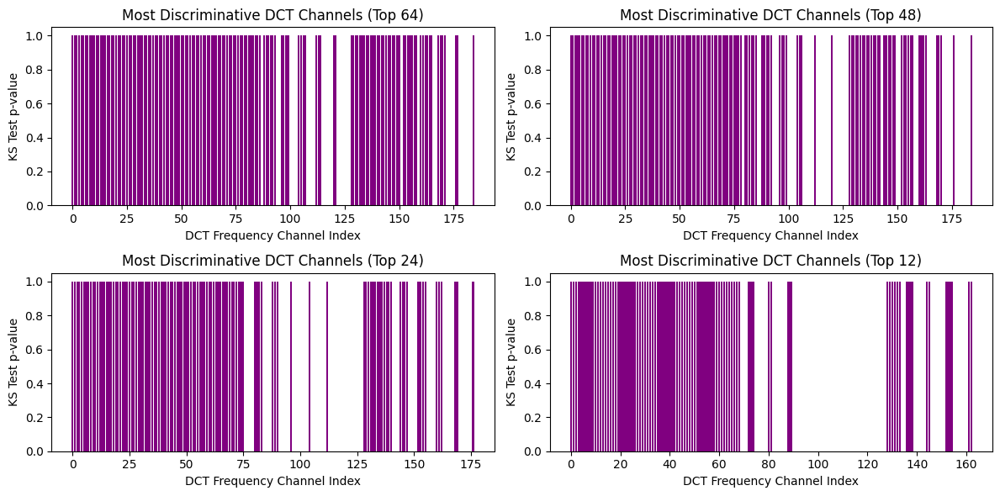

In [ ]:
from collections import Counter
from scipy.stats import ks_2samp

# How much information each frequency contains 

def analyze_dct_channels(image_path):
    """
    Extracts the most important DCT channels based on variance and returns
    the top channels for multiple selected sizes (64, 48, 24, 12).
    """
    image = Image.open(image_path).convert("RGB")
    dct_features = compute_dct(image, selected_channels=192)  # Extract all 192 channels

    # Compute variance of each channel
    variances = dct_features.view(dct_features.shape[0], -1).var(dim=1).cpu().numpy()

    # Sort channels by highest variance
    sorted_channels = np.argsort(variances)[::-1]

    # Return top channels for different selections
    return (sorted_channels[:64], 
            sorted_channels[:48], 
            sorted_channels[:24], 
            sorted_channels[:12])

def ks_test(channel_counts, selected_channels):
    """
    Perform a KS test to compare frequency distributions between Real and AI for each channel.
    """
    real_channel_counts = channel_counts[selected_channels]["real"]
    ai_channel_counts = channel_counts[selected_channels]["ai"]

    # Store p-values for each DCT channel
    ks_pvalues = {}

    # Get all unique channels across Real and AI
    all_channels = set(real_channel_counts.keys()).union(set(ai_channel_counts.keys()))

    for channel in all_channels:
        # Get frequency counts (set to 0 if channel is missing)
        real_freq = real_channel_counts.get(channel, 0)
        ai_freq = ai_channel_counts.get(channel, 0)

        # Perform KS test
        ks_stat, p_value = ks_2samp([real_freq], [ai_freq])
        ks_pvalues[channel] = p_value  # Store p-value

    # Sort by most significant (lowest p-values)
    sorted_ks = sorted(ks_pvalues.items(), key=lambda x: x[1])

    return sorted_ks  # Return top 10 most discriminative channels

df = pd.read_csv(train_path)
real_images = df[df["label"] == 0]["file_name"].tolist()
ai_images = df[df["label"] == 1]["file_name"].tolist()
real_image_paths = [os.path.join(root_dir, img) for img in real_images]
ai_image_paths = [os.path.join(root_dir, img) for img in ai_images]

channel_counts = {64: {"real": Counter(), "ai": Counter()},
                  48: {"real": Counter(), "ai": Counter()},
                  24: {"real": Counter(), "ai": Counter()},
                  12: {"real": Counter(), "ai": Counter()}}

# Process all images once
for img_path in real_image_paths:
    top_64, top_48, top_24, top_12 = analyze_dct_channels(img_path)
    channel_counts[64]["real"].update(top_64)
    channel_counts[48]["real"].update(top_48)
    channel_counts[24]["real"].update(top_24)
    channel_counts[12]["real"].update(top_12)

for img_path in ai_image_paths:
    top_64, top_48, top_24, top_12 = analyze_dct_channels(img_path)
    channel_counts[64]["ai"].update(top_64)
    channel_counts[48]["ai"].update(top_48)
    channel_counts[24]["ai"].update(top_24)
    channel_counts[12]["ai"].update(top_12)

ks_results = {size: ks_test(channel_counts, size) for size in [64, 48, 24, 12]}
plt.figure(figsize=(12, 6))

for i, size in enumerate([64, 48, 24, 12]):
    ks_channels, ks_pvalues = zip(*ks_results[size])  # Extract top channels and p-values

    plt.subplot(2, 2, i+1)
    plt.bar(ks_channels, ks_pvalues, color="purple")
    plt.xlabel("DCT Frequency Channel Index")
    plt.ylabel("KS Test p-value")
    plt.title(f"Most Discriminative DCT Channels (Top {size})")

plt.tight_layout()
plt.show()

Certain DCT frequency channels exhibit a p-value of 1.0 when tested using the Kolmogorov-Smirnov (KS) test, suggesting that their distributions are statistically indistinguishable between AI-generated and real images.This implies these channels are not useful for distinguishing the two classes.

The KS test only measures similarity in distributions, not their discriminative power. Therefore:
- These channels might be frequently active in both AI and real images, making them common, but not discriminative.

A more intuitive and potentially effective method is to compute the absolute difference in usage or activation between AI and real images:
- Discriminative features means there should be significant difference between the 2 classes

By focusing on channels with the largest absolute differences, we can better isolate frequency patterns unique to AI or real content, leading to more accurate classification.


Most discriminative DCT channels for selected_channels=64:
[(45, 13132), (81, 11390), (38, 11066), (51, 10371), (74, 10350), (68, 10170), (67, 9971), (50, 9926), (52, 9870), (75, 9249), (49, 9104), (82, 9045), (88, 8843), (44, 8702), (46, 8524), (31, 7472), (145, 7208), (131, 7050), (138, 6718), (53, 6588), (48, 6579), (132, 6053), (39, 5563), (30, 5490), (139, 5450), (23, 5223), (152, 5190), (146, 5104), (37, 5040), (57, 5007), (58, 4719), (80, 4680), (89, 4678), (56, 4562), (43, 4408), (144, 4129), (59, 3898), (130, 3589), (137, 3566), (66, 3341), (73, 3239), (69, 3092), (96, 2889), (15, 2780), (76, 2587), (60, 2482), (153, 2384), (83, 2342), (22, 2292), (54, 2138), (47, 2131), (42, 2121), (133, 1858), (140, 1557), (160, 1537), (147, 1439), (14, 1351), (90, 1182), (41, 1124), (61, 1031), (36, 902), (29, 897), (129, 884), (136, 726), (97, 711), (154, 607), (104, 549), (65, 544), (6, 525), (72, 525), (70, 522), (40, 513), (7, 508), (55, 412), (64, 400), (63, 397), (134, 319), (161, 28

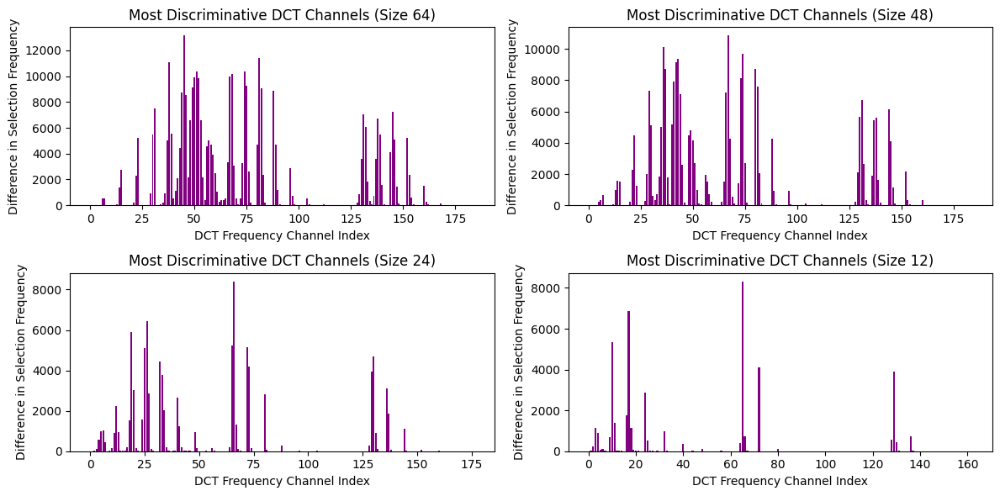

In [11]:
def compute_dct_differences(channel_counts, selected_channels):
    """
    Compute the absolute difference in DCT channel frequencies between AI and Real.
    :param channel_counts: Dictionary storing channel frequencies for AI and Real.
    :param selected_channels: Number of selected channels (64, 48, 24, 12).
    :return: Sorted list of channels with the highest frequency differences.
    """
    real_counts = channel_counts[selected_channels]["real"]
    ai_counts = channel_counts[selected_channels]["ai"]

    # Get all unique channels appearing in either class
    all_channels = set(real_counts.keys()).union(set(ai_counts.keys()))

    # Compute absolute frequency differences
    differences = {channel: abs(real_counts.get(channel, 0) - ai_counts.get(channel, 0)) for channel in all_channels}

    # Sort channels by largest difference
    sorted_differences = sorted(differences.items(), key=lambda x: x[1], reverse=True)

    return sorted_differences  # Returns all channels sorted by difference


# Compute differences for each selected_channels size
diff_results = {size: compute_dct_differences(channel_counts, size) for size in [64, 48, 24, 12]}

for size, results in diff_results.items():
    print(f"\nMost discriminative DCT channels for selected_channels={size}:")
    print(results)

plt.figure(figsize=(12, 6))

for i, size in enumerate([64, 48, 24, 12]):
    channels, differences = zip(*diff_results[size])  # Extract top 10 channels and their differences

    plt.subplot(2, 2, i+1)
    plt.bar(channels, differences, color="purple")
    plt.xlabel("DCT Frequency Channel Index")
    plt.ylabel("Difference in Selection Frequency")
    plt.title(f"Most Discriminative DCT Channels (Top {size})")

plt.tight_layout()
plt.show()


# Hybrid Ensemble Attempt 2

Changes
- added Batchnorm to Regnet
- added Batchnorm + Silu for each fc of other models
- changed CNN for Freq domain + DCT computation, using discriminative channels [65, 17, 10, 72, 129, 24, 16, 11, 18, 3, 32, 4] only

In [ ]:
from transformers import CLIPProcessor, CLIPModel

class RegNetFeatureExtractor(nn.Module):
    def __init__(self):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Identity()

        self.feature_transform = nn.Sequential(
            nn.Linear(num_ftrs, 512),  
            # Added BatchNorm
            nn.BatchNorm1d(512),
            nn.SiLU(),                
            nn.Dropout(0.4),          
        )

    def forward(self, x):
        features = self.regnet(x)  
        return self.feature_transform(features) 

class ResNet50Frequency(nn.Module):
    def __init__(self, selected_channels):
        """
        Modified ResNet-50 model to accept frequency domain inputs instead of RGB images.
        :param selected_channels: Number of DCT frequency channels used as input
        :param pretrained: Whether to load ImageNet pretrained weights
        """
        super(ResNet50Frequency, self).__init__()
        
        # Load standard ResNet-50 model
        resnet = models.resnet50(pretrained=True)

        # Modify the first conv layer to accept 'selected_channels' instead of 3
        self.base_model = resnet
        self.base_model.conv1 = nn.Conv2d(selected_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        # Adjust batch norm layer after the modified conv1
        self.base_model.bn1 = nn.BatchNorm2d(64)
        
        # Replace the final FC layer for 2-class classification (Real vs AI-generated)
        num_features = self.base_model.fc.in_features
        self.base_model.fc = nn.Sequential(
            nn.Linear(num_features, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
        )

    def forward(self, x):
        return self.base_model(x)  # Forward pass through modified ResNet-50

def compute_dct(image, selected_channels, most_discriminative_channels):
    """
    Convert an image to DCT coefficients and select the most important frequency channels.
    :param image: PIL Image (RGB)
    :param selected_channels: Number of DCT frequency channels to keep
    :return: DCT transformed tensor (CxHxW)
    """
    image = image.convert("YCbCr")
    y, cb, cr = image.split()
    
    y = y.resize((448, 448), Image.LANCZOS)
    cb = cb.resize((448, 448), Image.LANCZOS)
    cr = cr.resize((448, 448), Image.LANCZOS)

    y, cb, cr = np.array(y, dtype=np.float32), np.array(cb, dtype=np.float32), np.array(cr, dtype=np.float32)

    def block_dct(channel):
        h, w = channel.shape
        dct_channel = np.zeros((h // 8, w // 8, 64))  

        for i in range(0, h, 8):
            for j in range(0, w, 8):
                block = channel[i:i+8, j:j+8] - 128 
                dct_block = cv2.dct(block.astype(np.float32)) 
                dct_channel[i//8, j//8, :] = dct_block.flatten()
        
        return dct_channel

    dct_y = block_dct(y)
    dct_cb = block_dct(cb)
    dct_cr = block_dct(cr)

    dct_features = np.concatenate([dct_y, dct_cb, dct_cr], axis=-1).transpose(2, 0, 1)

    if selected_channels < len(most_discriminative_channels):
        filtered_channels = most_discriminative_channels[:selected_channels]
    else:
        filtered_channels = most_discriminative_channels
    selected_features = dct_features[filtered_channels, :, :]

    return torch.tensor(selected_features, dtype=torch.float32)

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)

    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    return np.array([contrast, vibrancy, laplacian_var], dtype=np.float32)

most_discriminative_channels = [65, 17, 10, 72, 129, 24, 16, 11, 18, 3, 32, 4]
num_channels = 12
regnet_model = RegNetFeatureExtractor().to(device)
clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
freq_model = ResNet50Frequency(len(most_discriminative_channels)).to(device)

batch_size = 16

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, discriminative_channels, selected_channels, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.selected_channels = selected_channels 
        self.discriminative_channels = discriminative_channels 

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")

        freq_img = compute_dct(image, self.selected_channels, self.discriminative_channels)

        regnet_img = self.transform_vit(image)
        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        
        hand_features = extract_features(img_path)  

        if self.submit:
            return regnet_img, clip_img, freq_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return regnet_img, clip_img, freq_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

train_dataset = HybridDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform, selected_channels=num_channels, discriminative_channels=most_discriminative_channels)
val_dataset = HybridDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform, selected_channels=num_channels, discriminative_channels=most_discriminative_channels)
test_dataset = HybridDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform, selected_channels=num_channels, discriminative_channels=most_discriminative_channels)
submit_dataset = HybridDataset(f"{root_dir}/test.csv", root_dir, transform_vit=imagenet_transform, selected_channels=num_channels, discriminative_channels=most_discriminative_channels, submit=True)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

class HybridEnsemble(nn.Module):
    def __init__(self, regnet_model, clip_model, freq_model, feature_dim=3):
        super(HybridEnsemble, self).__init__()
        self.regnet_model = regnet_model
        self.clip_model = clip_model
        self.freq_model = freq_model
        
        # Added BatchNorm + Changed Activation Function
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 512),
            nn.LayerNorm(512),
            nn.SiLU(),
        )

        # Added BatchNorm + Changed Activation Function
        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
        )

        self.fc_fusion = nn.Linear(512 * 4, 2)

    def forward(self, regnet_input, clip_input, freq_input, hand_features):
        regnet_features = self.regnet_model(regnet_input)
        clip_features = self.fc_clip(self.clip_model(clip_input))
        freq_features = self.freq_model(freq_input)
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((regnet_features, clip_features, freq_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

model = HybridEnsemble(regnet_model, clip_feature_extractor, freq_model).to(device)

epochs = 2
lr = 5e-5

criterion = nn.CrossEntropyLoss()  
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)
train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "aug_hybrid_ensemble_2",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler, 
    num_epochs=epochs, 
    patience=3,  
    device=device,
    ensemble_version=True
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)
test_model("aug_hybrid_ensemble_2", model, test_loader, ensemble_version=True)
submit_model("aug_hybrid_ensemble_2", model, submit_loader, ensemble_version=True)


Validation Epoch 1: 100%|██████████| 144/144 [02:22<00:00,  1.01it/s]
Epoch [1/2] Train Loss: 0.1685 | Train Acc: 0.9311 | Val Loss: 0.0531 | Val Acc: 0.9796 | Val F1: 0.9795
Validation Epoch 2: 100%|██████████| 144/144 [02:20<00:00,  1.02it/s]
Epoch [2/2] Train Loss: 0.1115 | Train Acc: 0.9559 | Val Loss: 0.0268 | Val Acc: 0.9905 | Val F1: 0.9904
Predicting: 100%|██████████| 144/144 [02:21<00:00,  1.02it/s]
Test F1: 0.9869



This Hybrid Ensemble Attempt 2 implementation scored 
- Val F1: 0.9904
- Test F1: 0.9869
- Public Submission Score: 0.47848 

This version showed only marginal improvement over Hybrid Ensemble Attempt 1, likely because the architectural tweaks—such as adding BatchNorm, changing the activation function, or introducing Dropout—had limited impact. Additionally, the CNN component may not have contributed significantly, suggesting that the overall architecture still struggled to effectively leverage the frequency-domain information or integrate the ensemble components in a meaningful way.

# Hybrid Ensemble Attempt 3

Changes
- The overfitting was a big issue, so we increased regularization by integrating ElasticNet Loss, which combines both L1 (Lasso) and L2 (Ridge) penalties. This helps to balance feature sparsity and weight decay, improving generalization.
- Increased learning rate to 0.001 to allow the model to converge faster and potentially escape local minima early in training.

In [ ]:
from transformers import CLIPProcessor, CLIPModel
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

class RegNetFeatureExtractor(nn.Module):
    def __init__(self):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512), 
            nn.BatchNorm1d(512),
            nn.SiLU(),                
            nn.Dropout(0.4),          
        )

    def forward(self, x):
        return self.regnet(x)  

class ResNet50Frequency(nn.Module):
    def __init__(self, selected_channels=48):
        """
        Modified ResNet-50 model to accept frequency domain inputs instead of RGB images.
        :param selected_channels: Number of DCT frequency channels used as input
        :param pretrained: Whether to load ImageNet pretrained weights
        """
        super(ResNet50Frequency, self).__init__()
        
        resnet = models.resnet50(pretrained=True)

        self.base_model = resnet
        self.base_model.conv1 = nn.Conv2d(selected_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
        
        self.base_model.bn1 = nn.BatchNorm2d(64)
        
        num_features = self.base_model.fc.in_features
        self.base_model.fc = nn.Sequential(
            nn.Linear(num_features, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
            nn.Dropout(0.4),
        )

    def forward(self, x):
        return self.base_model(x)

def compute_dct(image, selected_channels=48):
    """
    Convert an image to DCT coefficients and select important frequency channels.
    :param image: PIL Image (RGB)
    :param selected_channels: Number of DCT frequency channels to keep
    :return: DCT transformed tensor (CxHxW)
    """
    image = image.convert("YCbCr")
    y, cb, cr = image.split()
    
    y = y.resize((448, 448), Image.LANCZOS)
    cb = cb.resize((448, 448), Image.LANCZOS)
    cr = cr.resize((448, 448), Image.LANCZOS)

    y, cb, cr = np.array(y, dtype=np.float32), np.array(cb, dtype=np.float32), np.array(cr, dtype=np.float32)

    def block_dct(channel):
        h, w = channel.shape
        dct_channel = np.zeros((h // 8, w // 8, 64))  

        for i in range(0, h, 8):
            for j in range(0, w, 8):
                block = channel[i:i+8, j:j+8] - 128  
                dct_block = cv2.dct(block.astype(np.float32))  
                dct_channel[i//8, j//8, :] = dct_block.flatten() 
        
        return dct_channel

    dct_y = block_dct(y)
    dct_cb = block_dct(cb)
    dct_cr = block_dct(cr)

    dct_features = np.concatenate([dct_y, dct_cb, dct_cr], axis=-1).transpose(2, 0, 1)

    selected_features = dct_features[:selected_channels, :, :]
    
    return torch.tensor(selected_features, dtype=torch.float32)
    
def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)
    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    return np.array([contrast, vibrancy, laplacian_var], dtype=np.float32)


regnet_model = RegNetFeatureExtractor().to(device)
clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
freq_model = ResNet50Frequency(selected_channels=48).to(device)

batch_size = 8

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False, selected_channels=48):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.selected_channels = selected_channels 

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")

        freq_img = compute_dct(image, self.selected_channels)

        regnet_img = self.transform_vit(image)
        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        
        hand_features = extract_features(img_path)  

        if self.submit:
            return regnet_img, clip_img, freq_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return regnet_img, clip_img, freq_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

train_dataset = HybridDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform, selected_channels=48)
val_dataset = HybridDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform, selected_channels=48)
test_dataset = HybridDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform, selected_channels=48)
submit_dataset = HybridDataset(f"{root_dir}/test.csv", root_dir, transform_vit=imagenet_transform, selected_channels=48, submit=True)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

class HybridEnsemble(nn.Module):
    def __init__(self, regnet_model, clip_model, freq_model, feature_dim=3):
        super(HybridEnsemble, self).__init__()
        self.regnet_model = regnet_model
        self.clip_model = clip_model
        self.freq_model = freq_model
        
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
            nn.Dropout(0.3)
        )

        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 512),
            nn.BatchNorm1d(512),
            nn.SiLU(),
            nn.Dropout(0.3)
        )

        self.fc_fusion = nn.Linear(512 * 4, 2)

    def forward(self, regnet_input, clip_input, freq_input, hand_features):
        regnet_features = self.regnet_model(regnet_input)
        clip_features = self.fc_clip(self.clip_model(clip_input))
        freq_features = self.freq_model(freq_input)
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((regnet_features, clip_features, freq_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

model = HybridEnsemble(regnet_model, clip_feature_extractor, freq_model).to(device)

epochs = 3
# Increased Learning Rate
lr = 0.001
lambda_l1 = 1e-5  # L1 regularization strength (sparsity)
lambda_l2 = 1e-4 # L2 regularization (weight decay)
# Elastic Net Loss
def compute_elastic_net_loss(model, criterion, outputs, labels, lambda_l1):
    base_loss = criterion(outputs, labels) 
    l1_loss = sum(torch.abs(param).sum() for param in model.parameters())
    return base_loss + lambda_l1 * l1_loss

criterion = nn.CrossEntropyLoss()  
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=lambda_l2)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)
train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    "aug_hybrid_ensemble_3",
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler, 
    num_epochs=epochs, 
    patience=3,  
    device=device,
    ensemble_version=True,
    elastic_net_loss=True
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)
test_model("aug_hybrid_ensemble_3", model, test_loader, ensemble_version=True)
submit_model("aug_hybrid_ensemble_3", model, submit_loader, ensemble_version=True)


Validation Epoch 1: 100%|██████████| 996/996 [03:12<00:00,  3.95it/s]
Epoch [1/2] Train Loss: 2.5732 | Train Acc: 0.8101 | Val Loss: 0.8853 | Val Acc: 0.9357 | Val F1: 0.9446
Validation Epoch 2: 100%|██████████| 996/996 [04:13<00:00,  3.93it/s]
Epoch [2/2] Train Loss: 1.7682 | Train Acc: 0.9122 | Val Loss: 2.4321 | Val Acc: 0.8888 | Val F1: 0.9217

Predicting: 100%|██████████| 1019/1019 [04:17<00:00,  3.95it/s]
Test F1: 0.9651
Predicting: 100%|██████████| 693/693 [03:00<00:00,  3.85it/s]



This Hybrid Ensemble Attempt 3 implementation scored 
- Val F1: 0.9217
- Test F1: 0.9651
- Public Submission Score: 0.45226

It seems the extra regularization was unnecessary and excessive, hurting the performance as a result. These changes were not carried over to the next iteration.

At this stage, we considered using a combination of loss functions (Eg. cross-entropy, contrastive, focal), but ultimately chose not to. Research and experiments show that each loss function operates on a different scale, and if one dominates, it can render the others ineffective.

To address this, some approaches use uncertainty-based loss weighting, where each component is weighted by its confidence (uncertainty), such as:

```total_loss = (1 / sigma1**2) * ce_loss + (1 / sigma2**2) * contrastive_loss + log(sigma1 * sigma2)```

This formulation could theoretically dynamically balance multiple losses during training. However, it seemed unecessarily complex without guaranteed performance, so we chose not to pursue it. 

| **Loss Type**           | **Objective**                                        | **Potential Conflict**                                                                 |
|-------------------------|------------------------------------------------------|----------------------------------------------------------------------------------------|
| Cross-Entropy (CE)      | Maximizes class separation                           | Focuses on correct class labels; doesn't optimize embedding space                      |
| Contrastive Loss        | Brings similar samples closer in feature space       | May conflict with CE since CE is label-focused, not embedding-focused                 |
| Focal Loss              | Reduces bias toward easy (well-classified) examples  | May downweight CE’s effect on well-predicted examples                                  |
| Regularization (L2, Dropout, etc.) | Prevents overfitting                      | Excessive regularization may suppress important but subtle feature patterns            |


# Frequency Domain Feature Revised

- Residual noise map (difference between the original image and its Gaussian-smoothed version)
    - Real images tend to have natural noise patterns (sensor noise, compression artifacts, natural grain). AI-generated images often lack this or introduce synthetic artifacts. The residual highlights differences in fine textures and unnatural high-frequency noise that AI generators sometimes fail to replicate accurately.
    - Additionally, AI-generated images often modify certain areas more than others, showing checkerboard artifacts, patchiness, or repeated noise textures that Gaussian filtering can help highlight.

- Fourier Fast Transform (FFT)
    - Converts an image from the spatial domain to the frequency domain using sine/cosine waves. Unlike DCT (real-only), FFT returns complex values (magnitude + phase).
    - Can reveal structural patterns invisible in pixel space. AI-generated images may show different frequency characteristics (Eg. abnormal periodicity or overly sharp transitions).

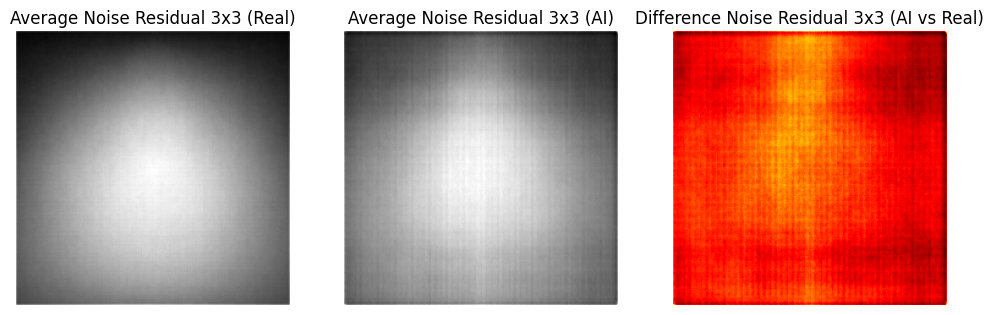

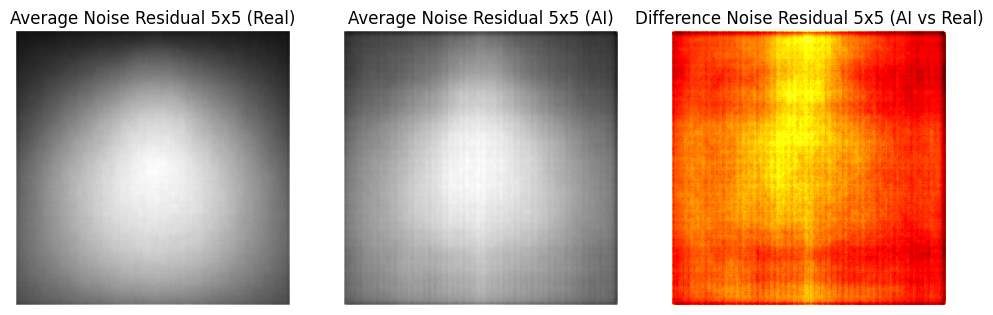

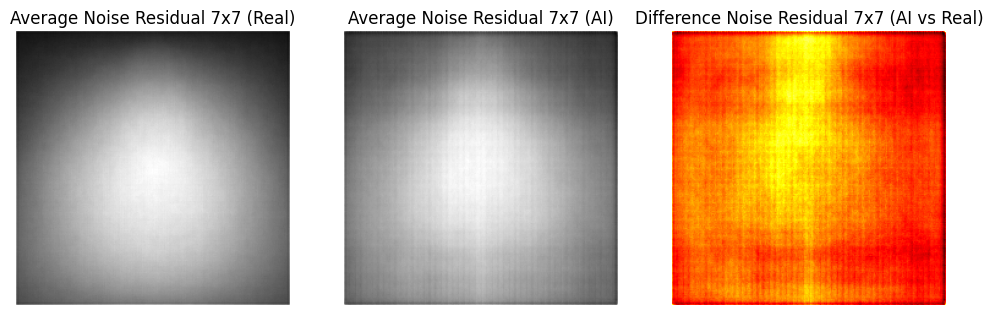

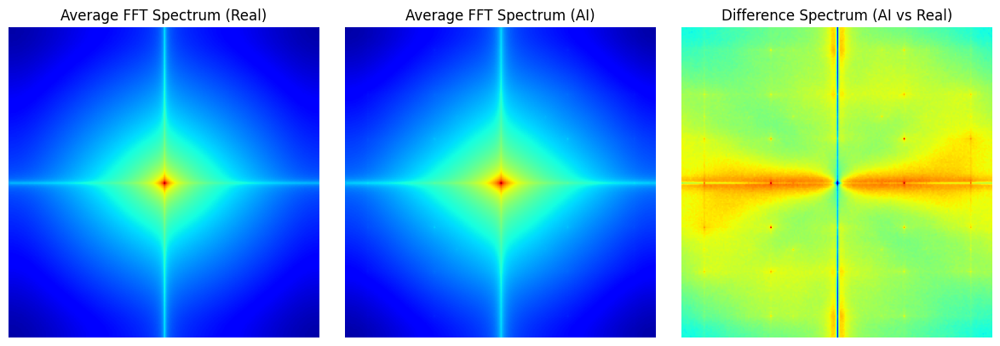

In [ ]:
def compute_noise_residual(image, kernel_size=5, sigma=1.0):
    """
    Applies Gaussian filtering to smooth the image and computes the noise residual.
    :param image: Torch tensor (CxHxW) or NumPy array
    :param kernel_size: Kernel size for Gaussian filter
    :param sigma: Standard deviation for Gaussian filter
    :return: Residual noise map
    """
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose(1, 2, 0)  # Convert CxHxW to HxWxC
    if image.shape[-1] == 3:  # Convert to grayscale if RGB
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply Gaussian smoothing
    smoothed = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)

    # Compute residual (difference between original and smoothed image)
    residual = cv2.absdiff(image, smoothed)

    return residual

def compute_fft_spectrum(image):
    """
    Computes the Fourier Transform (FFT) spectrum of an image.
    :param image: Torch tensor (CxHxW) or NumPy array
    :return: Log-magnitude spectrum
    """
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose(1, 2, 0)  # Convert CxHxW to HxWxC
    if image.shape[-1] == 3:  # Convert to grayscale if RGB
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Compute FFT
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)  # Shift zero frequency component to the center
    magnitude_spectrum = np.log(np.abs(fshift) + 1e-5)  # Log scale

    return magnitude_spectrum

real_residuals_3, ai_residuals_3 = [], []
real_residuals_5, ai_residuals_5 = [], []
real_residuals_7, ai_residuals_7 = [], []
real_spectra, ai_spectra = [], []

for i in tqdm(range(len(full_dataset)), desc="Extracting FFT Spectrum"):
    image, label, _ = full_dataset[i]

    residual_3 = compute_noise_residual(image, kernel_size=3)
    residual_5 = compute_noise_residual(image, kernel_size=5)
    residual_7 = compute_noise_residual(image, kernel_size=7)
    spectrum = compute_fft_spectrum(image)
    
    if label == 0: 
        real_residuals_3.append(residual_3)
        real_residuals_5.append(residual_5)
        real_residuals_7.append(residual_7)
        real_spectra.append(spectrum)
    else: 
        ai_residuals_3.append(residual_3)
        ai_residuals_5.append(residual_5)
        ai_residuals_7.append(residual_7)
        ai_spectra.append(spectrum)

real_residuals_3, ai_residuals_3 = np.array(real_residuals_3), np.array(ai_residuals_3)
real_residuals_5, ai_residuals_5 = np.array(real_residuals_5), np.array(ai_residuals_5)
real_residuals_7, ai_residuals_7 = np.array(real_residuals_7), np.array(ai_residuals_7)
real_spectra, ai_spectra = np.array(real_spectra), np.array(ai_spectra)

avg_real_residuals_3, avg_ai_residuals_3 = np.mean(real_residuals_3, axis=0), np.mean(ai_residuals_3, axis=0)
avg_real_residuals_5, avg_ai_residuals_5 = np.mean(real_residuals_5, axis=0), np.mean(ai_residuals_5, axis=0)
avg_real_residuals_7, avg_ai_residuals_7 = np.mean(real_residuals_7, axis=0), np.mean(ai_residuals_7, axis=0)
avg_real_spectrum, avg_ai_spectrum = np.mean(real_spectra, axis=0), np.mean(ai_spectra, axis=0)

diff_residuals_3 = np.abs(avg_real_residuals_3 - avg_ai_residuals_3)
diff_residuals_5 = np.abs(avg_real_residuals_5 - avg_ai_residuals_5)
diff_residuals_7 = np.abs(avg_real_residuals_7 - avg_ai_residuals_7)
diff_spectrum = np.abs(avg_real_spectrum - avg_ai_spectrum)

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(avg_real_residuals_3, cmap="gray")
plt.title("Average Noise Residual 3x3 (Real)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(avg_ai_residuals_3, cmap="gray")
plt.title("Average Noise Residual 3x3 (AI)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(diff_residuals_3, cmap="hot")
plt.title("Difference Noise Residual 3x3 (AI vs Real)")
plt.axis("off")

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(avg_real_residuals_5, cmap="gray")
plt.title("Average Noise Residual 5x5 (Real)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(avg_ai_residuals_5, cmap="gray")
plt.title("Average Noise Residual 5x5 (AI)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(diff_residuals_5, cmap="hot")
plt.title("Difference Noise Residual 5x5 (AI vs Real)")
plt.axis("off")

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(avg_real_residuals_7, cmap="gray")
plt.title("Average Noise Residual 7x7 (Real)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(avg_ai_residuals_7, cmap="gray")
plt.title("Average Noise Residual 7x7 (AI)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(diff_residuals_7, cmap="hot")
plt.title("Difference Noise Residual 7x7 (AI vs Real)")
plt.axis("off")

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(avg_real_spectrum, cmap="jet")
plt.title("Average FFT Spectrum (Real)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(avg_ai_spectrum, cmap="jet")
plt.title("Average FFT Spectrum (AI)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(diff_spectrum, cmap="jet")
plt.title("Difference Spectrum (AI vs Real)")
plt.axis("off")

plt.tight_layout()
plt.show()

The kernel size for noise residuals matters.
- Small kernel (3x3)
    - Only removes fine details and very small noise patterns.
    - Leaves behind more textural details in the residual.
    - May better detect subtle artifacts in AI-generated images.
- Large kernel (7x7)
    - Removes more significant details like edges and textures.
    - Residual mainly highlights larger-scale noise patterns.
    - May better detect unnatural smoothness or compression artifacts.

It is obvious there is some discernible differences we can leverage here, which would be impossible without delving into the frequency domain. 

We also chose the 7x7 kernel as the difference was more discernible.

However, there are too many frequency components (for both noise residuals and FFT spectrum) and we need to perform PCA to get only the most significant ones.

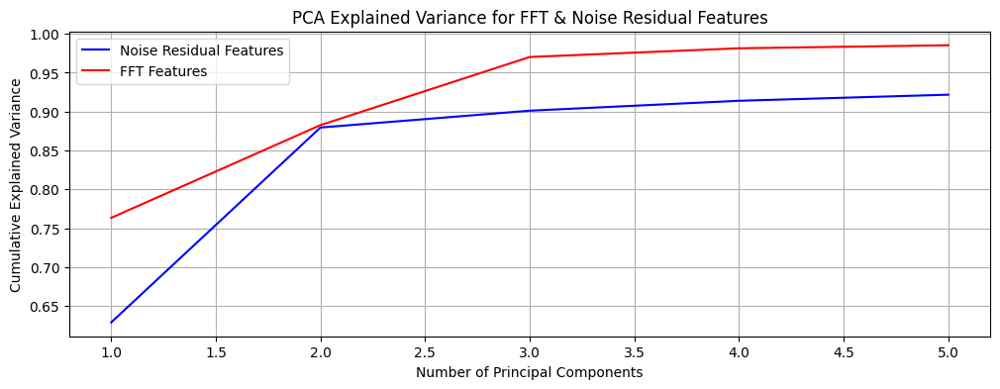

In [ ]:
from sklearn.decomposition import PCA

pca_diff_residuals_7 = PCA(n_components=5)  
residual_reduced = pca_diff_residuals_7.fit_transform(diff_residuals_7)
cum_explained_residual = np.cumsum(pca_diff_residuals_7.explained_variance_ratio_)

pca_diff_spectrum = PCA(n_components=5)
spectra_reduced = pca_diff_spectrum.fit_transform(diff_spectrum)
cum_explained_spectra = np.cumsum(pca_diff_spectrum.explained_variance_ratio_)

plt.figure(figsize=(12,4))
plt.plot(range(1, len(cum_explained_residual) + 1), cum_explained_residual, label="Noise Residual Features", color="blue")
plt.plot(range(1, len(cum_explained_spectra) + 1), cum_explained_spectra, label="FFT Features", color="red")
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance for FFT & Noise Residual Features")
plt.legend()
plt.grid()
plt.show()


Noise residuals only need 2 principal components to explain 88% of variance

FFT only need 3 principal components to explain 98% of variance

In [ ]:
# Select top 15 most important features (by absolute loading) for PC1 and PC2 for noise residuals
important_feature_indices = np.argsort(-np.abs(pca_diff_residuals_7.components_[:2]), axis=1)[:,:15]
print(important_feature_indices)

array([[ 91,  88,  87,  93,  86,  89,  90,  84,  74,  79,  95,  70,  77,
         81,  82],
       [121, 120, 122, 119, 107, 123, 117, 116, 124,  97, 118,  98,  99,
        106, 101]])

In [ ]:
# Select top 15 most important features (by absolute loading) for PC1, PC2, PC3 for noise residuals
important_feature_indices = np.argsort(-np.abs(pca_diff_spectrum.components_[:3]), axis=1)[:,:15]
print(important_feature_indices)

array([[ 16, 208, 217,   7,   1, 223, 207,  17, 221,   3, 215,   9,   0,
          8, 216],
       [112, 144,  80,  81, 143,  83, 141,  79, 145,  84, 140, 142,  82,
        139,  85],
       [182,  42, 178,  46, 176,  48, 181,  43, 185,  39, 186,  38, 179,
         45, 183]])

# Hybrid Ensemble Attempt 4


1. To evaluate the strengths of different architectures independently:

- RegNet was reused from earlier experiments
- EfficientNet was introduced for its compound scaling strategy, which efficiently balances depth, width, and resolution—making it well-suited for capturing fine-grained visual patterns in images.

Then, we utilized Optuna to optimize both RegNet and EfficientNet architectures, tuning learning rate, dropout, number of fc neurons, and batch size for improved performance.

2. Expanded Handcrafted Feature Set

The handcrafted feature vector was expanded to include:
- Traditional image descriptors: contrast, vibrancy, and sharpness (via Laplacian variance)
- Log-DCT coefficients to capture dominant frequency content
- Noise residuals (from a 7×7 Gaussian kernel) to highlight high-frequency artifacts
- FFT spectrum magnitudes to emphasize frequency-domain patterns

3. Tabular Learning with AutoGluon

We used AutoGluon, an AutoML framework, to:
- Combine CLIP features (from CLIB ViT encoder) and the handcrafted features
- Automatically perform hyperparameter tuning, non-deep learning model selection, and stacked ensembling
- Use meta-learning to find optimal combinations of features and base learners

4. Soft Voting Ensemble

Rather than relying on individual model predictions or hard voting:
- Each model outputs class probabilities instead of hard labels
- These probabilities are weighted based on each model’s validation performance
- The final prediction is derived from the weighted average of probabilities, enabling the ensemble to:
    - Leverage RegNet and EfficientNet’s visual inductive biases
    - Incorporate AutoGluon’s robust feature optimization and ensembling capabilities

This hybrid ensemble balances diversity and strength, improving generalization on unseen data.

In [ ]:
import optuna
def train_model(
    model_name,
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler=None, 
    num_epochs=10, 
    patience=3,
    device="cuda"
):
    model.to(device)

    train_losses, train_accuracies = [], []
    val_losses, val_accuracies, val_f1s = [], [], []

    best_val_loss = float("inf")
    patience_counter = 0

    for epoch in range(num_epochs):
        model.train()
        epoch_loss, epoch_acc = 0.0, 0.0

        # Training loop
        for data, label in tqdm(train_loader, desc=f"Training Epoch {epoch+1}"):
            data, label = data.to(device), label.to(device)

            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, label)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            preds = output.argmax(dim=1)
            epoch_acc += (preds == label).float().mean().item()

        epoch_loss /= len(train_loader)
        epoch_acc /= len(train_loader)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc)

        # Validation
        model.eval()
        val_loss, val_acc = 0.0, 0.0
        val_preds, val_labels = [], []

        with torch.no_grad():
            for data, label in tqdm(val_loader, desc=f"Validation Epoch {epoch+1}"):
                data, label = data.to(device), label.to(device)
                output = model(data)

                loss = criterion(output, label)
                val_loss += loss.item()

                preds = output.argmax(dim=1)
                val_acc += (preds == label).float().mean().item()

                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(label.cpu().numpy())

        val_loss /= len(val_loader)
        val_acc /= len(val_loader)
        val_f1 = f1_score(val_labels, val_preds, average="macro") 

        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        print(
            f"Epoch [{epoch+1}/{num_epochs}] "
            f"Train Loss: {epoch_loss:.4f} | Train Acc: {epoch_acc:.4f} | "
            f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f}"
        )

        # Check for early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            model.eval()
            torch.save(model.state_dict(), f"{model_name}.pth")  # Save best model
            model.train()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

        # Adjust learning rate
        if scheduler:
            scheduler.step(val_loss)

    return train_losses, train_accuracies, val_losses, val_accuracies, val_f1s

### Regnet

In [ ]:
root_dir = "/AIdentify_data/blip_similarity/0.8"
train_dataset = RegnetDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform)
val_dataset = RegnetDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform)

class RegNetFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate, fc_neurons):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, fc_neurons), 
            nn.BatchNorm1d(fc_neurons),
            nn.SiLU(),                
            nn.Dropout(dropout_rate),          
            nn.Linear(fc_neurons, 2), 
        )

    def forward(self, x):
        return self.regnet(x)  

In [ ]:
model_name = "optuna_regnet"

def objective(trial):
    """Objective function for Optuna to maximize macro F1-score."""

    lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_rate = trial.suggest_float("dropout", 0.2, 0.5)
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128])
    fc_neurons = trial.suggest_categorical("fc_neurons", [128, 256, 512, 1024])
    print(trial)
    print(f"lr: {lr}, weight_decay: {weight_decay}, dropout_rate: {dropout_rate}, batch_size: {batch_size}, fc_neurons: {fc_neurons}")
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = RegNetFeatureExtractor(dropout_rate=dropout_rate, fc_neurons=fc_neurons).to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.CrossEntropyLoss()

    _, _, _, _, val_f1s = train_model(
        model_name,
        model,
        train_loader,
        val_loader,
        criterion,
        optimizer,
        scheduler=None,
        num_epochs=4, 
        patience=2,
        device=device
    )

    return max(val_f1s)

study = optuna.create_study(direction="maximize")  
study.optimize(objective, n_trials=None, timeout=39000, n_jobs = -1)  

print(f"{model_name} Best Hyperparameters:\n{study.best_params}")


17.0s	1	Device used : cuda
18.3s	2	[I 2025-03-02 18:25:19,575] A new study created in memory with name: no-name-415bdaf1-2f6e-4ca1-9b63-7f5d3e01ec19
4226.3s	3	[I 2025-03-02 19:35:27,535] Trial 3 finished with value: 0.9785931250876756 and parameters: {'lr': 0.00039814130290055535, 'weight_decay': 0.00016574169044349357, 'dropout': 0.3275395431416269, 'batch_size': 128, 'fc_neurons': 256}. Best is trial 3 with value: 0.9785931250876756.
4250.8s	4	[I 2025-03-02 19:35:52,038] Trial 0 finished with value: 0.9729138896904903 and parameters: {'lr': 6.465437187727956e-05, 'weight_decay': 1.160092528171755e-05, 'dropout': 0.22008464545991602, 'batch_size': 64, 'fc_neurons': 256}. Best is trial 3 with value: 0.9785931250876756.
4263.9s	5	[I 2025-03-02 19:36:05,079] Trial 1 finished with value: 0.9641764894494151 and parameters: {'lr': 2.2829225679965663e-05, 'weight_decay': 0.000838816254206583, 'dropout': 0.29358930899444485, 'batch_size': 64, 'fc_neurons': 128}. Best is trial 3 with value: 0

Downloading: "https://download.pytorch.org/models/regnet_y_800mf-58fc7688.pth" to /root/.cache/torch/hub/checkpoints/regnet_y_800mf-58fc7688.pth
100%|██████████| 24.8M/24.8M [00:00<00:00, 174MB/s]
Validation Epoch 1: 100%|██████████| 72/72 [00:09<00:00,  7.67it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [1/50] Train Loss: 0.1957 | Train Acc: 0.9186 | Val Loss: 0.0536 | Val Acc: 0.9796 | Val F1: 0.9795


Validation Epoch 2: 100%|██████████| 72/72 [00:07<00:00,  9.70it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [2/50] Train Loss: 0.1274 | Train Acc: 0.9485 | Val Loss: 0.0633 | Val Acc: 0.9748 | Val F1: 0.9747


Validation Epoch 3: 100%|██████████| 72/72 [00:07<00:00,  9.76it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [3/50] Train Loss: 0.1010 | Train Acc: 0.9597 | Val Loss: 0.0618 | Val Acc: 0.9774 | Val F1: 0.9773


Validation Epoch 4: 100%|██████████| 72/72 [00:08<00:00,  8.98it/s]


Epoch [4/50] Train Loss: 0.0800 | Train Acc: 0.9682 | Val Loss: 0.0606 | Val Acc: 0.9774 | Val F1: 0.9773
Early stopping triggered.


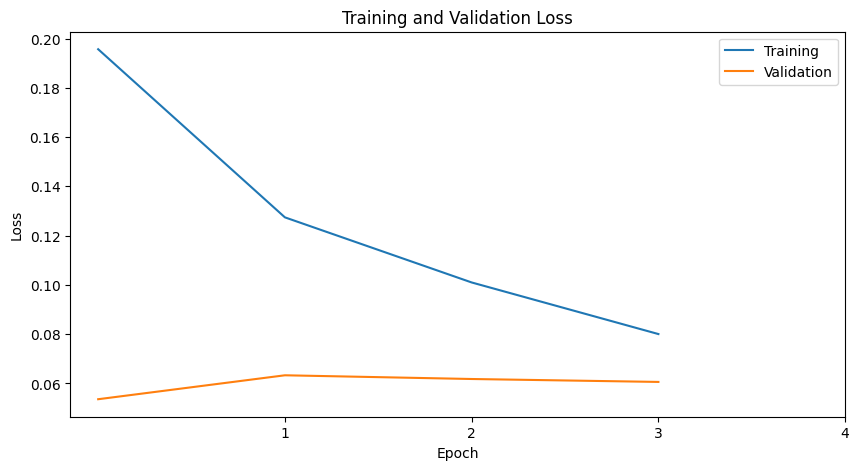

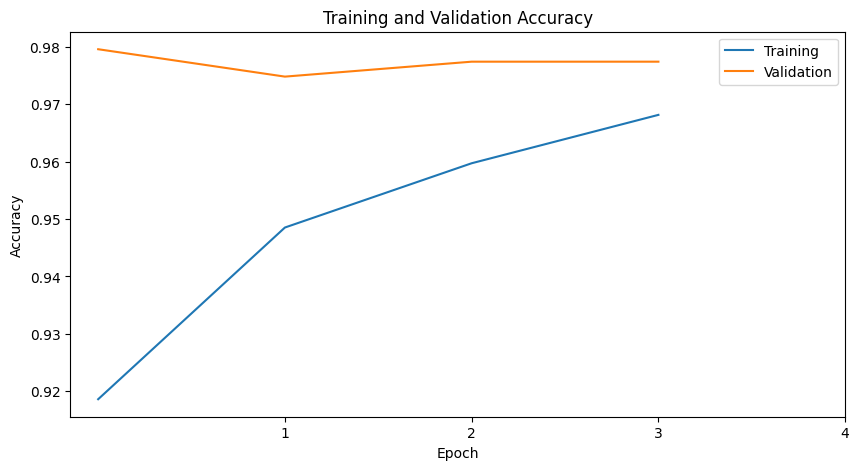

<ipython-input-2-6ccb86eb47dd>:241: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 72

Test F1: 0.9782


Predicting: 100%|██████████| 174/174 [01:08<00:00,  2.56it/s]


,id,label
0,test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg,1
1,test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg,0
2,test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg,0
3,test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg,0
4,test_data_v2/a16495c578b7494683805484ca27cf9f.jpg,0


In [ ]:
best_lr = study.best_params["lr"]
best_weight_decay = study.best_params["weight_decay"]
best_dropout = study.best_params["dropout"]
best_batch_size = study.best_params["batch_size"]
best_fc_neurons = study.best_params["fc_neurons"]

train_loader = DataLoader(train_dataset, batch_size=best_batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

final_model = RegNetFeatureExtractor(best_dropout, best_fc_neurons).to(device)
optimizer = optim.AdamW(final_model.parameters(), lr=best_lr, weight_decay=best_weight_decay)
criterion = nn.CrossEntropyLoss()
scheduler = StepLR(optimizer, step_size=1)

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    model_name,
    final_model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler=scheduler,
    num_epochs=50,
    patience=3,
    device=device
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

test_dataset = RegnetDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform)
submit_dataset = RegnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
test_loader = DataLoader(test_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

test_model(model_name, final_model, test_loader)
submit_model(model_name, final_model, submit_loader)

### Efficientnet

In [ ]:
root_dir = "/AIdentify_data/blip_similarity/0.8"
train_dataset = EfficientnetDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform)
val_dataset = EfficientnetDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform)

In [ ]:
model_name = "optuna_efficientnet_2"

def objective(trial):
    """Objective function for Optuna to maximize macro F1-score."""

    lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_rate = trial.suggest_float("dropout", 0.2, 0.5)
    batch_size = trial.suggest_categorical("batch_size", [8, 16])
    fc_neurons = trial.suggest_categorical("fc_neurons", [128, 256])
    print(trial)
    print(f"lr: {lr}, weight_decay: {weight_decay}, dropout_rate: {dropout_rate}, batch_size: {batch_size}, fc_neurons: {fc_neurons}")
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = EfficientNetFeatureExtractor(dropout_rate=dropout_rate, fc_neurons=fc_neurons).to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.CrossEntropyLoss()

    _, _, _, _, val_f1s = train_model(
        model_name,
        model,
        train_loader,
        val_loader,
        criterion,
        optimizer,
        scheduler=None,
        num_epochs=4,  
        patience=2,
        device=device
    )

    return max(val_f1s)

study = optuna.create_study(direction="maximize")  
study.optimize(objective, n_trials=None, timeout=39000, n_jobs = -1)  

print(f"{model_name} Best Hyperparameters:\n{study.best_params}")


17.5s	1	Device used : cuda
18.9s	2	[I 2025-03-02 18:25:53,082] A new study created in memory with name: no-name-160f5a77-a0fd-4eb7-af70-ccb8e56f061f
24802.1s	3	[I 2025-03-03 01:18:56,239] Trial 2 finished with value: 0.9943206467023125 and parameters: {'lr': 0.00022106419174793286, 'weight_decay': 1.3269574776517144e-05, 'dropout': 0.2996744029995808, 'batch_size': 8, 'fc_neurons': 256}. Best is trial 2 with value: 0.9943206467023125.
33087.7s	4	[I 2025-03-03 03:37:01,793] Trial 3 finished with value: 0.9943203128265649 and parameters: {'lr': 3.0363408636719003e-05, 'weight_decay': 4.126697331843135e-06, 'dropout': 0.299274152140059, 'batch_size': 8, 'fc_neurons': 128}. Best is trial 2 with value: 0.9943206467023125.
33087.7s	5	[I 2025-03-03 03:37:01,807] Trial 1 finished with value: 0.9965049699967936 and parameters: {'lr': 2.416964398047189e-05, 'weight_decay': 1.8599527343550335e-06, 'dropout': 0.2892056672743183, 'batch_size': 8, 'fc_neurons': 256}. Best is trial 1 with value: 0.9


Downloading: "https://download.pytorch.org/models/efficientnet_v2_m-dc08266a.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_m-dc08266a.pth
100%|██████████| 208M/208M [00:00<00:00, 234MB/s] 
Validation Epoch 1: 100%|██████████| 287/287 [00:12<00:00, 22.48it/s]
Epoch [1/50] Train Loss: 0.1853 | Train Acc: 0.9328 | Val Loss: 0.0615 | Val Acc: 0.9821 | Val F1: 0.9821
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
Validation Epoch 2: 100%|██████████| 287/287 [00:12<00:00, 22.85it/s]
Ep

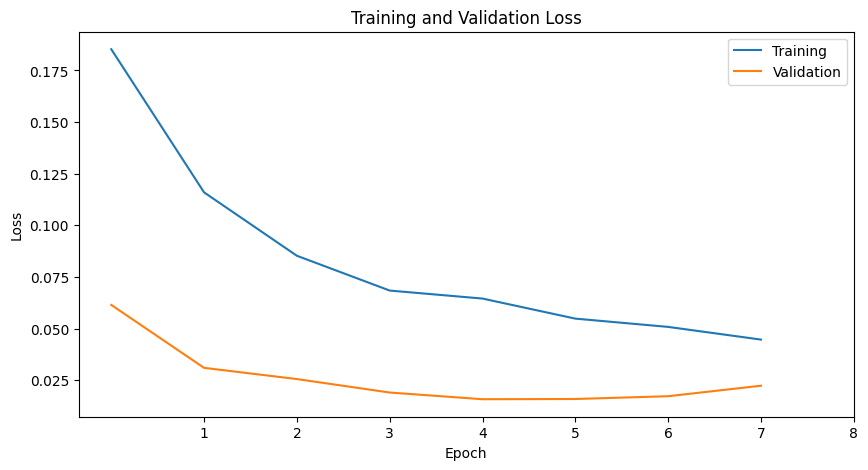

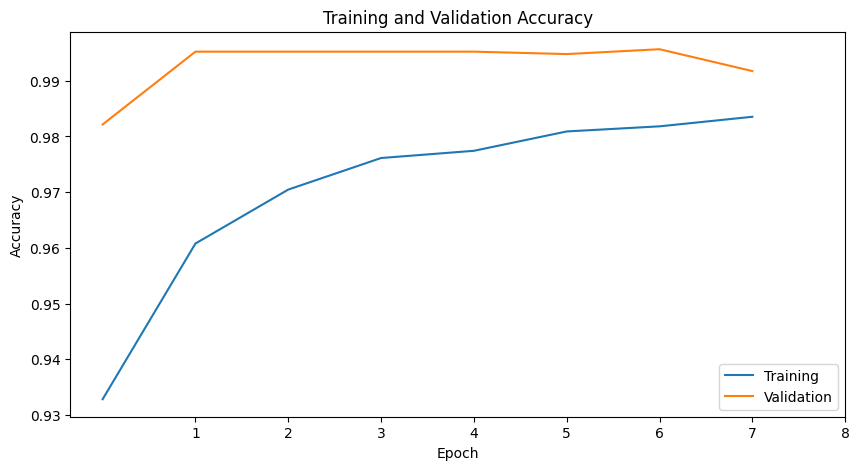


<ipython-input-2-6ccb86eb47dd>:241: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 2

In [ ]:
best_lr = study.best_params["lr"]
best_weight_decay = study.best_params["weight_decay"]
best_dropout = study.best_params["dropout"]
best_batch_size = study.best_params["batch_size"]
best_fc_neurons = study.best_params["fc_neurons"]

train_loader = DataLoader(train_dataset, batch_size=best_batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

final_model = EfficientNetFeatureExtractor(best_dropout, best_fc_neurons).to(device)
optimizer = optim.AdamW(final_model.parameters(), lr=best_lr, weight_decay=best_weight_decay)
scheduler = StepLR(optimizer, step_size=1)
criterion = nn.CrossEntropyLoss()

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    model_name,
    final_model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler=scheduler,
    num_epochs=50,
    patience=3,
    device=device
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

test_dataset = EfficientnetDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform)
submit_dataset = EfficientnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
test_loader = DataLoader(test_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

test_model(model_name, final_model, test_loader)
submit_model(model_name, final_model, submit_loader)

### Autogluon

In [ ]:
from transformers import CLIPProcessor, CLIPModel
from autogluon.tabular import TabularPredictor

def dct_log_transform(image):
    """ Apply Discrete Cosine Transform (DCT) to extract handcrafted features. """
    image = np.array(image.convert("L"))  
    dct = cv2.dct(np.float32(image))
    log_dct = np.log(np.abs(dct) + 1e-5) 
    
    # Extract low-frequency energy as a feature
    handcrafted_dct_features = np.array([
        np.mean(log_dct[:10, :10]),  # Mean of top-left 10x10 block
        np.var(log_dct[:10, :10]),   # Variance of top-left 10x10 block
    ], dtype=np.float32)  # Keep it small to avoid high dimensionality

    return handcrafted_dct_features

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)

    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    # Log DCT
    dct_features = dct_log_transform(Image.open(image_path).convert("RGB"))
    
    # From PCA
    noise_residual = compute_noise_residual(image, kernel_size=7)[:, [ 91,  88,  87,  93,  86,  89,  90,  84,  74,  79,  95,  70,  77, 81,  82, 121, 120, 122, 119, 107, 123, 117, 116, 124,  97, 118,  98,  99, 106, 101]].mean(axis=0).flatten() 
    fft_features = compute_fft_spectrum(image)[:, [ 16, 208, 217,   7,   1, 223, 207,  17, 221,   3, 215,   9,   0, 8, 216, 112, 144,  80,  81, 143,  83, 141,  79, 145,  84, 140, 142,  82, 139,  85, 182,  42, 178,  46, 176,  48, 181,  43, 185,  39, 186,  38, 179, 45, 183]].mean(axis=0).flatten()
    
    return np.concatenate((np.array([contrast, vibrancy, laplacian_var]), dct_features, noise_residual, fft_features), axis=0).astype(np.float32)

class HybridEnsemble(nn.Module):
    def __init__(self, clip_model, feature_dim=80):
        super(HybridEnsemble, self).__init__()
        self.clip_model = clip_model
        
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_fusion = nn.Linear(256 * 2, 2)

    def forward(self, clip_input, hand_features):
        clip_features = self.fc_clip(self.clip_model(clip_input))
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((clip_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
batch_size = 256
model = HybridEnsemble(clip_feature_extractor).to(device)

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")

        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        hand_features = extract_features(img_path)  

        if self.submit:
            return clip_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return clip_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"
train_dataset = HybridDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform)
val_dataset = HybridDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform)
test_dataset = HybridDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform)
submit_dataset = HybridDataset(f"{root_dir}/test.csv", root_dir, transform_vit=imagenet_transform, submit=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

train_df = extract_autogluon_features(model, train_loader, submit=False)
val_df = extract_autogluon_features(model, val_loader, submit=False)

predictor = TabularPredictor(
    label="label",  
    eval_metric="f1_macro" 
).fit(train_data=train_df, tuning_data=val_df, use_bag_holdout=True, presets="best_quality", time_limit=39000)
test_df = extract_autogluon_features(model, test_loader)
test_results = predictor.evaluate(test_df)

submit_df = extract_autogluon_features(model, submit_loader, submit=True)
submit_predictions = predictor.predict(submit_df)
submission_df = pd.DataFrame({
        'id': pd.read_csv(submit_path)["id"].tolist(),
        'label': submit_predictions
    })
submission_df.to_csv("submit_aug_hybrid_autogluon_residuals_ksamp_mean.csv", index=False)

### Soft voting (All together)

In [ ]:
from autogluon.tabular import TabularPredictor
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")

        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        hand_features = extract_features(img_path)  

        if self.submit:
            return clip_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return clip_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"

###################################################

class RegNetFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate, fc_neurons):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, fc_neurons), 
            nn.BatchNorm1d(fc_neurons),
            nn.SiLU(),                
            nn.Dropout(dropout_rate),  
            nn.Linear(fc_neurons, 2) 
        )

    def forward(self, x):
        return self.regnet(x)  

class HybridEnsemble(nn.Module):
    def __init__(self, clip_model, feature_dim=80):
        super(HybridEnsemble, self).__init__()
        self.clip_model = clip_model
        
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_fusion = nn.Linear(256 * 2, 2)

    def forward(self, clip_input, hand_features):
        clip_features = self.fc_clip(self.clip_model(clip_input))
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((clip_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

def dct_log_transform(image):
    """ Apply Discrete Cosine Transform (DCT) to extract handcrafted features. """
    image = np.array(image.convert("L")) 
    dct = cv2.dct(np.float32(image)) 
    log_dct = np.log(np.abs(dct) + 1e-5)  
    
    handcrafted_dct_features = np.array([
        np.mean(log_dct[:10, :10]),  
        np.var(log_dct[:10, :10]),   
    ], dtype=np.float32) 

    return handcrafted_dct_features

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)

    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    dct_features = dct_log_transform(Image.open(image_path).convert("RGB"))
    
    noise_residual = compute_noise_residual(image, kernel_size=7)[:, [ 91,  88,  87,  93,  86,  89,  90,  84,  74,  79,  95,  70,  77, 81,  82, 121, 120, 122, 119, 107, 123, 117, 116, 124,  97, 118,  98,  99, 106, 101]].mean(axis=0).flatten() 
    fft_features = compute_fft_spectrum(image)[:, [ 16, 208, 217,   7,   1, 223, 207,  17, 221,   3, 215,   9,   0, 8, 216, 112, 144,  80,  81, 143,  83, 141,  79, 145,  84, 140, 142,  82, 139,  85, 182,  42, 178,  46, 176,  48, 181,  43, 185,  39, 186,  38, 179, 45, 183]].mean(axis=0).flatten()
    
    return np.concatenate((np.array([contrast, vibrancy, laplacian_var]), dct_features, noise_residual, fft_features), axis=0).astype(np.float32)

###################################################
regnet_model = RegNetFeatureExtractor(dropout_rate=0.21622893338373814, fc_neurons=128).to(device)
regnet_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_regnet.pth"))
regnet_model.eval()
submit_dataset = RegnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=32, shuffle=False, num_workers=4)
regnet_probs = get_model_probabilities(regnet_model, submit_loader)

efficientnet_model = EfficientNetFeatureExtractor(dropout_rate=0.4136754512789548,  fc_neurons=256).to(device)
efficientnet_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_efficientnet.pth"))
efficientnet_model.eval()
submit_dataset = EfficientnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=8, shuffle=False, num_workers=4)
efficientnet_probs = get_model_probabilities(efficientnet_model, submit_loader)

clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
extract_model = HybridEnsemble(clip_feature_extractor).to(device)
submit_dataset = HybridDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=256, shuffle=False, num_workers=4)
submit_df = extract_autogluon_features(extract_model, submit_loader, submit=True)
autogluon_model = TabularPredictor.load("/AIdentify_data/models/autogluon_ksamp_mean")
autogluon_probs = autogluon_model.predict_proba(submit_df).to_numpy()

# Define weight distribution (must sum to 1)
# Based on individual scores RegNet: 0.52577, EfficientNet: 0.35815, AutoGluon: 0.64278
weights = np.array([0.2, 0.2, 0.6])

submit_probs = (weights[0] * regnet_probs +
               weights[1] * efficientnet_probs +
               weights[2] * autogluon_probs)

submit_predictions = np.argmax(submit_probs, axis=1)
submission_df = pd.DataFrame({
    'id': pd.read_csv(submit_path)["id"].tolist(),
    'label': submit_predictions
})
submission_df.to_csv("submission_soft_voting_ensemble_3.csv", index=False)


Downloading: "https://download.pytorch.org/models/regnet_y_800mf-58fc7688.pth" to /root/.cache/torch/hub/checkpoints/regnet_y_800mf-58fc7688.pth
100%|██████████| 24.8M/24.8M [00:00<00:00, 164MB/s]
<ipython-input-4-69a9ff26b118>:301: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control

Scores

- Regnet
    - Val F1: 0.9773
    - Test F1: 0.9782
    - Public Submission Score: 0.53629

- EfficientNet
    - Val F1: 0.9917
    - Test F1: 0.9930
    - Public Submission Score: 0.34393

- Autogluon
    - Val F1: 0.9872
    - Test F1: 0.9689
    - Public Submission Score: 0.65444

- Soft voting (weights in order of Regnet, EfficientNet, Autogluon)
    - [0.35, 0.15, 0.5]
        - Public Submission Score: 0.62511
    - [0.6, 0, 0.4]
        - Public Submission Score: 0.59161
    - [0.4, 0, 0.6]
        - Public Submission Score: 0.68971
    - [0.3, 0, 0.7]
        - Public Submission Score: 0.67544
    - [0.4, 0.1, 0.5]
        - Public Submission Score: 0.62815
    - [0.3, 0.1, 0.6]
        - Public Submission Score: 0.69108
    - [0.2, 0.2, 0.6]
        - Public Submission Score: <b>0.69179</b>
    - [0.1, 0.3, 0.6]
        - Public Submission Score: 0.68911


As evident, soft voting indeed boosted the performance!

We also thought it was really interesting that Autogluon (stacking, ensemble of non-deep learning models) was able to beat deep learning models, when given good features to work with.

# Community insights

## Architecture

### ConvNext

Using just ConvNext, [this submission](https://www.kaggle.com/code/shubhankardubey0987/reegelserpent-final-submission/notebook#Convnext_base) managed to attain a public submission score of 0.75 

In [ ]:
import torchvision.models as models

model = models.convnext_large(weights="DEFAULT")
for param in model.features.parameters():
    param.requires_grad = False
for param in model.features[-2:].parameters():
    param.requires_grad = True

# Updated Classifier with Higher Dropout
model.classifier = nn.Sequential(
    nn.AdaptiveAvgPool2d((1, 1)),
    nn.Flatten(),
    nn.Linear(1536, 512),
    nn.ReLU(),
    nn.Dropout(0.6),  # Increased dropout
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(256, 2)
)

model.to(device)

# Loss, Optimizer, Scheduler
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW([
    {'params': model.features[-2:].parameters(), 'lr': lr_backbone},
    {'params': model.classifier.parameters(), 'lr': lr_classifier}
], weight_decay=1e-4)

### ConvNext + Swin + Global_avg_pooling

[This submission](https://www.kaggle.com/code/sheemamasood/ai-vs-human-final-submission?scriptVersionId=225485479&cellId=51) managed to attain a public submission score of 0.80

### Mixed Precision Training with GradScaler

(In the same submission) achieved faster training speeds, reduced memory usage, and the ability to train larger models

## Preprocessing

### RGB Color distribution analysis (w.r.t image size)

[This submission](https://www.kaggle.com/code/shubhankardubey0987/reegelserpent-final-submission/notebook#Data-Insights) explored the RGB Color distribution w.r.t image size, which we missed out on.

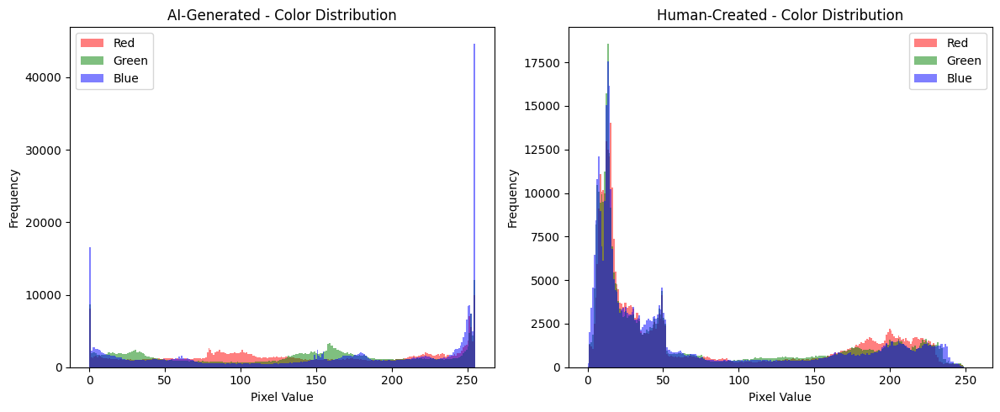

AI-Generated Image (left plot): The color distribution for the AI-generated image shows very sharp peaks for the Red and Blue channels near the maximum pixel value (255). The Green channel, however, has a more evenly spread distribution, suggesting that the AI-generated image might have higher saturation and contrast in the red and blue channels, possibly resulting in a more intense or artificial color appearance.

Human-Created Image (right plot): In the human-created image, the color distribution is more balanced, with all three color channels (Red, Green, and Blue) showing similar spread patterns. The Green channel has a slightly higher frequency, but the overall distribution appears more natural, with less contrast between the channels.

In conclusion, AI-generated images exhibit a more pronounced intensity in the Red and Blue channels, while human-created images demonstrate a more balanced and natural distribution of colors across the RGB spectrum


In [ ]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd

def plot_color_distribution_side_by_side(img_path1, img_path2, title1="AI-Generated", title2="Human-Created"):
    img1 = cv2.imread(img_path1)
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    
    img2 = cv2.imread(img_path2)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    # Splitting into RGB channels
    r1, g1, b1 = cv2.split(img1)
    r2, g2, b2 = cv2.split(img2)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns

    # AI-Generated Image Histogram
    axes[0].hist(r1.ravel(), bins=256, color="red", alpha=0.5, label="Red")
    axes[0].hist(g1.ravel(), bins=256, color="green", alpha=0.5, label="Green")
    axes[0].hist(b1.ravel(), bins=256, color="blue", alpha=0.5, label="Blue")
    axes[0].set_xlabel("Pixel Value")
    axes[0].set_ylabel("Frequency")
    axes[0].set_title(f"{title1} - Color Distribution")
    axes[0].legend()

    # Human-Created Image Histogram
    axes[1].hist(r2.ravel(), bins=256, color="red", alpha=0.5, label="Red")
    axes[1].hist(g2.ravel(), bins=256, color="green", alpha=0.5, label="Green")
    axes[1].hist(b2.ravel(), bins=256, color="blue", alpha=0.5, label="Blue")
    axes[1].set_xlabel("Pixel Value")
    axes[1].set_ylabel("Frequency")
    axes[1].set_title(f"{title2} - Color Distribution")
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# Select random AI-generated and human-created images
sample_ai = df_train[df_train["label"] == 1]["file_name"].sample(1).values[0]
sample_human = df_train[df_train["label"] == 0]["file_name"].sample(1).values[0]

# Plot side by side
plot_color_distribution_side_by_side(sample_ai, sample_human)

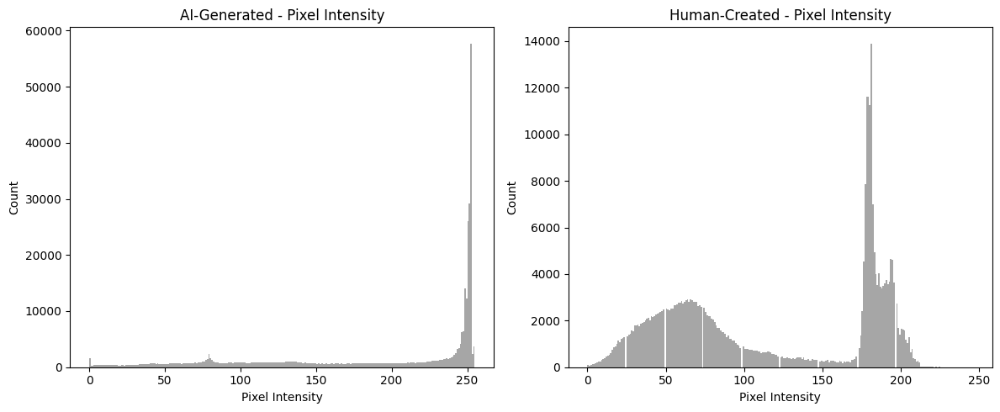

Insights on Pixel Intensity Distribution
AI-Generated Image (left plot): The pixel intensity distribution of AI-generated images shows a sharp peak near the maximum pixel value (255), with a significant amount of pixels clustered in that region, indicating high contrast and possibly sharp areas in the image.

Human-Created Image (right plot): The pixel intensity distribution of human-created images shows a more spread-out distribution with a peak in the middle range. This suggests a more balanced intensity spread, typical of natural lighting and tones in human-created images.

In summary, the AI-generated images have a concentrated pixel intensity at higher values, indicating high contrast, while the human-created images have a more even distribution of pixel intensities.

In [ ]:
def plot_pixel_intensity_side_by_side(img_path1, img_path2, title1="AI-Generated", title2="Human-Created"):
    img1 = cv2.imread(img_path1, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(img_path2, cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns

    axes[0].hist(img1.ravel(), bins=256, color="gray", alpha=0.7)
    axes[0].set_xlabel("Pixel Intensity")
    axes[0].set_ylabel("Count")
    axes[0].set_title(f"{title1} - Pixel Intensity")

    axes[1].hist(img2.ravel(), bins=256, color="gray", alpha=0.7)
    axes[1].set_xlabel("Pixel Intensity")
    axes[1].set_ylabel("Count")
    axes[1].set_title(f"{title2} - Pixel Intensity")

    plt.tight_layout()
    plt.show()

# Select random AI-generated and human-created images
sample_ai = train_df[train_df["label"] == 1]["file_name"].sample(1).values[0]
sample_human = train_df[train_df["label"] == 0]["file_name"].sample(1).values[0]

# Plot side by side
plot_pixel_intensity_side_by_side(sample_ai, sample_human)

### Online Hard Example Mining (OHEM)

[This submission](https://www.kaggle.com/code/gpch2159/s-lb-0-83404-team-gphw-finalsubmission-v56#2.-Online-Hard-Example-Mining-(OHEM)) explored the harder examples out of the training data to further reduce loss values

Problem Observed:
The model struggled to distinguish "hard" samples, such as unnatural human-edited images labeled as human-generated. These samples often resulted in high loss values during training.

Solution:
We implemented Online Hard Example Mining (OHEM) to focus on the most challenging samples during training.

Specifically:

During each training iteration, the top-k samples with the highest loss values are selected for backpropagation.
To avoid manually tuning the hyperparameter k (or ohem_ratio), we experimented with weighting samples based on their loss values using MSE and RMSE. However, this approach was suboptimal for achieving the best test performance. So, we just fix the k value (or ohem_ratio) for all subsequent trials.

Impact:

OHEM improved the model's ability to handle hard samples, enhancing its robustness and classification accuracy.

In [ ]:
class OHEM:
    def __init__(self, use_ohem: bool = False, ohem_ratio: float = 0.5, method: str = 'ratio'):
        """
        Initialize OHEM module.

        Args:
            use_ohem (bool): Whether to use OHEM.
            ohem_ratio (float): Fraction of hardest samples to keep. Used only if method='ratio'.
            method (str): Method to apply. Options: 'ratio' (top-k hardest samples), 'mse' (mean squared error),
                          or 'rmse' (root mean squared error).
        """
        all_methods = ['ratio', 'mse', 'rmse']
        assert method in all_methods, f"Expect method in {all_methods}, but got {method}."
        if method == 'ratio':
            assert ohem_ratio is not None, "ohem_ratio must be provided when method='ratio'."

        self.use_ohem = use_ohem
        self.ohem_ratio = ohem_ratio
        self.method = method

    def apply(self, loss: torch.Tensor) -> torch.Tensor:
        """
        Apply OHEM to the loss tensor.

        Args:
            loss (torch.Tensor): Per-sample loss values.

        Returns:
            torch.Tensor: Mean loss, MSE, RMSE, or mean of top-k hardest samples after applying OHEM.
        """
        if not self.use_ohem:
            return torch.mean(loss)  # Default behavior: return mean loss

        if self.method == 'ratio':
            # Use top-k hard samples
            num_hard_samples = int(self.ohem_ratio * len(loss))
            hard_loss, _ = torch.topk(loss, num_hard_samples)
            return torch.mean(hard_loss)
        else:
            # Use squared approach on all samples
            squared_loss = torch.square(loss)
            mean_squared_loss = torch.mean(squared_loss)
            if self.method == 'rmse':
                return torch.sqrt(mean_squared_loss)  # RMSE
            else:
                return mean_squared_loss  # MSE

## Data Augmentation

### Test-Time Augmentation (TTA)

[This submission](https://www.kaggle.com/code/sarthak24910/best-models-resnets152-and-xgboost) explores TTA (applying mild augmentations to test images during inference) to make multiple predictions on their augmented versions then average out

In [ ]:
# Base transform for validation/TTA (applied later during inference)
base_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

# TTA transforms (for both human & AI images; use mild augmentations)
tta_transforms = [
    A.Compose([A.HorizontalFlip(p=1.0), *base_transform.transforms]),
    A.Compose([A.VerticalFlip(p=1.0), *base_transform.transforms]),
    A.Compose([A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, p=0.5), *base_transform.transforms]),
    base_transform  # Identity transform
]

### Derived Data Augmentation

[This submission](https://www.kaggle.com/code/gpch2159/s-lb-0-83404-team-gphw-finalsubmission-v56#4.-Data-Augmentation) explored using open-sourced SDXL model to generate realistic images based on the training set samples. (gather additional derived data, instead of external data that is against the competition's rules)

Additionally, we leveraged pre-AI-generated images to boost the model's ability to identify realistic AI-generated images.

We experimented with different strength values to find the optimal balance between realism and diversity.

<hr>
General Kaggle Comps
- Strategy to change thresholds of inference predictions for same model, weights for higher score (squeeze most out of model) => not generalizable but because optimizing leaderboard not for usage. (Even after training, the model's predictions could exhibit bias due to an imbalanced decision threshold. To minimize bias, we optimized the decision threshold after training the model: The threshold was tuned to balance precision and recall, ensuring fair and accurate predictions across both classes.)

https://www.kaggle.com/code/brandosi2023/team-peru-final-submission?scriptVersionId=226369995&cellId=31

- BUT only if model is good. Else, if model is bad, no matter how threshold changes, will be bad / worse


Also can do dynamic thresholding:
- Since the F1 score is 66.570 when all predictions are 1 (The All-Ones Hack for Scores), we can infer that the test dataset is balanced. Therefore, by obtaining the model's predicted probabilities for each image being classified as 1 , and using the median of these probabilities as the threshold, we can achieve satisfactory results. I'm not entirely sure if this can be considered a dataset artifact. After all, even if the dataset is imbalanced, we can still determine the threshold through learning. The file probabilities.csv records the probabilities output by the model. After the run is completed, you can manually set the threshold to obtain different results.


https://www.kaggle.com/code/gaokui/best-student-my-simplified-solution#Get-The-Submission-file

In [ ]:
USE_DYNAMIC_THRESHOLD = True

probabilities_df = pd.read_csv(probabilities_csv_path)

if USE_DYNAMIC_THRESHOLD:
    # Calculate the median of the probabilities
    threshold = probabilities_df['prob_class_1'].median()
    print(f"Median probability for class 1: {threshold}")
else:
    threshold = 0.5
    print(f"Threshold: {threshold}")

# Use the median as the threshold to generate the submission.csv
submission_df = probabilities_df.copy()
submission_df['label'] = (submission_df['prob_class_1'] > threshold).astype(int)
submission_csv_path = "submission.csv"
submission_df[['id', 'label']].to_csv(submission_csv_path, index=False)
print(f"Submission file saved at {submission_csv_path}")

## Image size influence (Game changing for this competition)

### Color/Intensity Histogram matching

[This submission](https://www.kaggle.com/code/sarthak24910/best-models-resnets152-and-xgboost) explored matching AI-generated images with a Real Human sample to enable the model to learn non-color/intensity features images instead. Dataset comes from different sources (e.g., various AI models, different cameras), normalizing histograms can reduce inconsistencies.

In [ ]:
from skimage.exposure import match_histograms

def histogram_match(source, reference):
    """Matches the histogram of the source image to the reference image."""
    matched = match_histograms(source, reference, channel_axis=-1)
    return matched

reference_images = []
train_df_split = pd.read_csv("...")
root_dir = "..."
for file in train_df_split[train_df_split['label'] == 0]['file_name'].sample(50):
    img = Image.open(os.path.join(root_dir, file)).convert('RGB')
    img = np.array(img)
    img = cv2.resize(img, (224, 224))
    reference_images.append(img)

### Image statistics without normalizing image size to alter predictions (post processing)

These top submissions [1](https://www.kaggle.com/code/jankowalski2000/xi-team-solution/notebook) and [2](https://www.kaggle.com/code/keakohv/genai-image-detection-kea-kohv-solution) discovered the influence of image size and directly or indirectly used to their advantage. In this particular competition with this particular dataset, image size was a serious artifact that could be leveraged.

## Photo Forensics

[This submission](https://www.kaggle.com/code/chesnikovleonid/clearly-states-the-problem-domain-ai-vs-human#9.-Color-Space-Analysis) meticulously examined the image metadata (EXIF, file size, etc) for any artifacts that could be leveraged.

[This video](https://www.youtube.com/watch?v=G1Y0UTMTF7o) we found gave a great breakdown on the properties of image files

# ✨Community Insight: use ConvNext

As previously shown, EfficientNet was the worst individual performer. Therefore, inspired by the community post above, we decided to attempt replacing EfficientNet with ConvNext instead.

ConvNeXt is a modernized CNN that specifically aims to close the gap between CNNs and Transformers like ViT, while retaining the benefits of CNNs (efficiency, locality, etc)
- replaces outdated components in traditional CNNs (Eg. BatchNorm, ReLU, small kernels) with modern practices inspired by Transformers
- uses large convolution kernels (Eg. 7×7) early on, giving it more global awareness while still using local filters — bridging the gap with ViT-style attention.

In [ ]:
class ConvNextDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
            image = Image.open(img_path).convert("RGB")
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])
            image = Image.open(img_path).convert("RGB")

        convnext_img = self.transform_vit(image)
        
        if self.submit:
            return convnext_img, str(self.data.iloc[idx, 0])
        else:
            return convnext_img, torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"
train_dataset = ConvNextDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform)
val_dataset = ConvNextDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform)

class ConvNextFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate_1, dropout_rate_2, fc_neurons):
        super(ConvNextFeatureExtractor, self).__init__()
        self.convnext = models.convnext_large(weights="DEFAULT")
        for param in self.convnext.features.parameters():
            param.requires_grad = False
        for param in self.convnext.features[-2:].parameters():
            param.requires_grad = True

        self.convnext.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(1536, fc_neurons),
            nn.ReLU(),
            nn.Dropout(dropout_rate_1),  
            nn.Linear(fc_neurons, fc_neurons//2),
            nn.ReLU(),
            nn.Dropout(dropout_rate_2),
            nn.Linear(fc_neurons//2, 2)
        )

    def forward(self, x):
        return self.convnext(x)  

model_name = "optuna_convnext"

def objective(trial):
    """Objective function for Optuna to maximize macro F1-score."""

    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_rate_1 = trial.suggest_float("dropout_1", 0.2, 0.7)
    dropout_rate_2 = trial.suggest_float("dropout_2", 0.2, 0.7)
    batch_size = trial.suggest_categorical("batch_size", [8, 16, 32])
    fc_neurons = trial.suggest_categorical("fc_neurons", [1024, 768, 512, 256])
    print(trial)
    print(f"weight_decay: {weight_decay}, dropout_rate_1: {dropout_rate_1}, dropout_rate_2: {dropout_rate_2}, batch_size: {batch_size}, fc_neurons: {fc_neurons}")
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = ConvNextFeatureExtractor(dropout_rate_1=dropout_rate_1, dropout_rate_2=dropout_rate_2, fc_neurons=fc_neurons).to(device)
    optimizer = optim.AdamW([
        {'params': model.convnext.features[-2:].parameters(), 'lr': 1e-5},
        {'params': model.convnext.classifier.parameters(), 'lr': 1e-4}
    ], weight_decay=weight_decay)
    criterion = nn.CrossEntropyLoss()

    _, _, _, _, val_f1s = train_model(
        model_name,
        model,
        train_loader,
        val_loader,
        criterion,
        optimizer,
        scheduler=None,
        num_epochs=4,  
        patience=2,
        device=device
    )

    return max(val_f1s)

study = optuna.create_study(direction="maximize")  
study.optimize(objective, n_trials=None, timeout=32000, n_jobs = -1)  

print(f"{model_name} Best Hyperparameters:\n{study.best_params}")


20067.9s	451	[I 2025-04-18 09:39:52,470] Trial 0 finished with value: 0.9851463492839039 and parameters: {'weight_decay': 7.55380909864518e-06, 'dropout_1': 0.20775115453912613, 'dropout_2': 0.542857681415243, 'batch_size': 16, 'fc_neurons': 512}. Best is trial 0 with value: 0.9851463492839039.
23710.3s	452	[I 2025-04-18 10:40:34,916] Trial 3 finished with value: 0.9842725330833347 and parameters: {'weight_decay': 0.00036887958181820274, 'dropout_1': 0.4474952816867336, 'dropout_2': 0.6742905842245742, 'batch_size': 16, 'fc_neurons': 1024}. Best is trial 0 with value: 0.9851463492839039.
38813.2s	453	[I 2025-04-18 14:52:17,834] Trial 4 finished with value: 0.9833988356167521 and parameters: {'weight_decay': 1.1758985170219405e-05, 'dropout_1': 0.5672177941935992, 'dropout_2': 0.36847612610362646, 'batch_size': 16, 'fc_neurons': 512}. Best is trial 0 with value: 0.9851463492839039.
40297.4s	454	[I 2025-04-18 15:17:01,991] Trial 1 finished with value: 0.9847093750626255 and parameters: 

Downloading: "https://download.pytorch.org/models/convnext_large-ea097f82.pth" to /root/.cache/torch/hub/checkpoints/convnext_large-ea097f82.pth
100%|██████████| 755M/755M [00:03<00:00, 202MB/s] 
Validation Epoch 1: 100%|██████████| 144/144 [00:36<00:00,  3.95it/s]


Epoch [1/50] Train Loss: 0.1902 | Train Acc: 0.9212 | Val Loss: 0.0561 | Val Acc: 0.9813 | Val F1: 0.9812


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
Validation Epoch 2: 100%|██████████| 144/144 [00:34<00:00,  4.12it/s]


Epoch [2/50] Train Loss: 0.1182 | Train Acc: 0.9533 | Val Loss: 0.0469 | Val Acc: 0.9805 | Val F1: 0.9803


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
Validation Epoch 3: 100%|██████████| 144/144 [00:36<00:00,  4.00it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please op

Epoch [3/50] Train Loss: 0.0927 | Train Acc: 0.9635 | Val Loss: 0.0526 | Val Acc: 0.9818 | Val F1: 0.9817


Validation Epoch 4: 100%|██████████| 144/144 [00:36<00:00,  4.00it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [4/50] Train Loss: 0.0763 | Train Acc: 0.9703 | Val Loss: 0.0504 | Val Acc: 0.9822 | Val F1: 0.9821


Validation Epoch 5: 100%|██████████| 144/144 [00:37<00:00,  3.88it/s]


Epoch [5/50] Train Loss: 0.0635 | Train Acc: 0.9758 | Val Loss: 0.0487 | Val Acc: 0.9852 | Val F1: 0.9851
Early stopping triggered.


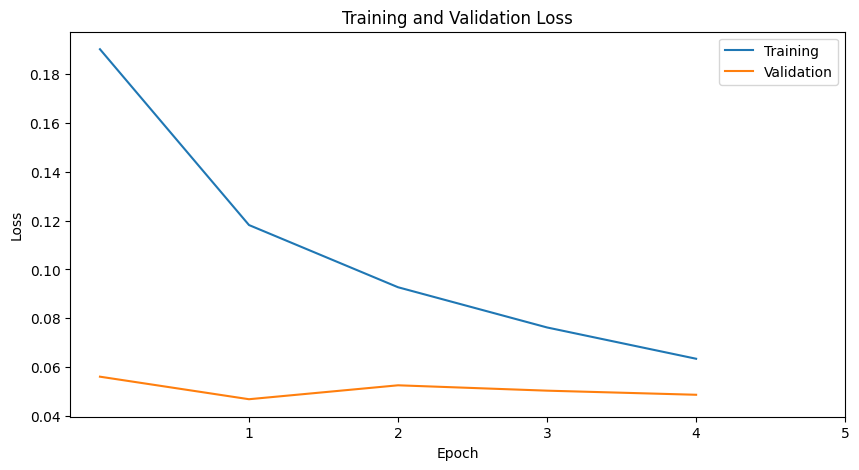

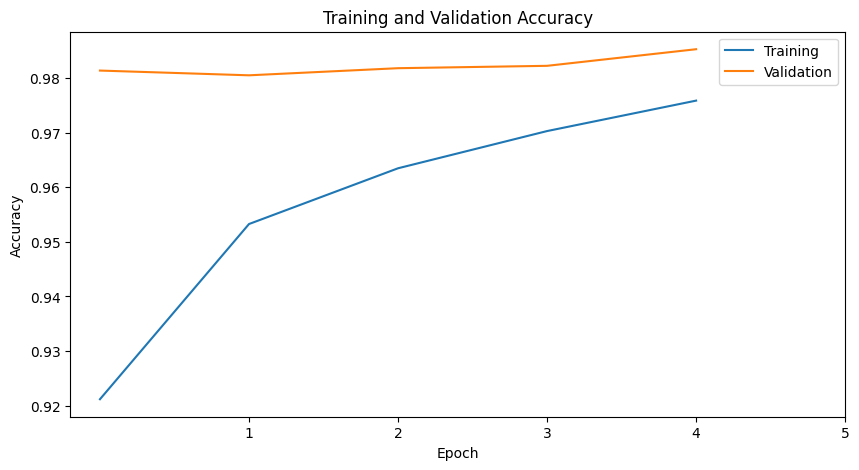

<ipython-input-2-6ccb86eb47dd>:241: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 14

Test F1: 0.9803


Predicting: 100%|██████████| 347/347 [01:39<00:00,  3.49it/s]


,id,label
0,test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg,1
1,test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg,0
2,test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg,0
3,test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg,0
4,test_data_v2/a16495c578b7494683805484ca27cf9f.jpg,0


In [ ]:
best_weight_decay = study.best_params["weight_decay"]
best_dropout_1 = study.best_params["dropout_1"]
best_dropout_2 = study.best_params["dropout_2"]
best_batch_size = study.best_params["batch_size"]
best_fc_neurons = study.best_params["fc_neurons"]

train_loader = DataLoader(train_dataset, batch_size=best_batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

final_model = ConvNextFeatureExtractor(best_dropout_1, best_dropout_2, best_fc_neurons).to(device)
optimizer = optim.AdamW([
    {'params': final_model.convnext.features[-2:].parameters(), 'lr': 1e-5},
    {'params': final_model.convnext.classifier.parameters(), 'lr': 1e-4}
], weight_decay=best_weight_decay)
scheduler = StepLR(optimizer, step_size=1)
criterion = nn.CrossEntropyLoss()

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    model_name,
    final_model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler=scheduler,
    num_epochs=50,
    patience=3,
    device=device
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

test_dataset = ConvNextDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform)

submit_dataset = ConvNextDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
test_loader = DataLoader(test_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

test_model(model_name, final_model, test_loader)
submit_model(model_name, final_model, submit_loader)

Scores

- Val F1: 0.9851
- Test F1: 0.9803
- Public Submission Score: 0.51908

Indeed, as an individual model, ConvNext scored much better than EfficientNet

# ✨Community Insight: use Thresholding

We attempt to further optimize the score using the thresholding method inspired by a community post above, along with integrating the superior ConvNext into the Soft Voting Ensemble

In [ ]:
from autogluon.tabular import TabularPredictor
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel

class ConvNextDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")
        convnext_img = self.transform_vit(image)
        
        if self.submit:
            return convnext_img, str(self.data.iloc[idx, 0])
        else:
            return convnext_img, torch.tensor(label, dtype=torch.long)

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")

        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        hand_features = extract_features(img_path)  

        if self.submit:
            return clip_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return clip_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"

###################################################

class RegNetFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate, fc_neurons):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, fc_neurons), 
            nn.BatchNorm1d(fc_neurons),
            nn.SiLU(),                
            nn.Dropout(dropout_rate),  
            nn.Linear(fc_neurons, 2) 
        )

    def forward(self, x):
        return self.regnet(x)  

class ConvNextFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate_1, dropout_rate_2, fc_neurons):
        super(ConvNextFeatureExtractor, self).__init__()
        self.convnext = models.convnext_large(weights="DEFAULT")
        for param in self.convnext.features.parameters():
            param.requires_grad = False
        for param in self.convnext.features[-2:].parameters():
            param.requires_grad = True

        self.convnext.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(1536, fc_neurons),
            nn.ReLU(),
            nn.Dropout(dropout_rate_1),  
            nn.Linear(fc_neurons, fc_neurons//2),
            nn.ReLU(),
            nn.Dropout(dropout_rate_2),
            nn.Linear(fc_neurons//2, 2)
        )

    def forward(self, x):
        return self.convnext(x)  

class HybridEnsemble(nn.Module):
    def __init__(self, clip_model, feature_dim=80):
        super(HybridEnsemble, self).__init__()
        self.clip_model = clip_model
        
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_fusion = nn.Linear(256 * 2, 2)

    def forward(self, clip_input, hand_features):
        clip_features = self.fc_clip(self.clip_model(clip_input))
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((clip_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

def dct_log_transform(image):
    """ Apply Discrete Cosine Transform (DCT) to extract handcrafted features. """
    image = np.array(image.convert("L"))  
    dct = cv2.dct(np.float32(image))  
    log_dct = np.log(np.abs(dct) + 1e-5)  
    
    handcrafted_dct_features = np.array([
        np.mean(log_dct[:10, :10]),  
        np.var(log_dct[:10, :10]),   
    ], dtype=np.float32)  

    return handcrafted_dct_features

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)

    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    dct_features = dct_log_transform(Image.open(image_path).convert("RGB"))
    
    noise_residual = compute_noise_residual(image, kernel_size=7)[:, [ 91,  88,  87,  93,  86,  89,  90,  84,  74,  79,  95,  70,  77, 81,  82, 121, 120, 122, 119, 107, 123, 117, 116, 124,  97, 118,  98,  99, 106, 101]].mean(axis=0).flatten() 
    fft_features = compute_fft_spectrum(image)[:, [ 16, 208, 217,   7,   1, 223, 207,  17, 221,   3, 215,   9,   0, 8, 216, 112, 144,  80,  81, 143,  83, 141,  79, 145,  84, 140, 142,  82, 139,  85, 182,  42, 178,  46, 176,  48, 181,  43, 185,  39, 186,  38, 179, 45, 183]].mean(axis=0).flatten()
    
    return np.concatenate((np.array([contrast, vibrancy, laplacian_var]), dct_features, noise_residual, fft_features), axis=0).astype(np.float32)

###################################################
regnet_model = RegNetFeatureExtractor(dropout_rate=0.21622893338373814, fc_neurons=128).to(device)
regnet_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_regnet.pth"))
regnet_model.eval()
submit_dataset = RegnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=32, shuffle=False, num_workers=4)
regnet_probs = get_model_probabilities(regnet_model, submit_loader)

convnext_model = ConvNextFeatureExtractor(dropout_1=0.20775115453912613, dropout_2=0.542857681415243, fc_neurons=512).to(device)
convnext_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_convnext.pth"))
convnext_model.eval()
submit_dataset = ConvNextDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=16, shuffle=False, num_workers=4)
convnext_probs = get_model_probabilities(convnext_model, submit_loader)

clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
extract_model = HybridEnsemble(clip_feature_extractor).to(device)
submit_dataset = HybridDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=256, shuffle=False, num_workers=4)
submit_df = extract_autogluon_features(extract_model, submit_loader, submit=True)
autogluon_model = TabularPredictor.load("/AIdentify_data/models/autogluon_ksamp_mean")
autogluon_probs = autogluon_model.predict_proba(submit_df).to_numpy()

# Define weight distribution (must sum to 1)
# Based on individual scores RegNet: 0.52577, ConvNext: 0.51908, AutoGluon: 0.64278
weights = np.array([0.2, 0.2, 0.6])

submit_probs = (weights[0] * regnet_probs +
               weights[1] * convnext_probs +
               weights[2] * autogluon_probs)

thresholds = np.linspace(0.3, 0.7, 10)
for threshold in thresholds:
    preds = (submit_probs[:, 1] >= threshold).astype(int)

    submission_df = pd.DataFrame({
        'id': pd.read_csv(submit_path)["id"].tolist(),
        'label': preds
    })

    submission_name = f"submission_soft_voting_ensemble_3_convnext_thresh_{threshold:.2f}.csv"
    submission_df.to_csv(submission_name, index=False)   


Public Submission Score: 0.73382, for threshold 0.34

This is our best submission score so far. It is interesting that the threshold is quite skewed (far from 0.5). If we did not play around with the threshold (threshold remains at 0.5), we would actually have gotten a score of 0.56892 😱

Comparing with the naive Regnet baseline (public submission score of 0.59381), the performance boost is 23.5%! 🤩

# ✨Community Insight: use Histogram Matching

Below we attempted the entire architecture using histogram matching, inspired by a community post above.

The only change is the following code and an additional parameter 'reference_images' in each of the model's Dataset classes to specifically apply histogram matching for AI-generated images only.

```
def histogram_match(source, reference):
    """Matches the histogram of the source image to the reference image."""
    matched = match_histograms(source, reference, channel_axis=-1)
    return matched

reference_images = []
train_df_split = pd.read_csv(f"{root_dir}/219_diverse_train_split_augmented.csv")
root_dir = "/AIdentify_data/blip_similarity/0.8"
for file in train_df_split[train_df_split['label'] == 0]['file_name'].sample(50):
    img = Image.open(os.path.join(root_dir, file)).convert('RGB')
    img = np.array(img)
    img = cv2.resize(img, (224, 224))
    reference_images.append(img)
```

In [ ]:
import optuna
from skimage.exposure import match_histograms

def train_model(
    model_name,
    model, 
    train_loader, 
    val_loader, 
    criterion, 
    optimizer, 
    scheduler=None, 
    num_epochs=10, 
    patience=3,  
    device="cuda"
):
    model.to(device)

    train_losses, train_accuracies = [], []
    val_losses, val_accuracies, val_f1s = [], [], []

    best_val_loss = float("inf")
    patience_counter = 0

    for epoch in range(num_epochs):
        model.train()
        epoch_loss, epoch_acc = 0.0, 0.0

        for data, label in tqdm(train_loader, desc=f"Training Epoch {epoch+1}"):
            data, label = data.to(device), label.to(device)

            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, label)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            preds = output.argmax(dim=1)
            epoch_acc += (preds == label).float().mean().item()

        epoch_loss /= len(train_loader)
        epoch_acc /= len(train_loader)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc)

        model.eval()
        val_loss, val_acc = 0.0, 0.0
        val_preds, val_labels = [], []

        with torch.no_grad():
            for data, label in tqdm(val_loader, desc=f"Validation Epoch {epoch+1}"):
                data, label = data.to(device), label.to(device)
                output = model(data)

                loss = criterion(output, label)
                val_loss += loss.item()

                preds = output.argmax(dim=1)
                val_acc += (preds == label).float().mean().item()

                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(label.cpu().numpy())

        val_loss /= len(val_loader)
        val_acc /= len(val_loader)
        val_f1 = f1_score(val_labels, val_preds, average="macro")  
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        print(
            f"Epoch [{epoch+1}/{num_epochs}] "
            f"Train Loss: {epoch_loss:.4f} | Train Acc: {epoch_acc:.4f} | "
            f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f}"
        )

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            model.eval()
            torch.save(model.state_dict(), f"best_{model_name}.pth")  
            model.train()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

        if scheduler:
            scheduler.step(val_loss)

    return train_losses, train_accuracies, val_losses, val_accuracies, val_f1s


# The change
def histogram_match(source, reference):
    """Matches the histogram of the source image to the reference image."""
    matched = match_histograms(source, reference, channel_axis=-1)
    return matched

reference_images = []
train_df_split = pd.read_csv(f"{root_dir}/219_diverse_train_split_augmented.csv")
root_dir = "/AIdentify_data/blip_similarity/0.8"
for file in train_df_split[train_df_split['label'] == 0]['file_name'].sample(50):
    img = Image.open(os.path.join(root_dir, file)).convert('RGB')
    img = np.array(img)
    img = cv2.resize(img, (224, 224))
    reference_images.append(img)

### Regnet

In [ ]:
class RegnetDataset(Dataset):
                                                                        # The change
    def __init__(self, csv_file, root_dir, transform_vit, submit=False, reference_images=None):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.reference_images = reference_images

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
            image = Image.open(img_path).convert("RGB")
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])
            
            image = Image.open(img_path).convert("RGB")
            # Apply histogram matching for AI-generated images
            if label == 1 and self.reference_images is not None:
                image = np.array(image)
                reference_image = random.choice(self.reference_images)
                image = histogram_match(image, reference_image)
                image = Image.fromarray(image)
                
        regnet_img = self.transform_vit(image)
        
        if self.submit:
            return regnet_img, str(self.data.iloc[idx, 0])
        else:
            return regnet_img, torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"
train_dataset = RegnetDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform, reference_images=reference_images)
val_dataset = RegnetDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform)

class RegNetFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate, fc_neurons):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, fc_neurons), 
            nn.BatchNorm1d(fc_neurons),
            nn.SiLU(),                
            nn.Dropout(dropout_rate),          
            nn.Linear(fc_neurons, 2), 
        )

    def forward(self, x):
        return self.regnet(x)  

model_name = "optuna_regnet_hist"

def objective(trial):
    """Objective function for Optuna to maximize macro F1-score."""

    lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_rate = trial.suggest_float("dropout", 0.2, 0.5)
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128])
    fc_neurons = trial.suggest_categorical("fc_neurons", [128, 256, 512, 1024])
    print(trial)
    print(f"lr: {lr}, weight_decay: {weight_decay}, dropout_rate: {dropout_rate}, batch_size: {batch_size}, fc_neurons: {fc_neurons}")
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = RegNetFeatureExtractor(dropout_rate=dropout_rate, fc_neurons=fc_neurons).to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.CrossEntropyLoss()

    _, _, _, _, val_f1s = train_model(
        model_name,
        model,
        train_loader,
        val_loader,
        criterion,
        optimizer,
        scheduler=None,
        num_epochs=4,  
        patience=2,
        device=device
    )

    return max(val_f1s)

study = optuna.create_study(direction="maximize")  
study.optimize(objective, n_trials=None, timeout=39000, n_jobs = -1)  

print(f"{model_name} Best Hyperparameters:\n{study.best_params}")


A new study created in memory with name: no-name-179400c2-6ded-4ede-bfec-8982d53474e7
Trial 3 finished with value: 0.8732935822549335 and parameters: {'lr': 0.0008968766264076245, 'weight_decay': 4.882039890942898e-06, 'dropout': 0.32521828415602405, 'batch_size': 128, 'fc_neurons': 512}. Best is trial 3 with value: 0.8732935822549335.
Trial 2 finished with value: 0.8159948051795646 and parameters: {'lr': 2.1863495259622024e-05, 'weight_decay': 1.794846841133669e-05, 'dropout': 0.40044193295219566, 'batch_size': 64, 'fc_neurons': 512}. Best is trial 3 with value: 0.8732935822549335.
Trial 0 finished with value: 0.8782257181583935 and parameters: {'lr': 0.0001392051393812394, 'weight_decay': 1.4342119779368103e-06, 'dropout': 0.442955232462382, 'batch_size': 64, 'fc_neurons': 1024}. Best is trial 0 with value: 0.8782257181583935.
Trial 1 finished with value: 0.8530693907993616 and parameters: {'lr': 7.378550699545635e-05, 'weight_decay': 1.5462201378523468e-06, 'dropout': 0.47201546210

In [ ]:
best_lr = study.best_params["lr"]
best_weight_decay = study.best_params["weight_decay"]
best_dropout = study.best_params["dropout"]
best_batch_size = study.best_params["batch_size"]
best_fc_neurons = study.best_params["fc_neurons"]

train_loader = DataLoader(train_dataset, batch_size=best_batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

final_model = RegNetFeatureExtractor(best_dropout, best_fc_neurons).to(device)
optimizer = optim.AdamW(final_model.parameters(), lr=best_lr, weight_decay=best_weight_decay)
criterion = nn.CrossEntropyLoss()
scheduler = StepLR(optimizer, step_size=1)

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    model_name,
    final_model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler=scheduler,
    num_epochs=50,
    patience=3,
    device=device
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

test_dataset = RegnetDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform)
submit_dataset = RegnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
test_loader = DataLoader(test_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

test_model(model_name, final_model, test_loader)
submit_model(model_name, final_model, submit_loader)

### ConvNext

In [ ]:
class ConvNextDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False, reference_images=None):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.reference_images = reference_images

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
            image = Image.open(img_path).convert("RGB")
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

            image = Image.open(img_path).convert("RGB")
            # Apply histogram matching for AI-generated images
            if label == 1 and self.reference_images is not None:
                image = np.array(image)
                reference_image = random.choice(self.reference_images)
                image = histogram_match(image, reference_image)
                image = Image.fromarray(image)

        convnext_img = self.transform_vit(image)
        
        if self.submit:
            return convnext_img, str(self.data.iloc[idx, 0])
        else:
            return convnext_img, torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"
train_dataset = ConvNextDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform, reference_images=reference_images)
val_dataset = ConvNextDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform)

class ConvNextFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate_1, dropout_rate_2, fc_neurons):
        super(ConvNextFeatureExtractor, self).__init__()
        self.convnext = models.convnext_large(weights="DEFAULT")
        for param in self.convnext.features.parameters():
            param.requires_grad = False
        for param in self.convnext.features[-2:].parameters():
            param.requires_grad = True

        self.convnext.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(1536, fc_neurons),
            nn.ReLU(),
            nn.Dropout(dropout_rate_1),  
            nn.Linear(fc_neurons, fc_neurons//2),
            nn.ReLU(),
            nn.Dropout(dropout_rate_2),
            nn.Linear(fc_neurons//2, 2)
        )

    def forward(self, x):
        return self.convnext(x)  

model_name = "optuna_convnext"

def objective(trial):
    """Objective function for Optuna to maximize macro F1-score."""

    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    dropout_rate_1 = trial.suggest_float("dropout_1", 0.2, 0.7)
    dropout_rate_2 = trial.suggest_float("dropout_2", 0.2, 0.7)
    batch_size = trial.suggest_categorical("batch_size", [8, 16, 32])
    fc_neurons = trial.suggest_categorical("fc_neurons", [1024, 768, 512, 256])
    print(trial)
    print(f"weight_decay: {weight_decay}, dropout_rate_1: {dropout_rate_1}, dropout_rate_2: {dropout_rate_2}, batch_size: {batch_size}, fc_neurons: {fc_neurons}")
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    model = ConvNextFeatureExtractor(dropout_rate_1=dropout_rate_1, dropout_rate_2=dropout_rate_2, fc_neurons=fc_neurons).to(device)
    optimizer = optim.AdamW([
        {'params': model.convnext.features[-2:].parameters(), 'lr': 1e-5},
        {'params': model.convnext.classifier.parameters(), 'lr': 1e-4}
    ], weight_decay=weight_decay)
    criterion = nn.CrossEntropyLoss()

    _, _, _, _, val_f1s = train_model(
        model_name,
        model,
        train_loader,
        val_loader,
        criterion,
        optimizer,
        scheduler=None,
        num_epochs=4,  
        patience=2,
        device=device
    )

    return max(val_f1s)

study = optuna.create_study(direction="maximize")  
study.optimize(objective, n_trials=None, timeout=32000, n_jobs = -1)  

print(f"{model_name} Best Hyperparameters:\n{study.best_params}")


10154.5s	451	[I 2025-04-17 05:23:57,605] Trial 0 finished with value: 0.7779568390125506 and parameters: {'weight_decay': 6.811959970067383e-05, 'dropout_1': 0.41535548998056127, 'dropout_2': 0.4578599306881325, 'batch_size': 32, 'fc_neurons': 1024}. Best is trial 0 with value: 0.7779568390125506.
22666.4s	452	[I 2025-04-17 08:52:29,500] Trial 4 finished with value: 0.7871594358434721 and parameters: {'weight_decay': 1.6561677695143902e-06, 'dropout_1': 0.2309498622303826, 'dropout_2': 0.36275220497110605, 'batch_size': 32, 'fc_neurons': 1024}. Best is trial 4 with value: 0.7871594358434721.
24114.7s	453	[I 2025-04-17 09:16:37,738] Trial 3 finished with value: 0.829001919626025 and parameters: {'weight_decay': 4.150563182980555e-06, 'dropout_1': 0.42775473177524126, 'dropout_2': 0.23569580601697782, 'batch_size': 16, 'fc_neurons': 768}. Best is trial 3 with value: 0.829001919626025.
33911.9s	454	[I 2025-04-17 11:59:55,004] Trial 5 finished with value: 0.8095598788700851 and parameters

Downloading: "https://download.pytorch.org/models/convnext_large-ea097f82.pth" to /root/.cache/torch/hub/checkpoints/convnext_large-ea097f82.pth
100%|██████████| 755M/755M [00:04<00:00, 170MB/s] 
Validation Epoch 1: 100%|██████████| 144/144 [00:33<00:00,  4.29it/s]


Epoch [1/50] Train Loss: 0.0803 | Train Acc: 0.9691 | Val Loss: 0.9115 | Val Acc: 0.7652 | Val F1: 0.7505


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
Validation Epoch 2: 100%|██████████| 144/144 [00:33<00:00,  4.31it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please op

Epoch [2/50] Train Loss: 0.0357 | Train Acc: 0.9870 | Val Loss: 1.0331 | Val Acc: 0.7496 | Val F1: 0.7310


Validation Epoch 3: 100%|██████████| 144/144 [00:33<00:00,  4.31it/s]


Epoch [3/50] Train Loss: 0.0223 | Train Acc: 0.9919 | Val Loss: 0.8983 | Val Acc: 0.7860 | Val F1: 0.7745


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
Validation Epoch 4: 100%|██████████| 144/144 [00:33<00:00,  4.32it/s]


Epoch [4/50] Train Loss: 0.0259 | Train Acc: 0.9904 | Val Loss: 0.8451 | Val Acc: 0.7791 | Val F1: 0.7661


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
Validation Epoch 5: 100%|██████████| 144/144 [00:33<00:00,  4.32it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please op

Epoch [5/50] Train Loss: 0.0205 | Train Acc: 0.9925 | Val Loss: 1.0646 | Val Acc: 0.7630 | Val F1: 0.7476


Validation Epoch 6: 100%|██████████| 144/144 [00:33<00:00,  4.32it/s]
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:240: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch [6/50] Train Loss: 0.0144 | Train Acc: 0.9951 | Val Loss: 1.0168 | Val Acc: 0.7808 | Val F1: 0.7684


Validation Epoch 7: 100%|██████████| 144/144 [00:33<00:00,  4.32it/s]


Epoch [7/50] Train Loss: 0.0125 | Train Acc: 0.9957 | Val Loss: 0.8791 | Val Acc: 0.8082 | Val F1: 0.7996
Early stopping triggered.


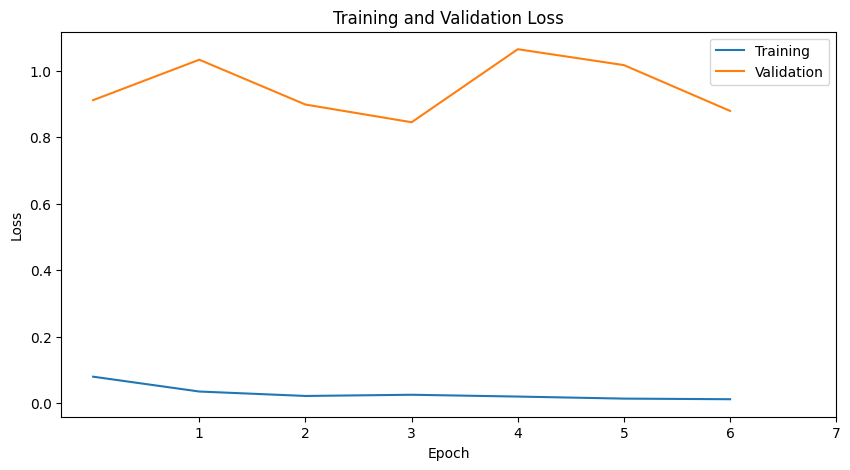

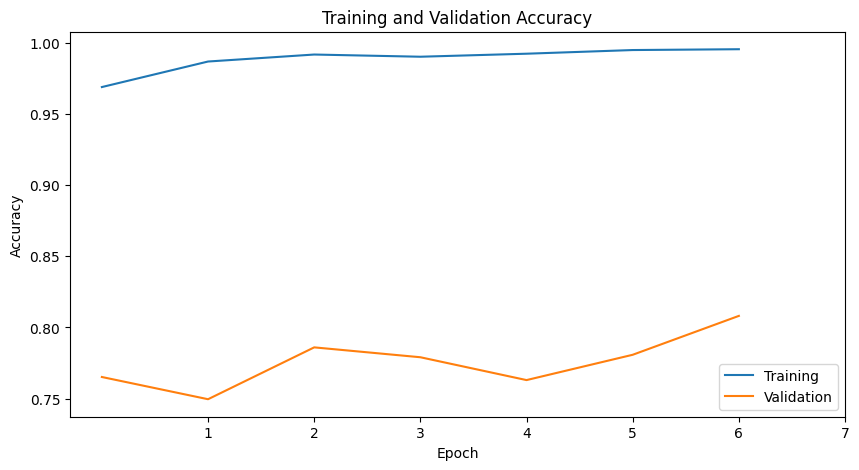

<ipython-input-2-6ccb86eb47dd>:241: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f"best_{model_name}.pth"))
Predicting: 100%|██████████| 14

Test F1: 0.7619


Predicting: 100%|██████████| 347/347 [01:45<00:00,  3.28it/s]


,id,label
0,test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg,0
1,test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg,0
2,test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg,0
3,test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg,0
4,test_data_v2/a16495c578b7494683805484ca27cf9f.jpg,0


In [ ]:
best_weight_decay = study.best_params["weight_decay"]
best_dropout_1 = study.best_params["dropout_1"]
best_dropout_2 = study.best_params["dropout_2"]
best_batch_size = study.best_params["batch_size"]
best_fc_neurons = study.best_params["fc_neurons"]

train_loader = DataLoader(train_dataset, batch_size=best_batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

final_model = ConvNextFeatureExtractor(best_dropout_1, best_dropout_2, best_fc_neurons).to(device)
optimizer = optim.AdamW([
    {'params': final_model.convnext.features[-2:].parameters(), 'lr': 1e-5},
    {'params': final_model.convnext.classifier.parameters(), 'lr': 1e-4}
], weight_decay=best_weight_decay)
scheduler = StepLR(optimizer, step_size=1)
criterion = nn.CrossEntropyLoss()

train_losses, train_accuracies, val_losses, val_accuracies, val_f1s = train_model(
    model_name,
    final_model,
    train_loader,
    val_loader,
    criterion,
    optimizer,
    scheduler=scheduler,
    num_epochs=50,
    patience=3,
    device=device
)
plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)

test_dataset = ConvNextDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform)

submit_dataset = ConvNextDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
test_loader = DataLoader(test_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=best_batch_size, shuffle=False, num_workers=4)

test_model(model_name, final_model, test_loader)
submit_model(model_name, final_model, submit_loader)

### Autogluon

In [ ]:
from transformers import CLIPProcessor, CLIPModel
from autogluon.tabular import TabularPredictor

def dct_log_transform(image):
    """ Apply Discrete Cosine Transform (DCT) to extract handcrafted features. """
    image = np.array(image.convert("L"))  
    dct = cv2.dct(np.float32(image))  
    log_dct = np.log(np.abs(dct) + 1e-5)  
    
    handcrafted_dct_features = np.array([
        np.mean(log_dct[:10, :10]),  
        np.var(log_dct[:10, :10]),   
    ], dtype=np.float32)

    return handcrafted_dct_features

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)

    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    dct_features = dct_log_transform(Image.open(image_path).convert("RGB"))
    
    noise_residual = compute_noise_residual(image, kernel_size=7)[:, [ 91,  88,  87,  93,  86,  89,  90,  84,  74,  79,  95,  70,  77, 81,  82, 121, 120, 122, 119, 107, 123, 117, 116, 124,  97, 118,  98,  99, 106, 101]].mean(axis=0).flatten() 
    fft_features = compute_fft_spectrum(image)[:, [ 16, 208, 217,   7,   1, 223, 207,  17, 221,   3, 215,   9,   0, 8, 216, 112, 144,  80,  81, 143,  83, 141,  79, 145,  84, 140, 142,  82, 139,  85, 182,  42, 178,  46, 176,  48, 181,  43, 185,  39, 186,  38, 179, 45, 183]].mean(axis=0).flatten()
    
    return np.concatenate((np.array([contrast, vibrancy, laplacian_var]), dct_features, noise_residual, fft_features), axis=0).astype(np.float32)

class HybridEnsemble(nn.Module):
    def __init__(self, clip_model, feature_dim=80):
        super(HybridEnsemble, self).__init__()
        self.clip_model = clip_model
        
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_fusion = nn.Linear(256 * 2, 2)

    def forward(self, clip_input, hand_features):
        clip_features = self.fc_clip(self.clip_model(clip_input))
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((clip_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
batch_size = 256
model = HybridEnsemble(clip_feature_extractor).to(device)

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False, reference_images=None):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.reference_images = reference_images

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
            image = Image.open(img_path).convert("RGB")
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

            image = Image.open(img_path).convert("RGB")
            # Apply histogram matching for AI-generated images
            if label == 1 and self.reference_images is not None:
                image = np.array(image)
                reference_image = random.choice(self.reference_images)
                image = histogram_match(image, reference_image)
                image = Image.fromarray(image)

        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        hand_features = extract_features(img_path)  

        if self.submit:
            return clip_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return clip_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"
train_dataset = HybridDataset(f"{root_dir}/219_diverse_train_split_augmented.csv", root_dir, transform_vit=imagenet_transform, reference_images=reference_images)
val_dataset = HybridDataset(f"{root_dir}/219_diverse_val_split.csv", root_dir, transform_vit=imagenet_transform)
test_dataset = HybridDataset(f"{root_dir}/219_diverse_test_split.csv", root_dir, transform_vit=imagenet_transform)
submit_dataset = HybridDataset(f"{root_dir}/test.csv", root_dir, transform_vit=imagenet_transform, submit=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
submit_loader = DataLoader(submit_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

train_df = extract_autogluon_features(model, train_loader, submit=False)
val_df = extract_autogluon_features(model, val_loader, submit=False)

predictor = TabularPredictor(
    label="label",  
    eval_metric="f1_macro" 
).fit(train_data=train_df, tuning_data=val_df, use_bag_holdout=True, presets="best_quality", time_limit=39000)
test_df = extract_autogluon_features(model, test_loader)
test_results = predictor.evaluate(test_df)

submit_df = extract_autogluon_features(model, submit_loader, submit=True)
submit_predictions = predictor.predict(submit_df)
submission_df = pd.DataFrame({
        'id': pd.read_csv(submit_path)["id"].tolist(),
        'label': submit_predictions
    })
submission_df.to_csv("submit_aug_hybrid_autogluon_residuals_ksamp_mean.csv", index=False)

### Soft voting (All together)

In [ ]:
from autogluon.tabular import TabularPredictor
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel

class RegnetDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False, reference_images=None):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.reference_images = reference_images

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
            image = Image.open(img_path).convert("RGB")
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])
            
            image = Image.open(img_path).convert("RGB")
            # Apply histogram matching for AI-generated images
            if label == 1 and self.reference_images is not None:
                image = np.array(image)
                reference_image = random.choice(self.reference_images)
                image = histogram_match(image, reference_image)
                image = Image.fromarray(image)
                
        regnet_img = self.transform_vit(image)
        
        if self.submit:
            return regnet_img, str(self.data.iloc[idx, 0])
        else:
            return regnet_img, torch.tensor(label, dtype=torch.long)

class ConvNextDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False, reference_images=None):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.reference_images = reference_images

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
            image = Image.open(img_path).convert("RGB")
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

            image = Image.open(img_path).convert("RGB")
            # Apply histogram matching for AI-generated images
            if label == 1 and self.reference_images is not None:
                image = np.array(image)
                reference_image = random.choice(self.reference_images)
                image = histogram_match(image, reference_image)
                image = Image.fromarray(image)

        convnext_img = self.transform_vit(image)
        
        if self.submit:
            return convnext_img, str(self.data.iloc[idx, 0])
        else:
            return convnext_img, torch.tensor(label, dtype=torch.long)

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False, reference_images=None):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit
        self.reference_images = reference_images

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
            image = Image.open(img_path).convert("RGB")
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

            image = Image.open(img_path).convert("RGB")
            # Apply histogram matching for AI-generated images
            if label == 1 and self.reference_images is not None:
                image = np.array(image)
                reference_image = random.choice(self.reference_images)
                image = histogram_match(image, reference_image)
                image = Image.fromarray(image)

        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        hand_features = extract_features(img_path)  

        if self.submit:
            return clip_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return clip_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

root_dir = "/AIdentify_data/blip_similarity/0.8"

###################################################

class RegNetFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate, fc_neurons):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, fc_neurons), 
            nn.BatchNorm1d(fc_neurons),
            nn.SiLU(),                
            nn.Dropout(dropout_rate),  
            nn.Linear(fc_neurons, 2) 
        )

    def forward(self, x):
        return self.regnet(x)  

class ConvNextFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate_1, dropout_rate_2, fc_neurons):
        super(ConvNextFeatureExtractor, self).__init__()
        self.convnext = models.convnext_large(weights="DEFAULT")
        for param in self.convnext.features.parameters():
            param.requires_grad = False
        for param in self.convnext.features[-2:].parameters():
            param.requires_grad = True

        self.convnext.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(1536, fc_neurons),
            nn.ReLU(),
            nn.Dropout(dropout_rate_1),  
            nn.Linear(fc_neurons, fc_neurons//2),
            nn.ReLU(),
            nn.Dropout(dropout_rate_2),
            nn.Linear(fc_neurons//2, 2)
        )

    def forward(self, x):
        return self.convnext(x)  

class HybridEnsemble(nn.Module):
    def __init__(self, clip_model, feature_dim=80):
        super(HybridEnsemble, self).__init__()
        self.clip_model = clip_model
        
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_fusion = nn.Linear(256 * 2, 2)

    def forward(self, clip_input, hand_features):
        clip_features = self.fc_clip(self.clip_model(clip_input))
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((clip_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

def dct_log_transform(image):
    """ Apply Discrete Cosine Transform (DCT) to extract handcrafted features. """
    image = np.array(image.convert("L"))  
    dct = cv2.dct(np.float32(image))  
    log_dct = np.log(np.abs(dct) + 1e-5)  
    
    handcrafted_dct_features = np.array([
        np.mean(log_dct[:10, :10]),  
        np.var(log_dct[:10, :10]),  
    ], dtype=np.float32) 

    return handcrafted_dct_features

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)

    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    dct_features = dct_log_transform(Image.open(image_path).convert("RGB"))
    
    noise_residual = compute_noise_residual(image, kernel_size=7)[:, [ 91,  88,  87,  93,  86,  89,  90,  84,  74,  79,  95,  70,  77, 81,  82, 121, 120, 122, 119, 107, 123, 117, 116, 124,  97, 118,  98,  99, 106, 101]].mean(axis=0).flatten() 
    fft_features = compute_fft_spectrum(image)[:, [ 16, 208, 217,   7,   1, 223, 207,  17, 221,   3, 215,   9,   0, 8, 216, 112, 144,  80,  81, 143,  83, 141,  79, 145,  84, 140, 142,  82, 139,  85, 182,  42, 178,  46, 176,  48, 181,  43, 185,  39, 186,  38, 179, 45, 183]].mean(axis=0).flatten()
    
    return np.concatenate((np.array([contrast, vibrancy, laplacian_var]), dct_features, noise_residual, fft_features), axis=0).astype(np.float32)

###################################################
regnet_model = RegNetFeatureExtractor(dropout_rate=0.2688981804748478, fc_neurons=1024).to(device)
regnet_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_regnet_hist.pth"))
regnet_model.eval()
submit_dataset = RegnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=32, shuffle=False, num_workers=4)
regnet_probs = get_model_probabilities(regnet_model, submit_loader)

convnext_model = ConvNextFeatureExtractor(dropout_1=0.42775473177524126, dropout_2=0.23569580601697782, fc_neurons=768).to(device)
convnext_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_convnext_hist.pth"))
convnext_model.eval()
submit_dataset = ConvNextDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=16, shuffle=False, num_workers=4)
convnext_probs = get_model_probabilities(convnext_model, submit_loader)

clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
extract_model = HybridEnsemble(clip_feature_extractor).to(device)
submit_dataset = HybridDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=256, shuffle=False, num_workers=4)
submit_df = extract_autogluon_features(extract_model, submit_loader, submit=True)
autogluon_model = TabularPredictor.load("/AIdentify_data/models/autogluon_ksamp_mean_new")
autogluon_probs = autogluon_model.predict_proba(submit_df).to_numpy()

# Define weight distribution (must sum to 1)
weights = np.array([0.2, 0.2, 0.6])

submit_probs = (weights[0] * regnet_probs +
               weights[1] * efficientnet_probs +
               weights[2] * autogluon_probs)
submit_predictions = np.argmax(submit_probs, axis=1)
submission_df = pd.DataFrame({
    'id': pd.read_csv(submit_path)["id"].tolist(),
    'label': submit_predictions
})
submission_df.to_csv("submission_soft_voting_ensemble.csv", index=False)

While histogram matching was introduced to help align the appearance of AI-generated images with real ones during training, the final public submission score dropped significantly (0.34592). We think this counterintuitive result can be attributed to a few key issues:

1. Inconsistency & Randomness in Reference Images
    - Only a random sample of 50 real images was used as reference.
    - These samples were not representative of the full distribution, introducing inconsistent shifts in pixel intensity across AI-generated images.
    - This caused each model to be trained on slightly different distributions, hurting ensemble synergy.

2. Artificial Similarity Confusion
    - By forcing AI images to visually resemble real ones through histogram alignment, the model may have learned artifacts of the transformation rather than meaningful differences.
    - This might confuse discriminative learning, especially for features like vibrancy or contrast — which were originally strong indicators of AI generation.

3. Degraded Ensemble Coherence
    - Histogram matching broke the consistency across folds/models by altering images differently in each training phase.
    - Ensemble methods rely on diversity of models, not randomness of inputs, and this transformation introduced unintended noise.

# Conclusion

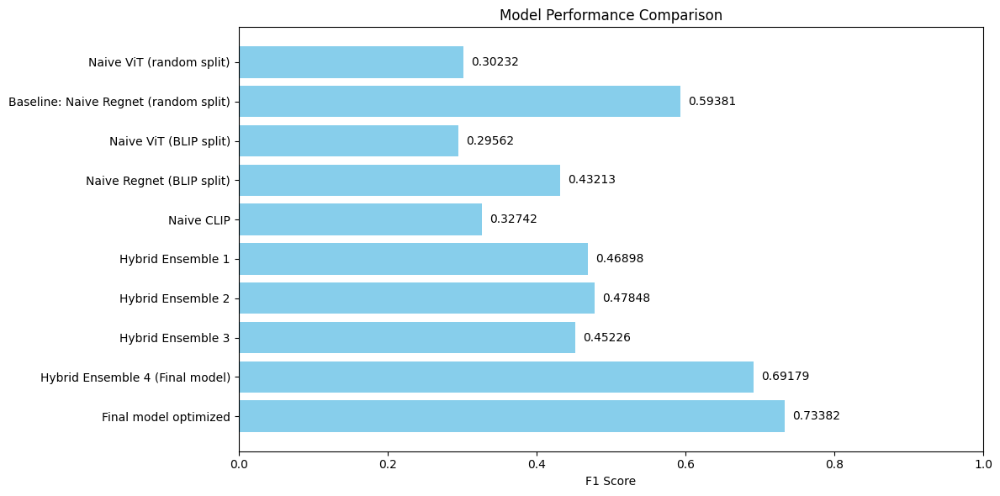

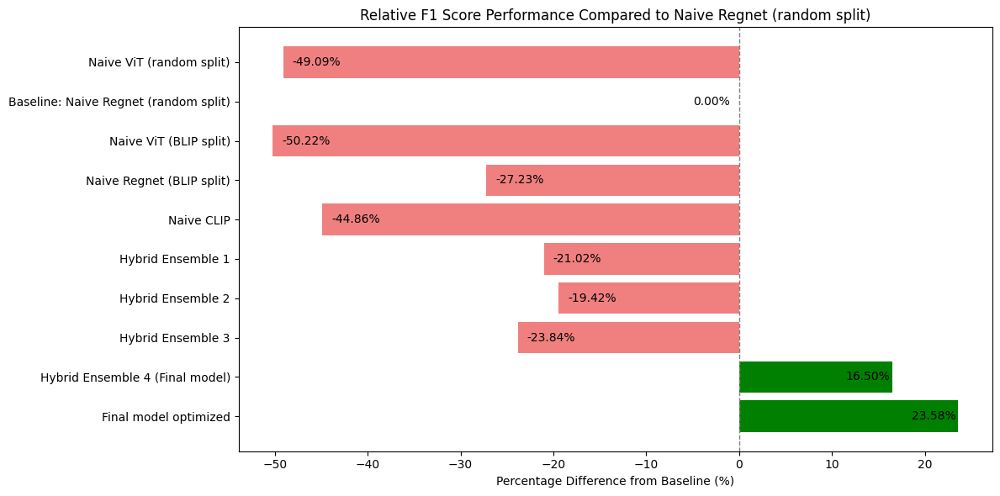

We further evaluated our final model using the [GenImage benchmark: A Million-Scale Benchmark for Detecting AI-Generated (AIG) Images](https://neurips.cc/media/neurips-2023/Slides/73644.pdf). From this benchmark, we curated a test set of 4,594 images—approximately matching the size of the competition's provided test set—by sampling from eight image generators included in GenImage: Midjourney, Stable Diffusion v1.4, Stable Diffusion v1.5, ADM, GLIDE, Wukong, VQDM, and BigGAN. For each generator, we aimed to randomly select 700 images, comprising 350 AI-generated and 350 real images where available. However, this was not always feasible—GLIDE only included 44 real (nature) images, and both Midjourney and Wukong lacked real images entirely, containing only AI-generated content.

The results of this evaluation are summarized below, revealing notable trends in the model's generalization ability. Our model demonstrated a consistent bias toward predicting images as real, and while it performed best on AI-generated content from Wukong and Midjourney, it struggled significantly with images from BigGAN and VQDM. This performance disparity highlights a key limitation of our approach: although fine-tuned on DeepMedia-generated content, the model does not generalize effectively to images produced by other generative systems. These findings underscore the challenges of building detectors that are robust across diverse generative models and content domains.

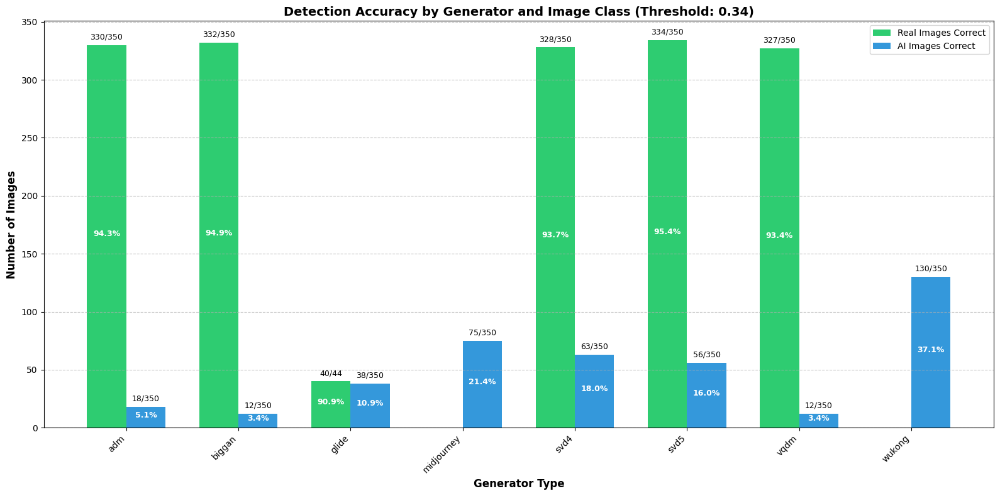

In [ ]:
# Curate benchmark data

import os
import random
import pandas as pd
from PIL import Image, UnidentifiedImageError

root_dir = "/benchmark"
generators = ['adm', 'biggan', 'glide', 'midjourney', 'svd4', 'svd5', 'vqdm', 'wukong']
MAX_IMAGES = 350
csv_data = []

for generator in generators:
    gen_path = os.path.join(root_dir, generator)
    
    for label_name, label in [('ai', 1), ('nature', 0)]:
        folder_path = os.path.join(gen_path, label_name)
        
        # Skip if folder doesn't exist (e.g. no nature folder for midjourney/wukong)
        if not os.path.isdir(folder_path):
            continue

        all_images = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        random.shuffle(all_images)  

        selected_images = []
        for img_name in all_images:
            if len(selected_images) >= MAX_IMAGES:
                break
            img_path = os.path.join(folder_path, img_name)
            try:
                with Image.open(img_path) as img:
                    img.verify()  # Verify it can be opened
                selected_images.append(img_name)
                csv_data.append({
                    'file_name': f"{generator}/{label_name}/{img_name}".replace("\\", "/"),
                    'label': label
                })
            except UnidentifiedImageError:
                print(f"Skipping unreadable image: {img_path}")
                continue

        # Delete unselected images
        to_delete = set(all_images) - set(selected_images)
        for img in to_delete:
            try:
                os.remove(os.path.join(folder_path, img))
            except Exception as e:
                print(f"Error deleting {img}: {e}")

csv_path = os.path.join(root_dir, 'genimage_benchmark_labels.csv')
df = pd.DataFrame(csv_data)
df.to_csv(csv_path, index=False)

In [ ]:
# Evaluate against benchmark data

root_dir = "/benchmark"
submit_path = "/kaggle/input/benchmark/benchmark/genimage_benchmark_labels.csv"

from autogluon.tabular import TabularPredictor
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel

class ConvNextDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")
        convnext_img = self.transform_vit(image)
        
        if self.submit:
            return convnext_img, str(self.data.iloc[idx, 0])
        else:
            return convnext_img, torch.tensor(label, dtype=torch.long)

class HybridDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform_vit, submit=False):
        self.data = pd.read_csv(csv_file, dtype={'file_name': str})
        self.root_dir = root_dir
        self.transform_vit = transform_vit
        self.submit = submit

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        if self.submit:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 0]))
        else:
            img_path = os.path.join(self.root_dir, str(self.data.iloc[idx, 1]))
            label = int(self.data.iloc[idx, 2])

        image = Image.open(img_path).convert("RGB")

        clip_img = clip_processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)
        hand_features = extract_features(img_path)  

        if self.submit:
            return clip_img, torch.tensor(hand_features), str(self.data.iloc[idx, 0])
        else:
            return clip_img, torch.tensor(hand_features), torch.tensor(label, dtype=torch.long)

###################################################

class RegNetFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate, fc_neurons):
        super(RegNetFeatureExtractor, self).__init__()
        self.regnet = models.regnet_y_800mf(weights=models.RegNet_Y_800MF_Weights.IMAGENET1K_V2)
        for param in self.regnet.parameters():
            param.requires_grad = False
        
        block4_section1 = getattr(self.regnet.trunk_output.block4, 'block4-1')
        block4_section1.requires_grad_(True)
        
        num_ftrs = self.regnet.fc.in_features

        self.regnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, fc_neurons), 
            nn.BatchNorm1d(fc_neurons),
            nn.SiLU(),                
            nn.Dropout(dropout_rate),  
            nn.Linear(fc_neurons, 2) 
        )

    def forward(self, x):
        return self.regnet(x)  

class ConvNextFeatureExtractor(nn.Module):
    def __init__(self, dropout_rate_1, dropout_rate_2, fc_neurons):
        super(ConvNextFeatureExtractor, self).__init__()
        self.convnext = models.convnext_large(weights="DEFAULT")
        for param in self.convnext.features.parameters():
            param.requires_grad = False
        for param in self.convnext.features[-2:].parameters():
            param.requires_grad = True

        self.convnext.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(1536, fc_neurons),
            nn.ReLU(),
            nn.Dropout(dropout_rate_1),  
            nn.Linear(fc_neurons, fc_neurons//2),
            nn.ReLU(),
            nn.Dropout(dropout_rate_2),
            nn.Linear(fc_neurons//2, 2)
        )

    def forward(self, x):
        return self.convnext(x)  

class HybridEnsemble(nn.Module):
    def __init__(self, clip_model, feature_dim=80):
        super(HybridEnsemble, self).__init__()
        self.clip_model = clip_model
        
        self.fc_clip = nn.Sequential(
            nn.Linear(768, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_handcrafted = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.BatchNorm1d(256),
            nn.SiLU(),
            nn.Dropout(0.2),
        )

        self.fc_fusion = nn.Linear(256 * 2, 2)

    def forward(self, clip_input, hand_features):
        clip_features = self.fc_clip(self.clip_model(clip_input))
        hand_features = self.fc_handcrafted(hand_features)

        combined_features = torch.cat((clip_features, hand_features), dim=1)
        return self.fc_fusion(combined_features)

def dct_log_transform(image):
    """ Apply Discrete Cosine Transform (DCT) to extract handcrafted features. """
    image = np.array(image.convert("L"))  
    dct = cv2.dct(np.float32(image))  
    log_dct = np.log(np.abs(dct) + 1e-5)  
    
    handcrafted_dct_features = np.array([
        np.mean(log_dct[:10, :10]),  
        np.var(log_dct[:10, :10]),   
    ], dtype=np.float32)  

    return handcrafted_dct_features

def extract_features(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224,224))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast = np.std(gray)

    vibrancy = np.mean(cv2.cvtColor(image, cv2.COLOR_BGR2HSV)[:, :, 1])

    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    dct_features = dct_log_transform(Image.open(image_path).convert("RGB"))
    
    noise_residual = compute_noise_residual(image, kernel_size=7)[:, [ 91,  88,  87,  93,  86,  89,  90,  84,  74,  79,  95,  70,  77, 81,  82, 121, 120, 122, 119, 107, 123, 117, 116, 124,  97, 118,  98,  99, 106, 101]].mean(axis=0).flatten() 
    fft_features = compute_fft_spectrum(image)[:, [ 16, 208, 217,   7,   1, 223, 207,  17, 221,   3, 215,   9,   0, 8, 216, 112, 144,  80,  81, 143,  83, 141,  79, 145,  84, 140, 142,  82, 139,  85, 182,  42, 178,  46, 176,  48, 181,  43, 185,  39, 186,  38, 179, 45, 183]].mean(axis=0).flatten()
    
    return np.concatenate((np.array([contrast, vibrancy, laplacian_var]), dct_features, noise_residual, fft_features), axis=0).astype(np.float32)

###################################################
regnet_model = RegNetFeatureExtractor(dropout_rate=0.21622893338373814, fc_neurons=128).to(device)
regnet_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_regnet.pth"))
regnet_model.eval()
submit_dataset = RegnetDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=32, shuffle=False, num_workers=4)
regnet_probs = get_model_probabilities(regnet_model, submit_loader)

convnext_model = ConvNextFeatureExtractor(dropout_1=0.20775115453912613, dropout_2=0.542857681415243, fc_neurons=512).to(device)
convnext_model.load_state_dict(torch.load("/AIdentify_data/models/optuna_convnext.pth"))
convnext_model.eval()
submit_dataset = ConvNextDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=16, shuffle=False, num_workers=4)
convnext_probs = get_model_probabilities(convnext_model, submit_loader)

clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")
clip_feature_extractor = CLIPFeatureExtractor(clip_model).to(device)
extract_model = HybridEnsemble(clip_feature_extractor).to(device)
submit_dataset = HybridDataset(submit_path, root_dir, transform_vit=imagenet_transform, submit=True)
submit_loader = DataLoader(submit_dataset, batch_size=256, shuffle=False, num_workers=4)
submit_df = extract_autogluon_features(extract_model, submit_loader, submit=True)
autogluon_model = TabularPredictor.load("/AIdentify_data/models/autogluon_ksamp_mean")
autogluon_probs = autogluon_model.predict_proba(submit_df).to_numpy()

# Define weight distribution (must sum to 1)
# Based on individual scores RegNet: 0.52577, ConvNext: 0.51908, AutoGluon: 0.64278
weights = np.array([0.2, 0.2, 0.6])

submit_probs = (weights[0] * regnet_probs +
               weights[1] * convnext_probs +
               weights[2] * autogluon_probs)


benchmark_df = pd.read_csv(f"{root_dir}/genimage_benchmark_labels.csv")
benchmark_df['generator'] = benchmark_df['file_name'].apply(lambda x: x.split('/')[0] if '/' in x else 'real')
thresholds = [0.34, 0.5]

for threshold in thresholds:
    preds = (submit_probs[:, 1] >= threshold).astype(int)
    
    # Add predictions to the dataframe
    benchmark_df['prediction'] = preds
    
    # Calculate overall metrics
    accuracy = accuracy_score(benchmark_df['label'], preds)
    f1 = f1_score(benchmark_df['label'], preds)
    
    print(f"\nThreshold: {threshold:.2f}")
    print(f"Overall Accuracy: {accuracy:.4f}")
    print(f"Overall F1-score: {f1:.4f}")
    
    # Analyze performance by generator type
    print("\nAccuracy by Generator Type:")
    plt.figure(figsize=(16, 10))

    # Get unique generators
    generators = sorted(benchmark_df['generator'].unique())
    real_correct = []
    real_total = []
    ai_correct = []
    ai_total = []
    
    for generator in generators:
        generator_df = benchmark_df[benchmark_df['generator'] == generator]
        
        # Real images (label=0)
        real_df = generator_df[generator_df['label'] == 0]
        real_correct_count = ((real_df['label'] == 0) & (real_df['prediction'] == 0)).sum()
        real_total_count = len(real_df)
        
        # AI-generated images (label=1)
        ai_df = generator_df[generator_df['label'] == 1]
        ai_correct_count = ((ai_df['label'] == 1) & (ai_df['prediction'] == 1)).sum()
        ai_total_count = len(ai_df)
        
        real_correct.append(real_correct_count)
        real_total.append(real_total_count)
        ai_correct.append(ai_correct_count)
        ai_total.append(ai_total_count)
    
    # Set up the bar positions
    x = np.arange(len(generators))
    width = 0.35
    
    # Create the bar plot
    fig, ax = plt.subplots(figsize=(16, 8))
    bars1 = ax.bar(x - width/2, real_correct, width, label='Real Images Correct', color='#2ecc71')
    bars2 = ax.bar(x + width/2, ai_correct, width, label='AI Images Correct', color='#3498db')
    
    # Add labels above each bar showing "correct/total"
    for i, (correct, total) in enumerate(zip(real_correct, real_total)):
        if total > 0:  # Avoid division by zero
            ax.annotate(f'{correct}/{total}',
                        xy=(i - width/2, correct + 5),
                        ha='center',
                        fontsize=9)
    
    for i, (correct, total) in enumerate(zip(ai_correct, ai_total)):
        if total > 0:  # Avoid division by zero
            ax.annotate(f'{correct}/{total}',
                        xy=(i + width/2, correct + 5),
                        ha='center',
                        fontsize=9)
    
    # Customize the plot
    ax.set_xlabel('Generator Type', fontsize=12, fontweight='bold')
    ax.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
    ax.set_title(f'Detection Accuracy by Generator and Image Class (Threshold: {threshold:.2f})', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(generators, rotation=45, ha='right', fontsize=10)
    ax.legend(fontsize=10)
    
    # Add a grid for better readability
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add percentage labels inside each bar
    for i, bar in enumerate(bars1):
        height = bar.get_height()
        if real_total[i] > 0:  # Avoid division by zero
            percentage = (height / real_total[i]) * 100
            ax.annotate(f'{percentage:.1f}%',
                       xy=(bar.get_x() + bar.get_width()/2, height/2),
                       ha='center',
                       fontsize=9,
                       fontweight='bold',
                       color='white')
    
    for i, bar in enumerate(bars2):
        height = bar.get_height()
        if ai_total[i] > 0:  # Avoid division by zero
            percentage = (height / ai_total[i]) * 100
            ax.annotate(f'{percentage:.1f}%',
                       xy=(bar.get_x() + bar.get_width()/2, height/2),
                       ha='center',
                       fontsize=9,
                       fontweight='bold',
                       color='white')
    
    plt.tight_layout()
    plt.show()
    
    # Save predictions to CSV
    submission_df = pd.DataFrame({
        'file_name': benchmark_df["file_name"].tolist(),
        'label': benchmark_df["label"].tolist(),
        'prediction': preds,
        'generator': benchmark_df["generator"].tolist()
    })
    
    submission_name = f"benchmark_threshold_{threshold:.2f}.csv"
    submission_df.to_csv(submission_name, index=False)
    print(f"\nSaved {submission_name}")


## Challenges Faced

Throughout this project, we encountered several significant challenges:
- Limited Prior Experience: We began with uncertainty about which models and architectures would be a good starting point for AIG image detection, requiring extensive research to find a starting point and then optimal approaches.
- Computational Constraints: The Kaggle platform imposed significant computational limitations, with long processing times for data preparation and model training that restricted the number of experiments we could conduct.
- Code Management Complexity: Managing and debugging lengthy code pipelines became increasingly difficult as our approach grew more sophisticated.
- Optimization Uncertainty: When models underperformed, we were often unclear which components needed modification, leading to time-consuming trial-and-error testing.

## Learning Points

Despite these challenges, the project yielded valuable insights:
- Architecture Knowledge: We gained hands-on experience with state-of-the-art models and learned effective ways to modify them for specialized tasks like AI image detection.
- Competition Strategy: We discovered techniques specific to Kaggle competitions that differ from standard ML practices, such as optimizing prediction thresholds and leveraging raw image statistics rather than always applying normalization.
- Frequency Domain Importance: Perhaps most significantly, we learned the critical role of frequency domain analysis in detecting AI-generated images, providing features that are often invisible in the spatial domain.


## Future Directions

Looking ahead, several areas warrant further exploration:
- Model Simplification: Our final solution is relatively complex. Following Occam's Razor, future work should focus on pruning unnecessary components while maintaining performance, as community insights suggest simpler approaches may achieve comparable results.
- Enhanced Data Splitting: While our BLIP splitting strategy proved effective, further fine-tuning could perhaps yield even better results, particularly given that some successful submissions achieved strong performance without sophisticated splitting techniques.
